In [2]:
import sys
from scipy.io import mmread
import os
import glob
import pandas as pd
import numpy as np
#from pandas_ods_reader import read_ods
from copy import deepcopy
import pprint
import json
import re
from datetime import datetime
import logging
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import HuberRegressor
from sklearn import preprocessing
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from scipy.spatial.distance import pdist
from scipy.spatial.distance import squareform
from sklearn.manifold import TSNE
from sklearn import metrics
from sklearn.cluster import DBSCAN
import seaborn as sns
from sklearn.neighbors import NearestNeighbors
from collections import Counter
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage
import harmonypy as hm
from matplotlib.cm import ScalarMappable
from datetime import date
import mpld3
import hvplot.pandas
import holoviews as hv
from holoviews import opts
import panel as pn
import bokeh
from bokeh.resources import INLINE
from adjustText import adjust_text
from scipy.stats import mannwhitneyu, false_discovery_control, wilcoxon, pearsonr
import pygwalker as pyg
import matplotlib as mpl 
import PyPDF2
from PyPDF2 import PdfFileReader, PdfFileWriter, PdfReader, PdfWriter
from matplotlib.backends.backend_pdf import PdfPages
from pdf2image import convert_from_path
from scipy.cluster.hierarchy import dendrogram, linkage, optimal_leaf_ordering, leaves_list
import fitz  # PyMuPDF
from marsilea.plotter import SizedMesh

import corr_analysis as ca
import dimorph_processing as dp
import cell_comparison as cc
import sex_stats as ss
import run_corr_analysis as rca
import spin as spin
 

today = str(date.today())
%matplotlib notebook
%load_ext autoreload
%autoreload 2

#change matplotlib font type to make compatibile with illustrator
#mpl.rcParams['pdf.fonttype'] = 42
#mpl.rcParams['ps.fonttype'] = 42

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Updated IEG lists from Amit

In [3]:
IEG_updated_list = []
with open('/bigdata/isaac/IEG_updated_list.txt', 'r') as fh:
    for g in fh:
        IEG_updated_list.append(g[:-1])
IEG_updated_list

['Bdnf',
 'Homer1',
 'Fos',
 'Arc',
 'Btg2',
 'Fosl2',
 'Npas4',
 'Nr4a1',
 'Fosb',
 'Junb',
 'Egr1',
 'Egr2',
 'Egr4',
 'Nr4a3',
 'Dusp1',
 'Dusp6',
 'Cdkn1a',
 'Gadd45b',
 'Inhba']

In [4]:
len(IEG_updated_list)

19

In [5]:
run = '050325_run_IEG'
cell_class = 'Vglut2'
delta_data_folder = '/bigdata/isaac/'+ cell_class + '_files/sex_stats/'+run+'/gene_delta_plots/data/'
genes = IEG_updated_list
gene_subset_name = 'IEG'
outfolder = '/bigdata/isaac/'+ cell_class + '_files/sex_stats/'+run +'/' + gene_subset_name + '_corr_plots/'
os.makedirs(outfolder, exist_ok=True)

# Change the current working directory to the specified path
os.chdir(delta_data_folder)

# Get a list of all files in the directory that include '_expr_mlog_df_c_'
raw_files = [f for f in os.listdir() if '_expr_raw_df_c_' in f]
metadata_files= [f for f in os.listdir() if '_metadata_df_c_' in f]

def extract_number(filename):
    match = re.search(r'-(\d+)-', filename)
    if match:
        return int(match.group(1))
    return float('inf')  # In case no number is found, place it at the end


# Sort the lists based on the extracted number
sorted_raw_files = sorted(raw_files, key=extract_number)
sorted_metadata_files = sorted(metadata_files, key=extract_number)

print ('sorted raw files/metadata files')
print(sorted_raw_files)
print(sorted_metadata_files)

sorted raw files/metadata files
['Vglut2_expr_raw_df_c_Vglut2-1-Trh-Tes.json', 'Vglut2_expr_raw_df_c_Vglut2-2-Synpr-Sox6.json', 'Vglut2_expr_raw_df_c_Vglut2-3-Tshz1-Tgfb2.json', 'Vglut2_expr_raw_df_c_Vglut2-4-Otp-Crabp1.json', 'Vglut2_expr_raw_df_c_Vglut2-5-Otp-Peg10.json', 'Vglut2_expr_raw_df_c_Vglut2-6-Otp-Zic5.json', 'Vglut2_expr_raw_df_c_Vglut2-7-Otp-Prlr.json', 'Vglut2_expr_raw_df_c_Vglut2-8-Arhgef40-Thrsp.json', 'Vglut2_expr_raw_df_c_Vglut2-9-Epha4-Penk.json', 'Vglut2_expr_raw_df_c_Vglut2-10-Lamb3-Col18a1.json', 'Vglut2_expr_raw_df_c_Vglut2-11-Tac1-Cartpt.json', 'Vglut2_expr_raw_df_c_Vglut2-12-Tshz1-Grp.json', 'Vglut2_expr_raw_df_c_Vglut2-13-Tshz1-Calcr.json', 'Vglut2_expr_raw_df_c_Vglut2-14-Zfhx4-Nr4a2.json', 'Vglut2_expr_raw_df_c_Vglut2-15-Eomes-Tnfaip8.json', 'Vglut2_expr_raw_df_c_Vglut2-17-Otp-Avp.json']
['Vglut2_metadata_df_c_Vglut2-1-Trh-Tes.json', 'Vglut2_metadata_df_c_Vglut2-2-Synpr-Sox6.json', 'Vglut2_metadata_df_c_Vglut2-3-Tshz1-Tgfb2.json', 'Vglut2_metadata_df_c_Vglut2

In [6]:
outfolder

'/bigdata/isaac/Vglut2_files/sex_stats/050325_run_IEG/IEG_corr_plots/'

In [7]:
len(sorted_raw_files)

16

In [8]:
sorted_raw_files[-1]

'Vglut2_expr_raw_df_c_Vglut2-17-Otp-Avp.json'

In [9]:
sorted_raw_files[9]

'Vglut2_expr_raw_df_c_Vglut2-10-Lamb3-Col18a1.json'

In [10]:
outfolder

'/bigdata/isaac/Vglut2_files/sex_stats/050325_run_IEG/IEG_corr_plots/'

In [11]:
gene_subsets_all = ['ieg','mem','gabarec','glutrec','sema','calcium','potassium']

gene_list = []
for gene_subset_name in gene_subsets_all:
    with open('/bigdata/isaac/' + gene_subset_name +'_gene_list.txt', 'r') as fh:
        for g in fh:
            gene_list.append(g[:-1])

gene_list = [s.capitalize() for s in gene_list]
gene_list = np.unique(gene_list)

In [12]:
outfolder

'/bigdata/isaac/Vglut2_files/sex_stats/050325_run_IEG/IEG_corr_plots/'

processing:  Vglut2-10-Lamb3-Col18a1
Cacng not in raw_df
Gabbr3 not in raw_df
Gabrb4 not in raw_df
Gabrb5 not in raw_df
removing missing genes from gene list
calc p_corr_matrix_b_f
0
check if unique pvals as inf: False
calc p_corr_matrix_b_m
1
check if unique pvals as inf: False
calc p_corr_matrix_n_f
0
check if unique pvals as inf: False
calc p_corr_matrix_n_m
0
check if unique pvals as inf: False


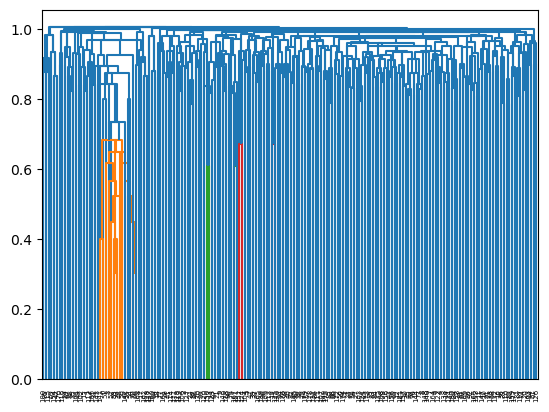

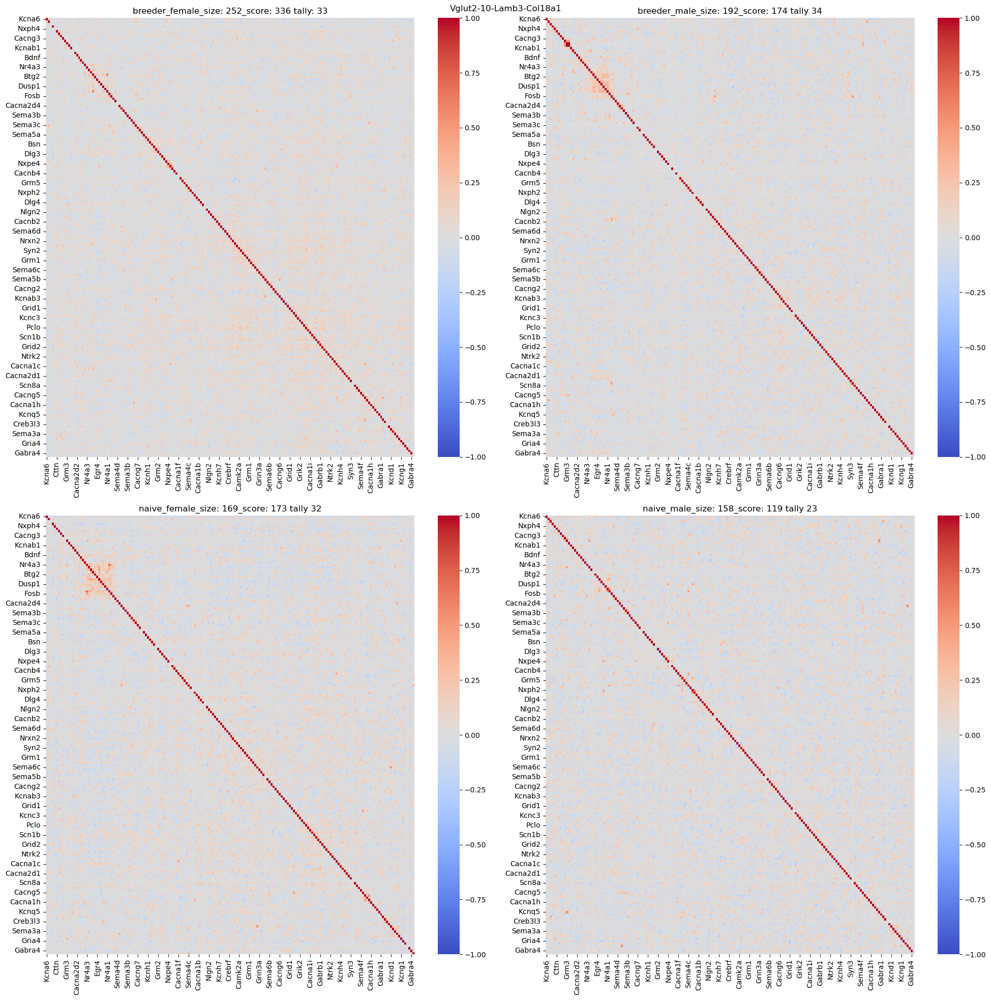

In [ ]:
#%%timeit


genes = gene_list
%matplotlib inline

scores_df = pd.DataFrame(columns=['fn','b_f','b_m','n_f','n_m'])
tallys_df = pd.DataFrame(columns=['fn','b_f','b_m','n_f','n_m'])
counts_df = pd.DataFrame(columns=['fn','b_f','b_m','n_f','n_m'])

data_file = sorted_raw_files[9]
metadata_file = sorted_metadata_files[9]


#debug single cell type
raw_df = pd.read_json(data_file)
metadata_df = pd.read_json(metadata_file)

#ensure that the columns are the same
if np.all(raw_df.columns == metadata_df.columns) != True:
    print('error: columns are not the same')
    
#get filename
x = data_file.split('_')
fn = x[-1].split('.')[0]
print('processing: ', fn)

#check if the gene is in the raw_df
missing_genes = []
for g in genes:
    if g in raw_df.index:
        pass
    else:
        print (g, 'not in raw_df')
        missing_genes.append(g)

#drop missing genes from original gene list
if len(missing_genes)>0:
    print ('removing missing genes from gene list')
    genes = [x for x in genes if x not in missing_genes]

#subset the raw_df to only include specified genes
subset_df = raw_df.loc[genes,:]

#drop rows with all zeros
subset_df = subset_df.loc[~(subset_df == 0).all(axis=1)]

#get subset of cells for each group
b_f_subset_df = subset_df.loc[:,metadata_df.loc['Group'] == 'Breeder-F']
b_m_subset_df = subset_df.loc[:,metadata_df.loc['Group'] == 'Breeder-M']
n_f_subset_df = subset_df.loc[:,metadata_df.loc['Group'] == 'Naïve-F']   
n_m_subset_df = subset_df.loc[:,metadata_df.loc['Group'] == 'Naïve-M'] 

#if clustermap:
#drop rows with all zeros
#b_f_subset_df = b_f_subset_df.loc[~(b_f_subset_df == 0).all(axis=1)]
#b_m_subset_df = b_m_subset_df.loc[~(b_m_subset_df == 0).all(axis=1)]
#n_f_subset_df = n_f_subset_df.loc[~(n_f_subset_df == 0).all(axis=1)]
#n_m_subset_df = n_m_subset_df.loc[~(n_m_subset_df == 0).all(axis=1)]

#check group sizes
cutoff = 20
if b_f_subset_df.shape[1] <cutoff or b_m_subset_df.shape[1] <cutoff  or n_f_subset_df.shape[1] <cutoff or n_m_subset_df.shape[1] < cutoff:
    print ('one or more groups has <20 cells, skipping...')

else:
    #get the correlation matrix for each group
    coeff_matrix_b_f, p_corr_matrix_b_f_raw = ca.compute_corr_matrix(b_f_subset_df)
    coeff_matrix_b_m, p_corr_matrix_b_m_raw = ca.compute_corr_matrix(b_m_subset_df)
    coeff_matrix_n_f, p_corr_matrix_n_f_raw = ca.compute_corr_matrix(n_f_subset_df)
    coeff_matrix_n_m, p_corr_matrix_n_m_raw = ca.compute_corr_matrix(n_m_subset_df)


    # Fill NaN values in p matrix with 1
    p_corr_matrix_b_f_raw = p_corr_matrix_b_f_raw.fillna(1)
    p_corr_matrix_b_m_raw = p_corr_matrix_b_m_raw.fillna(1)
    p_corr_matrix_n_f_raw = p_corr_matrix_n_f_raw.fillna(1)
    p_corr_matrix_n_m_raw = p_corr_matrix_n_m_raw.fillna(1)

    # Fill NaN values in coeff matrix with 0
    coeff_matrix_b_f = coeff_matrix_b_f.fillna(0)
    coeff_matrix_b_m = coeff_matrix_b_m.fillna(0)
    coeff_matrix_n_f = coeff_matrix_n_f.fillna(0)
    coeff_matrix_n_m = coeff_matrix_n_m.fillna(0)
    #print (subset_df.shape)
    #Compute condensed distance matrix
    D_cond = pdist(subset_df, 'correlation')
    #print(D_cond.shape)
    #print (squareform(D_cond).shape)
    #linkage on dist matrix for entire subset
    Z = linkage(D_cond, 'average')
    dn = dendrogram(Z)
    #get new gene order
    gene_order = leaves_list(optimal_leaf_ordering(Z,D_cond))
    Z_ordered = optimal_leaf_ordering(Z,D_cond)
    dn = dendrogram(Z_ordered)

    #shift order to start from 1
    gene_order+=1

    # Create a mapping from the list of integers to the original DataFrame's index
    index_mapping = {i: idx for i, idx in zip(range(1, len(subset_df.index) + 1), subset_df.index)}

    # Create the new index based on the list of integers
    #new_index = [index_mapping[i] for i in gene_order]
    new_index = gene_index_list[-2]
    # Reindex the DataFrame
    #subset_df_reindexed = subset_df.reindex(new_index)
    subset_df_reindexed = subset_df.reindex(gene_index_list[-2])

    coeff_matrix_b_f = coeff_matrix_b_f.reindex(index=new_index,columns=new_index)
    coeff_matrix_b_m = coeff_matrix_b_m.reindex(index=new_index,columns=new_index)
    coeff_matrix_n_f = coeff_matrix_n_f.reindex(index=new_index,columns=new_index)
    coeff_matrix_n_m = coeff_matrix_n_m.reindex(index=new_index,columns=new_index)

    p_corr_matrix_b_f_raw = p_corr_matrix_b_f_raw.reindex(index=new_index,columns=new_index)
    p_corr_matrix_b_m_raw = p_corr_matrix_b_m_raw.reindex(index=new_index,columns=new_index)
    p_corr_matrix_n_f_raw = p_corr_matrix_n_f_raw.reindex(index=new_index,columns=new_index)
    p_corr_matrix_n_m_raw = p_corr_matrix_n_m_raw.reindex(index=new_index,columns=new_index)

    #get the fdr corrected p-values
    print ('calc p_corr_matrix_b_f')
    p_corr_matrix_b_f,score_b_f = ca.get_fdr_p_matrix(p_corr_matrix_b_f_raw)
    print ('calc p_corr_matrix_b_m')
    p_corr_matrix_b_m,score_b_m = ca.get_fdr_p_matrix(p_corr_matrix_b_m_raw)
    print ('calc p_corr_matrix_n_f')
    p_corr_matrix_n_f,score_n_f = ca.get_fdr_p_matrix(p_corr_matrix_n_f_raw)
    print ('calc p_corr_matrix_n_m')
    p_corr_matrix_n_m,score_n_m = ca.get_fdr_p_matrix(p_corr_matrix_n_m_raw)
    #add scores to scores_df
    tmp_score = np.array([fn, score_b_f, score_b_m, score_n_f, score_n_m])
    tmp_score = np.reshape(tmp_score, (1, len(tmp_score)))
    score_df = pd.DataFrame(tmp_score, columns=scores_df.columns)
    scores_df = pd.concat([scores_df,score_df],axis=0)

    p_corr_matrix_b_f_sig = p_corr_matrix_b_f<0.05
    p_corr_matrix_b_m_sig = p_corr_matrix_b_m<0.05
    p_corr_matrix_n_f_sig = p_corr_matrix_n_f<0.05
    p_corr_matrix_n_m_sig = p_corr_matrix_n_m<0.05

    #tally number of ones (trues) in sig matrices
    b_f_tally = np.sum(np.triu(p_corr_matrix_b_f_sig,1))
    b_m_tally = np.sum(np.triu(p_corr_matrix_b_m_sig,1))
    n_f_tally = np.sum(np.triu(p_corr_matrix_n_f_sig,1))
    n_m_tally = np.sum(np.triu(p_corr_matrix_n_m_sig,1))
    
    #add tallys to tallys_df
    tmp_tally = np.array([fn, b_f_tally, b_m_tally, n_f_tally, n_m_tally])
    tmp_tally = np.reshape(tmp_tally, (1, len(tmp_tally)))
    tally_df = pd.DataFrame(tmp_tally, columns=tallys_df.columns)
    tallys_df = pd.concat([tallys_df,tally_df],axis=0)

    #get counts and add to counts_df
    b_f_count = b_f_subset_df.shape[1]
    b_m_count = b_m_subset_df.shape[1]
    n_f_count = n_f_subset_df.shape[1]
    n_m_count = n_m_subset_df.shape[1]
    tmp_count = np.array([fn, b_f_count, b_m_count, n_f_count, n_m_count])
    tmp_count = np.reshape(tmp_count, (1, len(tmp_count)))
    count_df = pd.DataFrame(tmp_count, columns=counts_df.columns)
    counts_df = pd.concat([counts_df,count_df],axis=0)


    # Create a 2x2 grid of subplots
    fig, axs = plt.subplots(2, 2, figsize=(20, 20))

    # Plot each heatmap in the respective subplot
    sns.heatmap(coeff_matrix_b_f, cmap='coolwarm', rasterized=True,vmin=-1, vmax=1, ax=axs[0, 0])
    axs[0, 0].set_title(f"breeder_female_size: {str(b_f_subset_df.shape[1])}_score: {score_b_f} tally: {b_f_tally}")

    sns.heatmap(coeff_matrix_b_m, cmap='coolwarm', rasterized=True,vmin=-1, vmax=1, ax=axs[0, 1])
    axs[0, 1].set_title(f"breeder_male_size: {str(b_m_subset_df.shape[1])}_score: {score_b_m} tally {b_m_tally}")

    sns.heatmap(coeff_matrix_n_f, cmap='coolwarm', rasterized=True,vmin=-1, vmax=1, ax=axs[1, 0])
    axs[1, 0].set_title(f"naive_female_size: {str(n_f_subset_df.shape[1])}_score: {score_n_f} tally {n_f_tally}")

    sns.heatmap(coeff_matrix_n_m, cmap='coolwarm', rasterized=True,vmin=-1, vmax=1, ax=axs[1, 1])
    axs[1, 1].set_title(f"naive_male_size: {str(n_m_subset_df.shape[1])}_score: {score_n_m} tally {n_m_tally}")

    fig.suptitle(fn)
    # Adjust layout
    plt.tight_layout()
    plt.savefig(outfolder + '/' + fn + '_'+ gene_subset_name +'TMPRASTER_SPEARMAN_correlation_group_compare.pdf')
    plt.show()


    ##for score debug, plot heatmaps of corrected p values
    '''
    # Create a 2x2 grid of subplots
    fig, axs = plt.subplots(2, 2, figsize=(20, 20))

    # Plot each heatmap in the respective subplot
    sns.heatmap(-np.log10(p_corr_matrix_b_f), cmap='coolwarm', ax=axs[0, 0])
    axs[0, 0].set_title(f"breeder_female_size: {str(b_f_subset_df.shape[1])}_score: {score_b_f}")

    sns.heatmap(-np.log10(p_corr_matrix_b_m), cmap='coolwarm', ax=axs[0, 1])
    axs[0, 1].set_title(f"breeder_male_size: {str(b_m_subset_df.shape[1])}_score: {score_b_m}")

    sns.heatmap(-np.log10(p_corr_matrix_n_f), cmap='coolwarm', ax=axs[1, 0])
    axs[1, 0].set_title(f"naive_female_size: {str(n_f_subset_df.shape[1])}_score: {score_n_f}")

    sns.heatmap(-np.log10(p_corr_matrix_n_m), cmap='coolwarm', ax=axs[1, 1])
    axs[1, 1].set_title(f"naive_male_size: {str(n_m_subset_df.shape[1])}_score: {score_n_m} tally {np.sum(p_corr_matrix_n_m_sig)/2}")

    fig.suptitle(fn + '-log10 corrected p values')
    # Adjust layout
    plt.tight_layout()
    #plt.savefig(outfolder + '/' + fn + '_'+ gene_subset_name +'_correlation_group_compare.pdf')
    plt.show()
    '''


In [14]:
b_m_subset_df

,CGATGCGTCTACTGCC-1_10X52_4,TACCTCGTCGAACGCC-1_10X51_4,TTTCGATGTCCTGTCT-1_10X51_3,GCTGGGTGTCGTGGTC-1_10X51_3,CTCCACAGTCATAGTC-1_10X51_4,TCTTAGTTCGATTGAC-1_10X52_4,TATCCTACAATAGTCC-1_10X52_3,GGAGATGAGACAAGCC-1_10X52_3,GCAGCCACAGGTATGG-1_10X52_4,GAGTGAGAGGATTCCT-1_10X52_4,...,TACCCACCAATTGAAG-1_10X52_4,GTCCACTTCGACGATT-1_10X51_3,AAATGGATCCATACTT-1_10X52_4,TCTACATTCCTTCTTC-1_10X52_3,CATGCTCTCCCAAGTA-1_10X52_4,AGAAATGGTGCGGTAA-1_10X51_3,ATGTCTTCACGTGTGC-1_10X52_3,CGACAGCCACGTATAC-1_10X52_4,TGTGATGCACACTGGC-1_10X52_3,TTTACGTAGCCTCAGC-1_10X51_4
Arc,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Bdnf,0.000000,2.819284,3.251504,0.000000,0.000000,2.016942,2.541942,0.000000,6.85401,5.55170,...,0.000000,0.000000,0.000000,4.314064,0.000000,0.000000,2.244165,6.569583,2.892263,6.868132
Bsn,0.000000,0.000000,0.000000,3.268508,2.348245,2.016942,0.000000,1.949128,0.00000,2.77585,...,5.077431,0.000000,0.000000,6.471096,0.000000,0.000000,0.000000,2.189861,0.000000,0.000000
Btg2,4.769855,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,...,0.000000,2.587992,2.369949,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.868132
Cacna1a,4.769855,0.000000,0.000000,0.000000,0.000000,0.000000,2.541942,5.847383,0.00000,0.00000,...,2.538715,0.000000,2.369949,0.000000,4.062151,2.577320,0.000000,0.000000,2.892263,6.868132
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Sema7a,2.384927,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.28467,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Syn1,2.384927,2.819284,9.754511,6.537016,4.696489,4.033885,2.541942,5.847383,6.85401,8.32755,...,5.077431,0.000000,16.589643,2.157032,4.062151,5.154639,4.488330,13.139166,11.569053,3.434066
Syn2,11.924636,14.096420,6.503008,6.537016,14.089468,10.084712,10.167768,9.745639,2.28467,5.55170,...,20.309723,12.939959,11.849745,12.942192,10.155377,15.463918,6.732496,4.379722,14.461316,0.000000
Syn3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


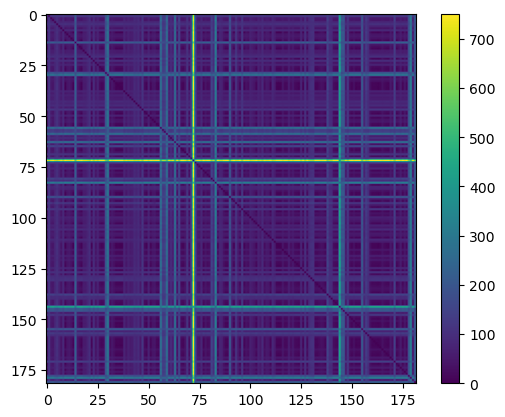

In [15]:
#spin implementation
D_euc = pdist(subset_df, 'euclidean') #use euclidean per SPIN paper recommendation
D = squareform(D_euc)

fig,ax = plt.subplots()
ax.imshow(D)
fig.colorbar(ax.imshow(D))
plt.show()

In [16]:
D.shape

(182, 182)

In [97]:


def n_sort(D,weights_mat, gene_index):
    
    mat_size = D.shape[0]
    #normalize into doubly stochastic 
    # Normalize along columns
    weights_sum1 = np.sum(weights_mat, axis=0)
    weights_mat = weights_mat / np.tile(weights_sum1, (mat_size, 1))
    #print (weights_mat.shape)
    # Normalize along rows
    weights_sum2 = np.sum(weights_mat, axis=1)
    weights_mat = weights_mat / np.tile(weights_sum2[:,np.newaxis],(1, mat_size))

    # Symmetrize the matrix
    weights_mat = (weights_mat + weights_mat.T) / 2


    #fig,ax = plt.subplots()
    #ax.imshow(weights_mat)
    #fig.colorbar(ax.imshow(weights_mat))
    #plt.show()

    mismatch = np.matmul(D, weights_mat)

    # Find minimum values and their indices along each row
    val = np.min(mismatch, axis=1)
    mn = np.argmin(mismatch, axis=1) + 1 #1 based indices to match matlab

    # Compute sort score
    mx = np.max(val)
    #print (mx)
    #subtract argmins by constant, multiply by sign of mat_size/2 - argmin, multiply by val/max
    sort_score = mn - 0.1 * np.sign(mat_size / 2 - mn) * val / mx 

    # Sort indices based on sort_score (0-based for Python)
    sorted_ind = np.argsort(sort_score)

    #permute distance matrix accoring to sorted indices
    D = D[sorted_ind,:][:, sorted_ind]
    #permute gene index according to sorted indices
    gene_index = gene_index[sorted_ind]

    #plot permuted distance matrix
    fig,ax = plt.subplots()
    ax.imshow(D)
    fig.colorbar(ax.imshow(D))
    plt.show()

    return D, sorted_ind, mx, gene_index

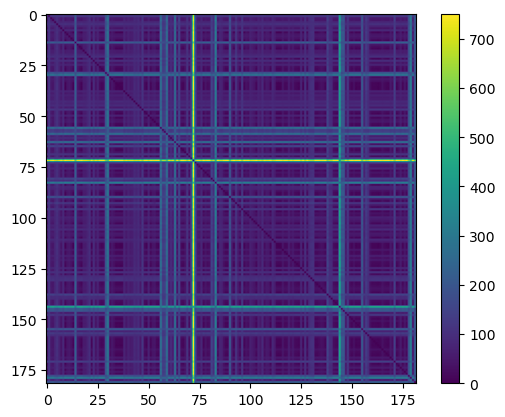

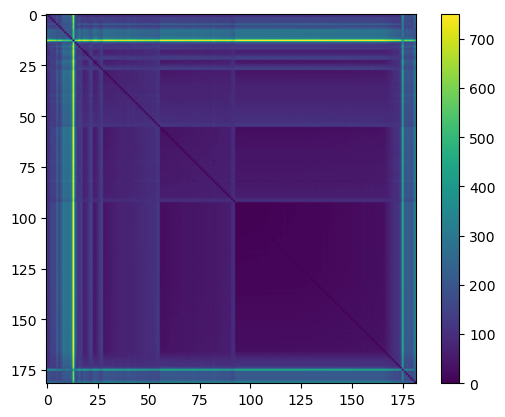

668.7590861204837
[  1   5  73  81  71  14  65  29  30  56  59  63  83  72  90  96  93 157
 100 104 106  57  58 105 101 111  47 171 102 109 108  94 112 174 156  40
   6  86  38  25  50  44  20  85  76   4   8  43  45 139  61 158  82  21
  69 148  99 107  80  87 151 165  12  98  24  68   7  78 116  75 147  10
  52  39   3  32  15 176  74  91  11 169  53   2  46  41  19  60  18  62
  42 140  23 114 126  37 113  34  36   9 115  13 172  84 152  97  92  22
 163 154  49 124  17  89 137  55  88 110  35  95 150 168  67 143 175 162
 160  77 132  27 103  51 161 153 177 167 123 133 164 117  54 118 128 122
 142  70  31 166  66   0  28 149  26  79  64 134 120  48 180  16 141 170
 136 173 159  33 135 121 119 125 129 130 127 131 138 144 145 146 155 178
 181 179]


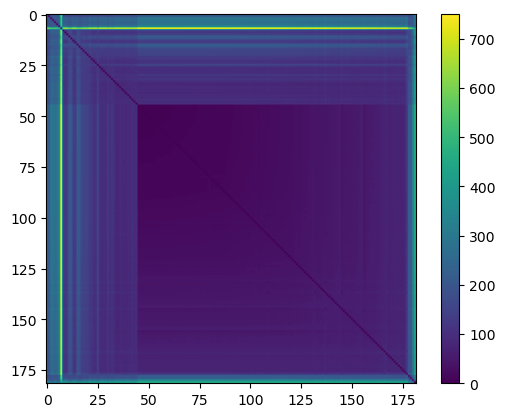

609.6609543366222
[  5   7   8   9  10  11  12  13  27  26  22  14 179  17  21 177 176   6
   2   4 174   0  15 173 172   3   1  49  51  50  55  52  54  53  45  44
 170  46  47  25  48  20 171  91  92  94  93  95  98  97  99 102 101 103
  96 104 100 107 106 108 105 109 110 112 113 111 115 114 118 116 119 121
 120 122 117 123 124 125 126 131 137 127 128 129 132 130 133 135 134 138
 140 136 139 142 144 141 146 145 147 149 148 152 150  56 143 151 153 154
 160 157 155 159 158  57 161 162 156 163 164  58 165  59 166  61  60  62
  63  64  65  66  28  77  72  67  69  71  73  82  68  76  29  81  83  84
  89  74  75  23  80  79  78  30  31  24  33  90  70 167  85  86  87  88
  32 168  18  35  40  43  34  19  36  37  39  42  41  38 169  16 180 178
 181 175]


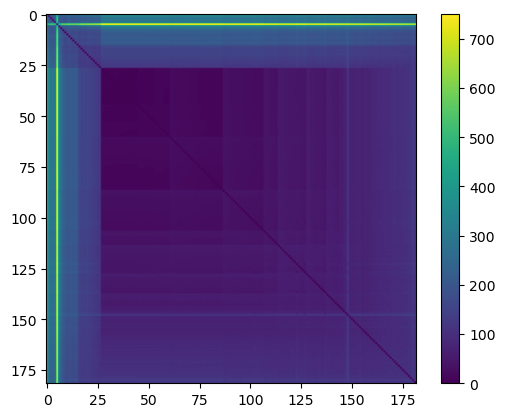

579.5291403801058
[181   6   5   2   3   7 180   4   0 178  11  15   1  16 179  12  17  19
  25  20  18   8  10  13  14  22  30  62  61  60  59  58  57  55  56  54
  53  51  52  50  49  48  47  46  45  70  69  68  67  66  65  64  63  78
  77  76  75  74  73  72  71 103 102 101 100  99  98 104  97  96  95  94
  93  92  91  90  89  80  88  87  86  85  84  83  82  79  81 126 123 122
 121 120 119 118 117 116 115 114 113 112 111 110 109 108 107 106 105 130
 133 129 128 127 125 124 153 143 142 141 147 140 131 139 138 137 136 135
 134 132 144 154 152 151 150 149 148 146 156 145 163 155 160 159 158 157
 162 161 164 166 177 165 170 169 173 174 167 168 171 175 172 176  35  34
  39  38  37  41  40  43  36  27  44  33  29  28  31  42  26  24  23  32
  21   9]


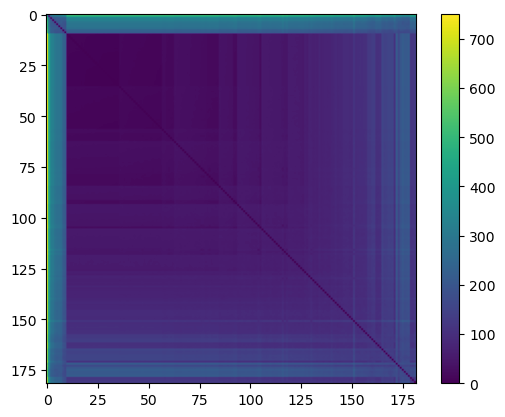

533.0261727288762
[  5   0   1   6   3   2   4   7   8   9  45  46  47  48  49  50  51  27
  52  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44
  74  75  76  77  78  79  80  81  82  84  83  85  86  54  53  55  56  57
  58  59  60 105 106  70  71  73  72 113  90  91  92  93  94  95  96  97
  98  99 100 101 102 103 104  64  65  66  67  68  69 109 110 111  87 112
  88  89  62  63 135 119 120 121 122 124 125 126 107 108 127  61 114 130
 131 143 116 117 132 133 134 118 123 136 137 139 128 129 140 145 141 142
 115 138 144 150 147 146 149 155 152 151 156 153 158 157 154 159 164 160
 161 162 166 167 168 165 163 148 169 172 173 170 174 171  25  26  24  23
 175 176 177  20  22  21  17  19  18 178  11  16  15  14  13  10  12 179
 181 180]


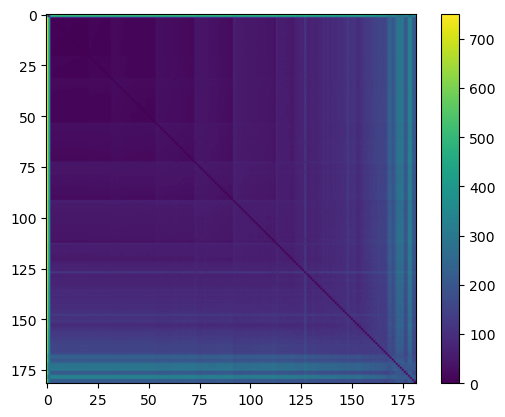

547.145248610933
[  0   1  18  17  19  20  21  22  23  24  25  26  27  28  29  30  31  32
  33  34  35  53  54  55  56  10  11  12  13  14  16  15  80  81  83  84
  62  36  37  38  39  40  41  42  43  44  46  45  47  48  50  49  51  52
  91  68  69  70  71  72  73  75 105  77  76  78  92  93  79  82  59  60
  61 116 100 101 102 103 104  85  86  88  87  89  90  64  65  66  67  74
  57  58 131 122 125 106 126 109 110 111 112 113 114 115  94  95  96  97
  98  99 117 118  63 130 128 119 120 121 123 124 107 108 127 132 135 134
 136 151 129 133 137 140 138 139 141 143 147 144 148 145 150 146 149 155
 152 153 156 162 181 163 164 179 157 142 154 171 180 159 158 160 161 167
 166 165 168 170 169 173   9   8 174 172   7   6   5   4 176 175   3   2
 177 178]


In [99]:
#spin implementation
D_euc = pdist(subset_df, 'euclidean') #use euclidean per SPIN paper recommendation
D = squareform(D_euc)
D_orig = D.copy()

fig,ax = plt.subplots()
ax.imshow(D)
fig.colorbar(ax.imshow(D))
plt.show()

#precomputed gaussian weight matrix
mat_size = D.shape[0]
w_pow = 2
wid = 1
# Create meshgrid for indices (1-based to match MATLAB)
i, j = np.meshgrid(np.arange(1, mat_size + 1), np.arange(1, mat_size + 1))
# Compute Gaussian weights
weights_mat = np.abs(np.exp(-((i - j) ** w_pow) / wid/mat_size)) 
#weights_mat[weights_mat < 0] = 0


N=5
gene_index = subset_df.index

for i in range(N):
    D, sorted_ind, mx,gene_index = n_sort(D,weights_mat,gene_index)
    print (mx)
    print (sorted_ind)

In [83]:
subset_df.index

Index(['Arc', 'Bdnf', 'Bsn', 'Btg2', 'Cacna1a', 'Cacna1b', 'Cacna1c',
       'Cacna1d', 'Cacna1e', 'Cacna1f',
       ...
       'Sema5b', 'Sema6a', 'Sema6b', 'Sema6c', 'Sema6d', 'Sema7a', 'Syn1',
       'Syn2', 'Syn3', 'Syp'],
      dtype='object', length=182)

In [100]:
gene_index

Index(['Gria2', 'Nrxn1', 'Cacna2d4', 'Dusp6', 'Nxph4', 'Kcna3', 'Sema3e',
       'Inhba', 'Cacng1', 'Nxph2',
       ...
       'Gabra2', 'Gabbr1', 'Gabrb1', 'Camk2b', 'Nrxn2', 'Pclo', 'Syn2',
       'Grin2b', 'Grm5', 'Camk2a'],
      dtype='object', length=182)

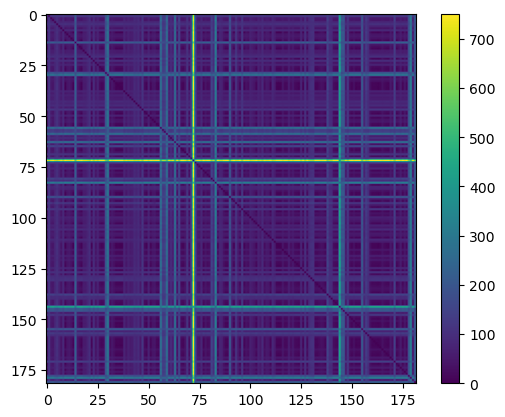

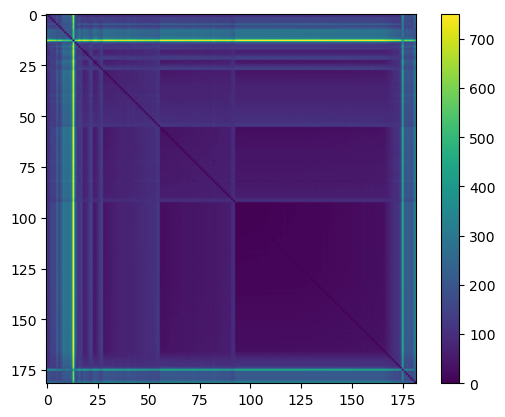

668.7590861204837
668.7590861204837


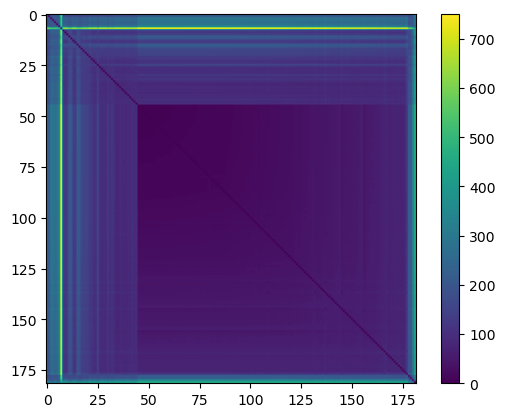

609.6609543366222
668.7590861204837


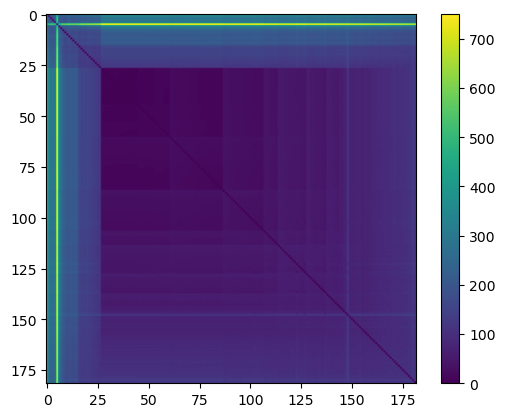

579.5291403801058
609.6609543366222


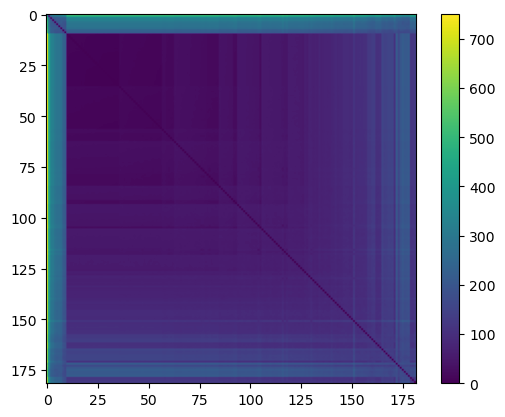

533.0261727288762
579.5291403801058


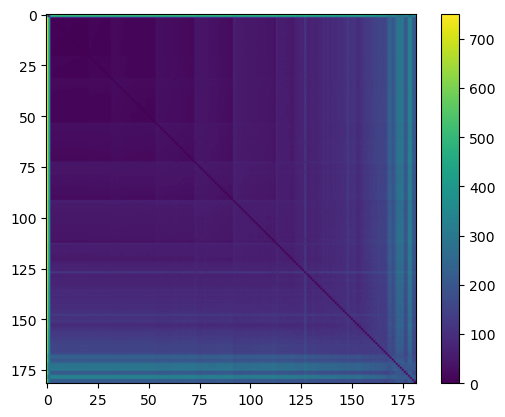

547.145248610933
533.0261727288762


In [102]:
#spin implementation
D_euc = pdist(subset_df, 'euclidean') #use euclidean per SPIN paper recommendation
D = squareform(D_euc)
D_orig = D.copy()

fig,ax = plt.subplots()
ax.imshow(D)
fig.colorbar(ax.imshow(D))
plt.show()

#precomputed gaussian weight matrix
mat_size = D.shape[0]
w_pow = 2
wid = 1
# Create meshgrid for indices (1-based to match MATLAB)
i, j = np.meshgrid(np.arange(1, mat_size + 1), np.arange(1, mat_size + 1))
# Compute Gaussian weights
weights_mat = np.abs(np.exp(-((i - j) ** w_pow) / wid/mat_size)) 
#weights_mat[weights_mat < 0] = 0


N = 0
mx_init = float('inf')
gene_index = subset_df.index
#mx = 0
sorted_ind_list = []
D_list = []
gene_index_list = []
while mx<=mx_init:
    mx_init = mx
    D, sorted_ind,mx,gene_index = n_sort(D,weights_mat, gene_index)
    sorted_ind_list.append(sorted_ind)
    D_list.append(D)
    gene_index_list.append(gene_index)
    print (mx)
    print (mx_init)

    N+=1
    if N>10:
        break

In [ ]:
#optimal sorted index is second to last
optimal_sorted_ind = sorted_ind_list[-2]
D_check = D_list[-3][optimal_sorted_ind,:][:, optimal_sorted_ind]

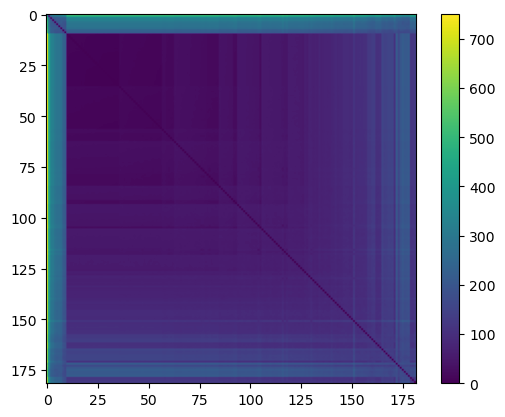

In [104]:
fig,ax = plt.subplots()
ax.imshow(D_check)
fig.colorbar(ax.imshow(D_check))
plt.show()

In [105]:
gene_index_list

[Index(['Bdnf', 'Cacna1b', 'Gria3', 'Grin1', 'Gria1', 'Cacna2d1', 'Gabrb3',
        'Camk2a', 'Camk2b', 'Gabbr1',
        ...
        'Kcnip2', 'Kcnq3', 'Nlgn1', 'Nrxn1', 'Nrxn2', 'Nrxn3', 'Pclo', 'Syn1',
        'Syp', 'Syn2'],
       dtype='object', length=182),
 Index(['Cacna2d1', 'Camk2a', 'Camk2b', 'Gabbr1', 'Gabra2', 'Gabrb1', 'Grin2b',
        'Gria2', 'Sema5a', 'Dlg4',
        ...
        'Cacng4', 'Cacnb3', 'Dlg1', 'Crebbp', 'Kcnh7', 'Junb', 'Syp', 'Pclo',
        'Syn2', 'Nrxn1'],
       dtype='object', length=182),
 Index(['Nrxn1', 'Grin2b', 'Gabrb1', 'Camk2b', 'Gabbr1', 'Gria2', 'Syn2',
        'Gabra2', 'Cacna2d1', 'Syp',
        ...
        'Gabra4', 'Scn8a', 'Grin2a', 'Kcnq2', 'Cacna1b', 'Kcnip2', 'Kcnq3',
        'Gabrg2', 'Bdnf', 'Dlg4'],
       dtype='object', length=182),
 Index(['Gria2', 'Nrxn1', 'Grin2b', 'Syn2', 'Camk2b', 'Gabrb1', 'Gabbr1',
        'Gabra2', 'Cacna2d1', 'Syp',
        ...
        'Nrxn3', 'Gabrb3', 'Syn1', 'Pclo', 'Nrxn2', 'Grm5', 'Camk2a', 'Gabr

In [106]:
subset_df.reindex(gene_index_list[-2])

,CATGCGGTCACTGAAC-1_10X38_1,ATAGAGATCCGAAATC-1_10X35_2,CAAGCTACATCATCCC-1_10X35_2,ACATTTCCAACCGATT-1_10X35_2,CGTCAAACACCGTGAC-1_10X35_1,TGCTGAATCGCCGAAC-1_10X35_2,GTCTAGAAGCTGACAG-1_10X35_1,TGGATGTGTACCCGAC-1_10X35_2,TTAGTCTCAATAGGGC-1_10X35_1,GAGTCATTCGTCAAAC-1_10X38_1,...,TACCCACCAATTGAAG-1_10X52_4,GTCCACTTCGACGATT-1_10X51_3,AAATGGATCCATACTT-1_10X52_4,TCTACATTCCTTCTTC-1_10X52_3,CATGCTCTCCCAAGTA-1_10X52_4,AGAAATGGTGCGGTAA-1_10X51_3,ATGTCTTCACGTGTGC-1_10X52_3,CGACAGCCACGTATAC-1_10X52_4,TGTGATGCACACTGGC-1_10X52_3,TTTACGTAGCCTCAGC-1_10X51_4
Gria2,35.431235,22.553565,21.969974,16.778523,24.862093,24.530471,30.272452,22.381379,16.756433,36.683786,...,30.464585,43.995859,33.179287,19.413287,36.559358,30.927835,31.418312,28.468192,23.138106,34.340659
Nrxn1,7.459207,5.011903,11.717320,29.362416,9.323285,16.864699,20.181635,40.286482,11.968881,27.512839,...,15.232292,12.939959,4.739898,21.570319,6.093226,12.886598,20.197487,6.569583,14.461316,10.302198
Grin2b,13.053613,12.529758,11.717320,10.486577,12.431047,12.265236,10.090817,13.428827,11.968881,14.673514,...,7.616146,10.351967,0.000000,6.471096,6.093226,10.309278,11.220826,13.139166,8.676790,0.000000
Syn2,11.188811,0.000000,7.323325,8.389262,10.877166,4.599463,6.727212,17.905103,9.575105,3.668379,...,20.309723,12.939959,11.849745,12.942192,10.155377,15.463918,6.732496,4.379722,14.461316,0.000000
Camk2b,3.729604,2.505952,19.040644,12.583893,9.323285,10.732081,30.272452,13.428827,4.787552,7.336757,...,7.616146,7.763975,7.109847,10.785160,6.093226,0.000000,13.464991,0.000000,5.784526,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Grm5,9.324009,7.517855,4.393995,12.583893,6.215523,7.665772,10.090817,13.428827,4.787552,5.502568,...,2.538715,10.351967,2.369949,6.471096,4.062151,7.731959,15.709156,0.000000,0.000000,10.302198
Camk2a,3.729604,10.023807,2.929330,6.291946,10.877166,9.198927,0.000000,4.476276,2.393776,7.336757,...,2.538715,2.587992,4.739898,6.471096,12.186453,10.309278,6.732496,10.949305,5.784526,3.434066
Gabrg2,7.459207,2.505952,1.464665,0.000000,6.215523,3.066309,10.090817,8.952551,4.787552,7.336757,...,0.000000,2.587992,4.739898,0.000000,2.031075,5.154639,8.976661,0.000000,5.784526,3.434066
Dlg4,7.459207,0.000000,5.858660,2.097315,6.215523,3.066309,0.000000,0.000000,0.000000,3.668379,...,0.000000,0.000000,0.000000,4.314064,2.031075,0.000000,2.244165,0.000000,2.892263,3.434066


In [ ]:
#STS implementation
weights = np.arange(1, mat_size + 1) - mat_size / 2 - 0.5
weights

array([-95.5, -94.5, -93.5, -92.5, -91.5, -90.5, -89.5, -88.5, -87.5,
       -86.5, -85.5, -84.5, -83.5, -82.5, -81.5, -80.5, -79.5, -78.5,
       -77.5, -76.5, -75.5, -74.5, -73.5, -72.5, -71.5, -70.5, -69.5,
       -68.5, -67.5, -66.5, -65.5, -64.5, -63.5, -62.5, -61.5, -60.5,
       -59.5, -58.5, -57.5, -56.5, -55.5, -54.5, -53.5, -52.5, -51.5,
       -50.5, -49.5, -48.5, -47.5, -46.5, -45.5, -44.5, -43.5, -42.5,
       -41.5, -40.5, -39.5, -38.5, -37.5, -36.5, -35.5, -34.5, -33.5,
       -32.5, -31.5, -30.5, -29.5, -28.5, -27.5, -26.5, -25.5, -24.5,
       -23.5, -22.5, -21.5, -20.5, -19.5, -18.5, -17.5, -16.5, -15.5,
       -14.5, -13.5, -12.5, -11.5, -10.5,  -9.5,  -8.5,  -7.5,  -6.5,
        -5.5,  -4.5,  -3.5,  -2.5,  -1.5,  -0.5,   0.5,   1.5,   2.5,
         3.5,   4.5,   5.5,   6.5,   7.5,   8.5,   9.5,  10.5,  11.5,
        12.5,  13.5,  14.5,  15.5,  16.5,  17.5,  18.5,  19.5,  20.5,
        21.5,  22.5,  23.5,  24.5,  25.5,  26.5,  27.5,  28.5,  29.5,
        30.5,  31.5,

In [22]:
sort_score = np.matmul(b_m_dist, weights)
sort_score

array([ 18565.88860911,   8569.9754492 ,  13024.12057384,  17613.55506335,
        12648.77137565,  13693.94517111,  11741.53020785,  11487.69297741,
        15131.42036601,  11712.61300798,  13442.70029074,   5443.36542845,
        13877.32700102,  15841.25885859,  13832.68109863,   7140.56979772,
        14195.20632642,  10984.18181671,  18927.4969526 ,  13398.30380004,
        18300.68490771,  13036.20919834,   4897.82406712,  11198.72661317,
        10035.95069066,   6285.52706394,  12152.10768174,  13383.87868735,
        12582.98928074,  21247.62240971,   3032.11388135,   2219.3844476 ,
        12342.84134971,  13709.53469367,  10294.57451177,   4589.6579131 ,
         4342.15998924,  16397.50895154,   9911.05952645,   2873.09282028,
        11782.5417989 ,   6957.54987003,  10073.62175691,  10774.63529176,
        15167.49352181,  20294.15336602,  14812.40674692,  12977.71807485,
         1427.21540734,  -3950.93205383,   1981.77227273,   7539.16641432,
        12693.37092215,  

In [26]:
np.argsort(sort_score)[::-1]

array([ 29,  45,  18,   0,  20,   3,  37,  13,  70,  71, 103,  58,  44,
        91, 169,   8,  55,  46,  60,  16,  12,  14,  74,  33,   5,  79,
        10,  68,  19,  27,  65, 125, 105,  85,  21,   2,  47,  69, 119,
        52,   4,  28,  67, 122,  32,  26,  78,  88,  40,  92,   6,   9,
         7,  86,  23,  54,  17,  90,  81, 126,  43,  98, 127, 140,  34,
       165,  42, 104, 161,  24, 110,  38,  72,  83, 115,  82,  61, 102,
         1, 135, 111, 162, 124, 101, 116,  59, 113, 107, 150, 118,  76,
        99, 108, 181,  73, 146, 170,  51, 185, 139,  97,  15, 120,  41,
       158, 154, 136, 141, 152,  64, 131,  25, 137, 153,  75, 157, 160,
       148, 188,  95, 142,  11, 123,  89,  63,  80,  96, 159, 129,  53,
        22,  57, 144, 143, 168,  35, 100, 109,  36, 133, 190, 187, 189,
       163, 186, 173,  66,  77, 132,  30, 191,  39, 112, 134, 184, 138,
        31,  50,  48, 145,  84, 151, 166, 121,  87, 164,  56, 117, 130,
       182, 106, 155, 178,  62,  94,  93, 167, 156, 149, 128, 18

In [24]:
x = np.array([3, 1, 2])

np.argsort(x)[::-1]

array([0, 2, 1])

In [25]:
sorted_ind = spin.side2side_sort(b_m_dist)
sorted_ind

array([ 29,  45,  18,   0,  20,   3,  37,  13,  70,  71, 103,  58,  44,
        91, 169,   8,  55,  46,  60,  16,  12,  14,  74,  33,   5,  79,
        10,  68,  19,  27,  65, 125, 105,  85,  21,   2,  47,  69, 119,
        52,   4,  28,  67, 122,  32,  26,  78,  88,  40,  92,   6,   9,
         7,  86,  23,  54,  17,  90,  81, 126,  43,  98, 127, 140,  34,
       165,  42, 104, 161,  24, 110,  38,  72,  83, 115,  82,  61, 102,
         1, 135, 111, 162, 124, 101, 116,  59, 113, 107, 150, 118,  76,
        99, 108, 181,  73, 146, 170,  51, 185, 139,  97,  15, 120,  41,
       158, 154, 136, 141, 152,  64, 131,  25, 137, 153,  75, 157, 160,
       148, 188,  95, 142,  11, 123,  89,  63,  80,  96, 159, 129,  53,
        22,  57, 144, 143, 168,  35, 100, 109,  36, 133, 190, 187, 189,
       163, 186, 173,  66,  77, 132,  30, 191,  39, 112, 134, 184, 138,
        31,  50,  48, 145,  84, 151, 166, 121,  87, 164,  56, 117, 130,
       182, 106, 155, 178,  62,  94,  93, 167, 156, 149, 128, 18

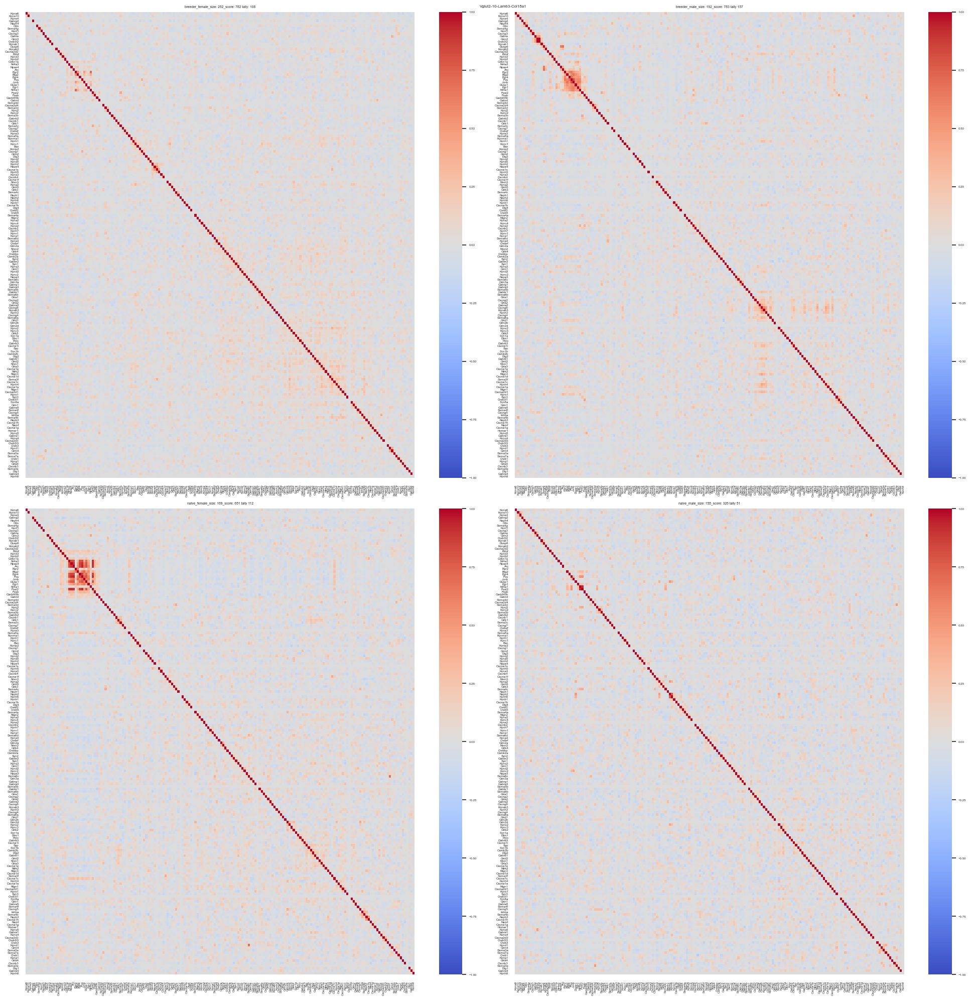

In [33]:
sns.set(font_scale=0.4)
# Create a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 20))

# Plot each heatmap in the respective subplot
sns.heatmap(coeff_matrix_b_f, cmap='coolwarm', rasterized=True,vmin=-1, vmax=1, ax=axs[0, 0], xticklabels=1, yticklabels = 1)
axs[0, 0].set_title(f"breeder_female_size: {str(b_f_subset_df.shape[1])}_score: {score_b_f} tally: {b_f_tally}")

sns.heatmap(coeff_matrix_b_m, cmap='coolwarm', rasterized=True,vmin=-1, vmax=1, ax=axs[0, 1], xticklabels=1,yticklabels = 1)
axs[0, 1].set_title(f"breeder_male_size: {str(b_m_subset_df.shape[1])}_score: {score_b_m} tally {b_m_tally}")

sns.heatmap(coeff_matrix_n_f, cmap='coolwarm', rasterized=True,vmin=-1, vmax=1, ax=axs[1, 0],xticklabels=1,yticklabels = 1)
axs[1, 0].set_title(f"naive_female_size: {str(n_f_subset_df.shape[1])}_score: {score_n_f} tally {n_f_tally}")

sns.heatmap(coeff_matrix_n_m, cmap='coolwarm', rasterized=True,vmin=-1, vmax=1, ax=axs[1, 1], xticklabels=1,yticklabels = 1)
axs[1, 1].set_title(f"naive_male_size: {str(n_m_subset_df.shape[1])}_score: {score_n_m} tally {n_m_tally}")

fig.suptitle(fn, y = .99)
# Adjust layout
plt.tight_layout()
plt.savefig(outfolder + '/' + fn + '_'+ gene_subset_name +'TMPALLSUBSETS_correlation_group_compare.pdf')
plt.show()

In [23]:
fn

'Vglut2-10-Lamb3-Col18a1'

In [20]:
outfolder

'/bigdata/isaac/Vglut2_files/sex_stats/050325_run_IEG/IEG_corr_plots/'

# Script to generate clustermap plots (genes clustered in each population)

In [ ]:
for data_file, metadata_file in zip(sorted_raw_files, sorted_metadata_files):

    raw_df = pd.read_json(data_file)
    metadata_df = pd.read_json(metadata_file)

    #ensure that the columns are the same
    if np.all(raw_df.columns == metadata_df.columns) != True:
        print('error: columns are not the same')
        print(data_file)
        print(metadata_file)
        break

    #get filename
    x = data_file.split('_')
    fn = x[-1].split('.')[0]
    print('processing: ', fn)

    #check if the gene is in the raw_df
    for g in IEG_updated_list:
        if g in raw_df.index:
            pass
        else:
            print (g, 'not in raw_df')

    #subset the raw_df to only include specified genes
    subset_df = raw_df.loc[genes,:]

    #drop rows with all zeros
    subset_df = subset_df.loc[~(subset_df == 0).all(axis=1)]

    #get subset of cells for each group
    b_f_subset_df = subset_df.loc[:,metadata_df.loc['Group'] == 'Breeder-F']
    b_m_subset_df = subset_df.loc[:,metadata_df.loc['Group'] == 'Breeder-M']
    n_f_subset_df = subset_df.loc[:,metadata_df.loc['Group'] == 'Naïve-F']   
    n_m_subset_df = subset_df.loc[:,metadata_df.loc['Group'] == 'Naïve-M'] 

    #drop rows with all zeros
    b_f_subset_df = b_f_subset_df.loc[~(b_f_subset_df == 0).all(axis=1)]
    b_m_subset_df = b_m_subset_df.loc[~(b_m_subset_df == 0).all(axis=1)]
    n_f_subset_df = n_f_subset_df.loc[~(n_f_subset_df == 0).all(axis=1)]
    n_m_subset_df = n_m_subset_df.loc[~(n_m_subset_df == 0).all(axis=1)]

    #get the correlation matrix for each group
    coeff_matrix_b_f, p_corr_matrix_b_f_raw = ca.compute_corr_matrix(b_f_subset_df)
    coeff_matrix_b_m, p_corr_matrix_b_m_raw = ca.compute_corr_matrix(b_m_subset_df)
    coeff_matrix_n_f, p_corr_matrix_n_f_raw = ca.compute_corr_matrix(n_f_subset_df)
    coeff_matrix_n_m, p_corr_matrix_n_m_raw = ca.compute_corr_matrix(n_m_subset_df)

    #get the fdr corrected p-values
    p_corr_matrix_b_f = ca.get_fdr_p_matrix(p_corr_matrix_b_f_raw)
    p_corr_matrix_b_m = ca.get_fdr_p_matrix(p_corr_matrix_b_m_raw)
    p_corr_matrix_n_f = ca.get_fdr_p_matrix(p_corr_matrix_n_f_raw)
    p_corr_matrix_n_m = ca.get_fdr_p_matrix(p_corr_matrix_n_m_raw)

    #get boolean matrix where True is significant, used to annotate the heatmap
    p_corr_matrix_b_f_sig = p_corr_matrix_b_f < 0.05
    p_corr_matrix_b_m_sig = p_corr_matrix_b_m < 0.05
    p_corr_matrix_n_f_sig = p_corr_matrix_n_f < 0.05
    p_corr_matrix_n_m_sig = p_corr_matrix_n_m < 0.05

    subfolder = outfolder + fn
    os.makedirs(subfolder, exist_ok=True)

    #save individual correlation matrices plots in subfolder
    g = sns.clustermap(coeff_matrix_b_f, cmap='coolwarm', annot = p_corr_matrix_b_f_sig, vmin=-1, vmax=1,method='ward', metric='euclidean')
    #g.fig.suptitle(fn + ' IEG correlation: b_f ' + '(' + str(b_f_subset_df.shape[1]) + ')')
    plt.savefig(subfolder + '/' + fn + '_'+ gene_subset_name + '_correlation_b_f_'+ str(b_f_subset_df.shape[1]) + '.pdf')
    #plt.show()

    g = sns.clustermap(coeff_matrix_b_m, cmap='coolwarm', annot = p_corr_matrix_b_m_sig, vmin=-1, vmax=1,method='ward', metric='euclidean')
    #g.fig.suptitle(fn + ' IEG correlation: b_m'+ '(' + str(b_m_subset_df.shape[1]) + ')')
    plt.savefig(subfolder + '/' + fn + '_'+ gene_subset_name +'_correlation_b_m_' + str(b_m_subset_df.shape[1]) + '.pdf')
    #plt.show()

    g = sns.clustermap(coeff_matrix_n_f, cmap='coolwarm', annot = p_corr_matrix_n_f_sig, vmin=-1, vmax=1,method='ward', metric='euclidean')
    #g.fig.suptitle(fn + ' IEG correlation: n_f' + '(' + str(n_f_subset_df.shape[1]) + ')')
    plt.savefig(subfolder + '/' + fn + '_'+ gene_subset_name + '_correlation_n_f_' + str(n_f_subset_df.shape[1]) + '.pdf')
    #plt.show()

    g = sns.clustermap(coeff_matrix_n_m, cmap='coolwarm', annot = p_corr_matrix_n_m_sig, vmin=-1, vmax=1,method='ward', metric='euclidean')
    #g.fig.suptitle(fn + ' IEG correlation: n_m' + '(' + str(n_m_subset_df.shape[1]) + ')')
    plt.savefig(subfolder + '/' + fn + '_'+ gene_subset_name +'_correlation_n_m_'+ str(n_m_subset_df.shape[1]) +'.pdf')
    #plt.show()

    #stich into single pdf
    ca.stitch_heatmap_pdfs(subfolder, outfolder, fn, gene_subset_name, mode='clustermap')

print ('done')

processing:  GABA-1-Sst-Npy-Spon1
Stitched PDF saved as /bigdata/isaac/gaba_files/sex_stats/050325_run_IEG/IEG_corr_plots/GABA-1-Sst-Npy-Spon1_IEG_correlation_plots.pdf
processing:  GABA-2-Sst-Npy-Maf
Stitched PDF saved as /bigdata/isaac/gaba_files/sex_stats/050325_run_IEG/IEG_corr_plots/GABA-2-Sst-Npy-Maf_IEG_correlation_plots.pdf
processing:  GABA-3-Sst-Npy-Chodl
Stitched PDF saved as /bigdata/isaac/gaba_files/sex_stats/050325_run_IEG/IEG_corr_plots/GABA-3-Sst-Npy-Chodl_IEG_correlation_plots.pdf
processing:  GABA-4-Moxd1-Pvalb


/home/isaac/anaconda3/lib/python3.11/site-packages/seaborn/matrix.py:715: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  self._figure = plt.figure(figsize=figsize)


Stitched PDF saved as /bigdata/isaac/gaba_files/sex_stats/050325_run_IEG/IEG_corr_plots/GABA-4-Moxd1-Pvalb_IEG_correlation_plots.pdf
processing:  GABA-5-Moxd1-Vwc2
Stitched PDF saved as /bigdata/isaac/gaba_files/sex_stats/050325_run_IEG/IEG_corr_plots/GABA-5-Moxd1-Vwc2_IEG_correlation_plots.pdf
processing:  GABA-6-Hapln1-Cryab
Stitched PDF saved as /bigdata/isaac/gaba_files/sex_stats/050325_run_IEG/IEG_corr_plots/GABA-6-Hapln1-Cryab_IEG_correlation_plots.pdf
processing:  GABA-7-Vip-Crh
Stitched PDF saved as /bigdata/isaac/gaba_files/sex_stats/050325_run_IEG/IEG_corr_plots/GABA-7-Vip-Crh_IEG_correlation_plots.pdf
processing:  GABA-8-Htr3a-Rgs12
Stitched PDF saved as /bigdata/isaac/gaba_files/sex_stats/050325_run_IEG/IEG_corr_plots/GABA-8-Htr3a-Rgs12_IEG_correlation_plots.pdf
processing:  GABA-9-Dab1-Myh7
Stitched PDF saved as /bigdata/isaac/gaba_files/sex_stats/050325_run_IEG/IEG_corr_plots/GABA-9-Dab1-Myh7_IEG_correlation_plots.pdf
processing:  GABA-10-Pax6-Npnt
Stitched PDF saved as /

ValueError: There must be exactly 4 PDF files containing '_correlation_' in their filenames.

# Script to generate heatmap grid 
## (fixed gene order based on linkage on gene subset x all cells in cell type)

In [ ]:
import warnings
warnings.filterwarnings('ignore')

scores_df = pd.DataFrame(columns=['fn','b_f','b_m','n_f','n_m'])
tallys_df = pd.DataFrame(columns=['fn','b_f','b_m','n_f','n_m'])
counts_df = pd.DataFrame(columns=['fn','b_f','b_m','n_f','n_m'])

for data_file, metadata_file in zip(sorted_raw_files, sorted_metadata_files):

    raw_df = pd.read_json(data_file)
    metadata_df = pd.read_json(metadata_file)

    #ensure that the columns are the same
    if np.all(raw_df.columns == metadata_df.columns) != True:
        print('error: columns are not the same')
        
    #get filename
    x = data_file.split('_')
    fn = x[-1].split('.')[0]
    print('processing: ', fn)

    #subfolder = outfolder + fn
    #os.makedirs(subfolder, exist_ok=True)
    #check if the gene is in the raw_df
    for g in IEG_updated_list:
        if g in raw_df.index:
            pass
        else:
            print (g, 'not in raw_df')

    #subset the raw_df to only include specified genes
    subset_df = raw_df.loc[genes,:]

    #drop rows with all zeros
    subset_df = subset_df.loc[~(subset_df == 0).all(axis=1)]

    #get subset of cells for each group
    b_f_subset_df = subset_df.loc[:,metadata_df.loc['Group'] == 'Breeder-F']
    b_m_subset_df = subset_df.loc[:,metadata_df.loc['Group'] == 'Breeder-M']
    n_f_subset_df = subset_df.loc[:,metadata_df.loc['Group'] == 'Naïve-F']   
    n_m_subset_df = subset_df.loc[:,metadata_df.loc['Group'] == 'Naïve-M'] 

    #check group sizes
    cutoff = 20
    if b_f_subset_df.shape[1] <cutoff or b_m_subset_df.shape[1] <cutoff  or n_f_subset_df.shape[1] <cutoff or n_m_subset_df.shape[1] < cutoff:
        print ('one or more groups has <20 cells, skipping...')

    else:
        #drop rows with all zeros
        #b_f_subset_df = b_f_subset_df.loc[~(b_f_subset_df == 0).all(axis=1)]
        #b_m_subset_df = b_m_subset_df.loc[~(b_m_subset_df == 0).all(axis=1)]
        #n_f_subset_df = n_f_subset_df.loc[~(n_f_subset_df == 0).all(axis=1)]
        #n_m_subset_df = n_m_subset_df.loc[~(n_m_subset_df == 0).all(axis=1)]


        #get the correlation matrix for each group
        coeff_matrix_b_f, p_corr_matrix_b_f_raw = ca.compute_corr_matrix(b_f_subset_df)
        coeff_matrix_b_m, p_corr_matrix_b_m_raw = ca.compute_corr_matrix(b_m_subset_df)
        coeff_matrix_n_f, p_corr_matrix_n_f_raw = ca.compute_corr_matrix(n_f_subset_df)
        coeff_matrix_n_m, p_corr_matrix_n_m_raw = ca.compute_corr_matrix(n_m_subset_df)


        # Fill NaN values in p matrix with 1
        p_corr_matrix_b_f_raw = p_corr_matrix_b_f_raw.fillna(1)
        p_corr_matrix_b_m_raw = p_corr_matrix_b_m_raw.fillna(1)
        p_corr_matrix_n_f_raw = p_corr_matrix_n_f_raw.fillna(1)
        p_corr_matrix_n_m_raw = p_corr_matrix_n_m_raw.fillna(1)

        # Fill NaN values in coeff matrix with 0
        coeff_matrix_b_f = coeff_matrix_b_f.fillna(0)
        coeff_matrix_b_m = coeff_matrix_b_m.fillna(0)
        coeff_matrix_n_f = coeff_matrix_n_f.fillna(0)
        coeff_matrix_n_m = coeff_matrix_n_m.fillna(0)

        #Compute condensed distance matrix
        D_cond = pdist(subset_df, 'correlation')

        #linkage on dist matrix for entire subset
        Z = linkage(D_cond, 'average')
        dn = dendrogram(Z)
        #get new gene order
        gene_order = leaves_list(optimal_leaf_ordering(Z,D_cond))
        Z_ordered = optimal_leaf_ordering(Z,D_cond)
        dn = dendrogram(Z_ordered)

        #shift order to start from 1
        gene_order+=1

        # Create a mapping from the list of integers to the original DataFrame's index
        index_mapping = {i: idx for i, idx in zip(range(1, len(subset_df.index) + 1), subset_df.index)}

        # Create the new index based on the list of integers
        new_index = [index_mapping[i] for i in gene_order]

        # Reindex the DataFrame
        subset_df_reindexed = subset_df.reindex(new_index)

        coeff_matrix_b_f = coeff_matrix_b_f.reindex(index=new_index,columns=new_index)
        coeff_matrix_b_m = coeff_matrix_b_m.reindex(index=new_index,columns=new_index)
        coeff_matrix_n_f = coeff_matrix_n_f.reindex(index=new_index,columns=new_index)
        coeff_matrix_n_m = coeff_matrix_n_m.reindex(index=new_index,columns=new_index)

        p_corr_matrix_b_f_raw = p_corr_matrix_b_f_raw.reindex(index=new_index,columns=new_index)
        p_corr_matrix_b_m_raw = p_corr_matrix_b_m_raw.reindex(index=new_index,columns=new_index)
        p_corr_matrix_n_f_raw = p_corr_matrix_n_f_raw.reindex(index=new_index,columns=new_index)
        p_corr_matrix_n_m_raw = p_corr_matrix_n_m_raw.reindex(index=new_index,columns=new_index)

        #get the fdr corrected p-values
        p_corr_matrix_b_f,score_b_f = ca.get_fdr_p_matrix(p_corr_matrix_b_f_raw)
        p_corr_matrix_b_m,score_b_m = ca.get_fdr_p_matrix(p_corr_matrix_b_m_raw)
        p_corr_matrix_n_f,score_n_f = ca.get_fdr_p_matrix(p_corr_matrix_n_f_raw)
        p_corr_matrix_n_m,score_n_m = ca.get_fdr_p_matrix(p_corr_matrix_n_m_raw)
        #add scores to scores_df
        tmp = np.array([fn, score_b_f, score_b_m, score_n_f, score_n_m])
        tmp = np.reshape(tmp, (1, len(tmp)))
        score_df = pd.DataFrame(tmp, columns=scores_df.columns)
        scores_df = pd.concat([scores_df,score_df],axis=0)

        p_corr_matrix_b_f_sig = p_corr_matrix_b_f<0.05
        p_corr_matrix_b_m_sig = p_corr_matrix_b_m<0.05
        p_corr_matrix_n_f_sig = p_corr_matrix_n_f<0.05
        p_corr_matrix_n_m_sig = p_corr_matrix_n_m<0.05
        
        #tally number of ones (trues) in sig matrices
        b_f_tally = np.sum(np.triu(p_corr_matrix_b_f_sig,1))
        b_m_tally = np.sum(np.triu(p_corr_matrix_b_m_sig,1))
        n_f_tally = np.sum(np.triu(p_corr_matrix_n_f_sig,1))
        n_m_tally = np.sum(np.triu(p_corr_matrix_n_m_sig,1))
        #add tallys to tallys_df
        tmp_tally = np.array([fn, b_f_tally, b_m_tally, n_f_tally, n_m_tally])
        tmp_tally = np.reshape(tmp_tally, (1, len(tmp_tally)))
        tally_df = pd.DataFrame(tmp_tally, columns=tallys_df.columns)
        tallys_df = pd.concat([tallys_df,tally_df],axis=0)

        #get counts and add to counts_df
        b_f_count = b_f_subset_df.shape[1]
        b_m_count = b_m_subset_df.shape[1]
        n_f_count = n_f_subset_df.shape[1]
        n_m_count = n_m_subset_df.shape[1]
        tmp_count = np.array([fn, b_f_count, b_m_count, n_f_count, n_m_count])
        tmp_count = np.reshape(tmp_count, (1, len(tmp_count)))
        count_df = pd.DataFrame(tmp_count, columns=counts_df.columns)
        counts_df = pd.concat([counts_df,count_df],axis=0)


        # Create a 2x2 grid of subplots
        fig, axs = plt.subplots(2, 2, figsize=(20, 20))

        # Plot each heatmap in the respective subplot
        sns.heatmap(coeff_matrix_b_f, cmap='coolwarm', annot=p_corr_matrix_b_f_sig, vmin=-1, vmax=1, ax=axs[0, 0])
        axs[0, 0].set_title(f"breeder_female_size: {str(b_f_subset_df.shape[1])} | score: {score_b_f} | tally:{b_f_tally} ")

        sns.heatmap(coeff_matrix_b_m, cmap='coolwarm', annot=p_corr_matrix_b_m_sig, vmin=-1, vmax=1, ax=axs[0, 1])
        axs[0, 1].set_title(f"breeder_male_size: {str(b_m_subset_df.shape[1])} | score: {score_b_m} | tally: {b_m_tally}")

        sns.heatmap(coeff_matrix_n_f, cmap='coolwarm', annot=p_corr_matrix_n_f_sig, vmin=-1, vmax=1, ax=axs[1, 0])
        axs[1, 0].set_title(f"naive_female_size: {str(n_f_subset_df.shape[1])} | score: {score_n_f} | tally: {n_f_tally}")

        sns.heatmap(coeff_matrix_n_m, cmap='coolwarm', annot=p_corr_matrix_n_m_sig, vmin=-1, vmax=1, ax=axs[1, 1])
        axs[1, 1].set_title(f"naive_male_size: {str(n_m_subset_df.shape[1])} | score: {score_n_m} | tally: {n_m_tally}")


        fig.suptitle(fn)
        # Adjust layout
        plt.tight_layout()
        plt.savefig(outfolder + '/' + fn + '_'+ gene_subset_name +'_correlation_group_compare.pdf')
        #plt.show()

processing:  Vglut2-1-Trh-Tes
processing:  Vglut2-2-Synpr-Sox6
processing:  Vglut2-3-Tshz1-Tgfb2
processing:  Vglut2-4-Otp-Crabp1
processing:  Vglut2-5-Otp-Peg10
processing:  Vglut2-6-Otp-Zic5
processing:  Vglut2-7-Otp-Prlr
processing:  Vglut2-8-Arhgef40-Thrsp
one or more groups has <20 cells, skipping...
processing:  Vglut2-9-Epha4-Penk
processing:  Vglut2-10-Lamb3-Col18a1
processing:  Vglut2-11-Tac1-Cartpt
processing:  Vglut2-12-Tshz1-Grp
one or more groups has <20 cells, skipping...
processing:  Vglut2-13-Tshz1-Calcr
one or more groups has <20 cells, skipping...
processing:  Vglut2-14-Zfhx4-Nr4a2
processing:  Vglut2-15-Eomes-Tnfaip8
processing:  Vglut2-17-Otp-Avp
one or more groups has <20 cells, skipping...


Merge all heatmaps into single pdf

In [174]:
outfolder

'/bigdata/isaac/Vglut2_files/sex_stats/050325_run_IEG/IEG_corr_plots/'

In [175]:
gene_subset_name

'IEG'

In [176]:
ca.stitch_heatmap_pdfs(None, outfolder, None, cell_class + '_' + gene_subset_name + 'w_scores_corr_avg_filtered', mode = 'heatmap')


heatmap mode
['Vglut2-1-Trh-Tes_IEG_correlation_group_compare.pdf', 'Vglut2-7-Otp-Prlr_IEG_correlation_group_compare.pdf', 'Vglut2-5-Otp-Peg10_IEG_correlation_group_compare.pdf', 'Vglut2-6-Otp-Zic5_IEG_correlation_group_compare.pdf', 'Vglut2-2-Synpr-Sox6_IEG_correlation_group_compare.pdf', 'Vglut2-15-Eomes-Tnfaip8_IEG_correlation_group_compare.pdf', 'Vglut2-11-Tac1-Cartpt_IEG_correlation_group_compare.pdf', 'Vglut2-14-Zfhx4-Nr4a2_IEG_correlation_group_compare.pdf', 'Vglut2-9-Epha4-Penk_IEG_correlation_group_compare.pdf', 'Vglut2-4-Otp-Crabp1_IEG_correlation_group_compare.pdf', 'Vglut2-3-Tshz1-Tgfb2_IEG_correlation_group_compare.pdf', 'Vglut2-10-Lamb3-Col18a1_IEG_correlation_group_compare.pdf']


None
Merged PDF saved as /bigdata/isaac/Vglut2_files/sex_stats/050325_run_IEG/IEG_corr_plots/Vglut2_IEGw_scores_corr_avg_filtered_correlation_plots_GC_ALL.pdf


In [177]:
scores_df = scores_df.set_index('fn')
scores_df = scores_df.astype('int')

In [178]:
counts_df = counts_df.set_index('fn')
counts_df = counts_df.astype('int')

In [179]:
tallys_df = tallys_df.set_index('fn')
tallys_df = tallys_df.astype('int')

In [260]:
scores_df

,b_f,b_m,n_f,n_m
fn,,,,
Vglut2-1-Trh-Tes,120,163,224,254
Vglut2-2-Synpr-Sox6,104,262,85,172
Vglut2-3-Tshz1-Tgfb2,377,216,385,276
Vglut2-4-Otp-Crabp1,133,60,381,206
Vglut2-5-Otp-Peg10,51,92,26,32
Vglut2-6-Otp-Zic5,256,146,43,43
Vglut2-7-Otp-Prlr,8,126,21,16
Vglut2-9-Epha4-Penk,488,454,584,502
Vglut2-10-Lamb3-Col18a1,97,296,406,50


In [ ]:
#save to file
scores_df.to_csv(outfolder + cell_class + '_scores_df.csv')
#score_deltas_df.to_feather(outfolder + cell_class + '_score_deltas_df.feather')
tallys_df.to_csv(outfolder + cell_class + '_tallys_df.csv')
counts_df.to_csv((outfolder + cell_class + '_counts_df.csv'))

In [181]:
tallys_df

,b_f,b_m,n_f,n_m
fn,,,,
Vglut2-1-Trh-Tes,24,40,56,61
Vglut2-2-Synpr-Sox6,26,56,23,34
Vglut2-3-Tshz1-Tgfb2,84,58,71,65
Vglut2-4-Otp-Crabp1,32,11,69,45
Vglut2-5-Otp-Peg10,11,25,4,5
Vglut2-6-Otp-Zic5,58,36,11,12
Vglut2-7-Otp-Prlr,2,26,5,4
Vglut2-9-Epha4-Penk,95,100,117,98
Vglut2-10-Lamb3-Col18a1,24,60,88,13


In [278]:
counts_df

,b_f,b_m,n_f,n_m
fn,,,,
Vglut2-1-Trh-Tes,104,35,59,86
Vglut2-2-Synpr-Sox6,184,107,127,116
Vglut2-3-Tshz1-Tgfb2,157,87,104,100
Vglut2-4-Otp-Crabp1,184,45,43,75
Vglut2-5-Otp-Peg10,129,64,63,90
Vglut2-6-Otp-Zic5,140,130,102,92
Vglut2-7-Otp-Prlr,50,48,41,39
Vglut2-9-Epha4-Penk,587,433,335,270
Vglut2-10-Lamb3-Col18a1,252,192,169,158


In [198]:
scores_df.values.shape[0]//2

6

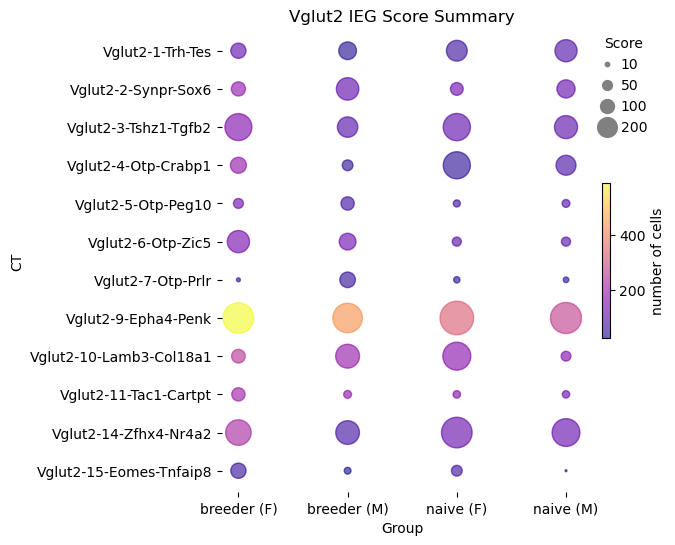

In [281]:
#scale fig size by size of cell class/scores df

%matplotlib inline
fig, ax = plt.subplots(figsize = (5,scores_df.values.shape[0]//2))
# Create meshgrid for x, y coordinates
x, y = np.meshgrid(np.arange(scores_df.values.shape[1]), np.arange(scores_df.values.shape[0]))

# Flatten the data array to match the shape of x and y
data_flat = scores_df.values.flatten()
counts_flat = counts_df.values.flatten()
# Plot scatter with size proportional to data values
p = ax.scatter(x, y, s=data_flat*1, c=counts_flat, cmap = 'plasma', alpha=0.6)
ax.set_ylabel('CT')
ax.set_xlabel('Group')
ax.set_yticks(np.arange(len(scores_df.index)))
ax.set_yticklabels(list(scores_df.index))
ax.set_xticks(np.arange(len(scores_df.columns)))
ax.set_xticklabels(['breeder (F)', 'breeder (M)', 'naive (F)', 'naive (M)'])
plt.colorbar(p, ax=ax, fraction = 0.02, label = 'number of cells')
ax.invert_yaxis()
# Remove border
ax.set_frame_on(False)
# Add size legend
sizes = [10, 50, 100, 200]  # Desired data values
size_scaled = [s * 1 for s in sizes]  # Match scaling from s=data*500
legend_elements = [plt.scatter([], [], s=s, label=f'{v}', c='gray') for s, v in zip(size_scaled, sizes)]
ax.legend(handles=legend_elements, title='Score', loc='upper right', bbox_to_anchor=(1.2, 1))

ax.set_title(cell_class + ' ' + gene_subset_name + ' Score Summary')
plt.savefig(outfolder + cell_class + '_' + gene_subset_name + '_score_summary.pdf',bbox_inches='tight')
#plt.tight_layout()
plt.show()

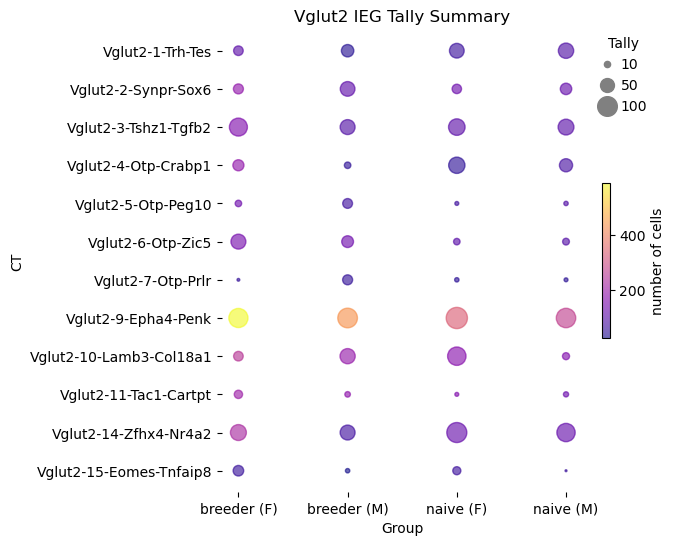

In [203]:
%matplotlib inline
fig, ax = plt.subplots(figsize = (5,tallys_df.shape[0]//2))
# Create meshgrid for x, y coordinates
x, y = np.meshgrid(np.arange(tallys_df.values.shape[1]), np.arange(tallys_df.values.shape[0]))

# Flatten the data array to match the shape of x and y
data_flat = tallys_df.values.flatten()
counts_flat = counts_df.values.flatten()
# Plot scatter with size proportional to data values
p = ax.scatter(x, y, s=data_flat*2, c=counts_flat, cmap = 'plasma', alpha=0.6)
ax.set_ylabel('CT')
ax.set_xlabel('Group')
ax.set_yticks(np.arange(len(tallys_df.index)))
ax.set_yticklabels(list(tallys_df.index))
ax.set_xticks(np.arange(len(tallys_df.columns)))
ax.set_xticklabels(['breeder (F)', 'breeder (M)', 'naive (F)', 'naive (M)'])
plt.colorbar(p, ax=ax, fraction = 0.02, label = 'number of cells')
ax.invert_yaxis()
# Remove border
ax.set_frame_on(False)
# Add size legend
sizes = [10, 50, 100]  # Desired data values
size_scaled = [s * 2 for s in sizes]  # Match scaling from s=data*500
legend_elements = [plt.scatter([], [], s=s, label=f'{v}', c='gray') for s, v in zip(size_scaled, sizes)]
ax.legend(handles=legend_elements, title='Tally', loc='upper right', bbox_to_anchor=(1.2, 1))

ax.set_title(cell_class + ' ' + gene_subset_name + ' Tally Summary')
#plt.savefig(outfolder + cell_class + '_' + gene_subset_name + '_tally_summary.pdf',bbox_inches='tight')
plt.show()

In [211]:
score_deltas_mf_df = pd.DataFrame(index=scores_df.index, columns=['Δmf_n','Δmf_b'])
score_deltas_bn_df = pd.DataFrame(index=scores_df.index, columns=['Δbn_m','Δbn_f'])

In [212]:
scores_df

,b_f,b_m,n_f,n_m
fn,,,,
Vglut2-1-Trh-Tes,120,163,224,254
Vglut2-2-Synpr-Sox6,104,262,85,172
Vglut2-3-Tshz1-Tgfb2,377,216,385,276
Vglut2-4-Otp-Crabp1,133,60,381,206
Vglut2-5-Otp-Peg10,51,92,26,32
Vglut2-6-Otp-Zic5,256,146,43,43
Vglut2-7-Otp-Prlr,8,126,21,16
Vglut2-9-Epha4-Penk,488,454,584,502
Vglut2-10-Lamb3-Col18a1,97,296,406,50


In [215]:
score_deltas_mf_df['Δmf_n'] = scores_df['n_m'] - scores_df['n_f']
score_deltas_mf_df['Δmf_b'] = scores_df['b_m'] - scores_df['b_f']
score_deltas_bn_df['Δbn_m'] = scores_df['b_m'] - scores_df['n_m']
score_deltas_bn_df['Δbn_f'] = scores_df['b_f'] - scores_df['n_f']





In [216]:
score_deltas_mf_df

,Δmf_n,Δmf_b,Δbn_m,Δbn_f
fn,,,,
Vglut2-1-Trh-Tes,30,43,-91,-104
Vglut2-2-Synpr-Sox6,87,158,90,19
Vglut2-3-Tshz1-Tgfb2,-109,-161,-60,-8
Vglut2-4-Otp-Crabp1,-175,-73,-146,-248
Vglut2-5-Otp-Peg10,6,41,60,25
Vglut2-6-Otp-Zic5,0,-110,103,213
Vglut2-7-Otp-Prlr,-5,118,110,-13
Vglut2-9-Epha4-Penk,-82,-34,-48,-96
Vglut2-10-Lamb3-Col18a1,-356,199,246,-309


In [217]:
score_deltas_bn_df

,Δbn_m,Δbn_f
fn,,
Vglut2-1-Trh-Tes,-91,-104
Vglut2-2-Synpr-Sox6,90,19
Vglut2-3-Tshz1-Tgfb2,-60,-8
Vglut2-4-Otp-Crabp1,-146,-248
Vglut2-5-Otp-Peg10,60,25
Vglut2-6-Otp-Zic5,103,213
Vglut2-7-Otp-Prlr,110,-13
Vglut2-9-Epha4-Penk,-48,-96
Vglut2-10-Lamb3-Col18a1,246,-309


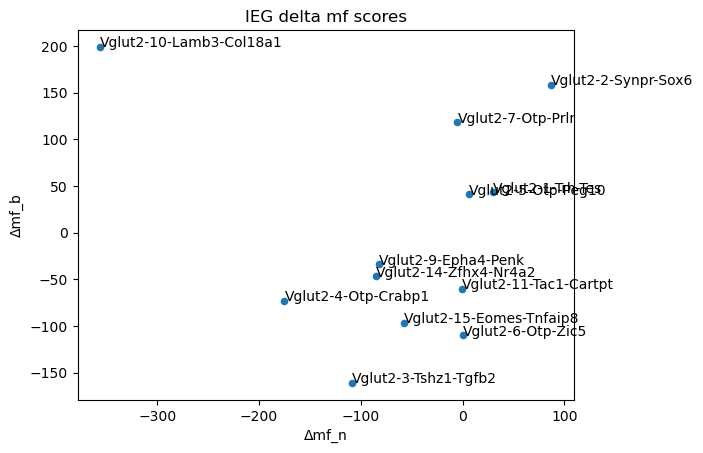

In [220]:
%matplotlib inline
ax = score_deltas_mf_df.plot(x = 'Δmf_n', y = 'Δmf_b',kind='scatter',xlabel='Δmf_n',ylabel = 'Δmf_b')
# Add labels to the points
for i, label in enumerate(score_deltas_mf_df.index):
    ax.text(score_deltas_mf_df['Δmf_n'][i], score_deltas_mf_df['Δmf_b'][i], label)
ax.set_title(gene_subset_name + ' delta mf scores')
#plt.savefig(outfolder + cell_class + '_' + gene_subset_name + '_delta_scores_mf.pdf')
plt.show()

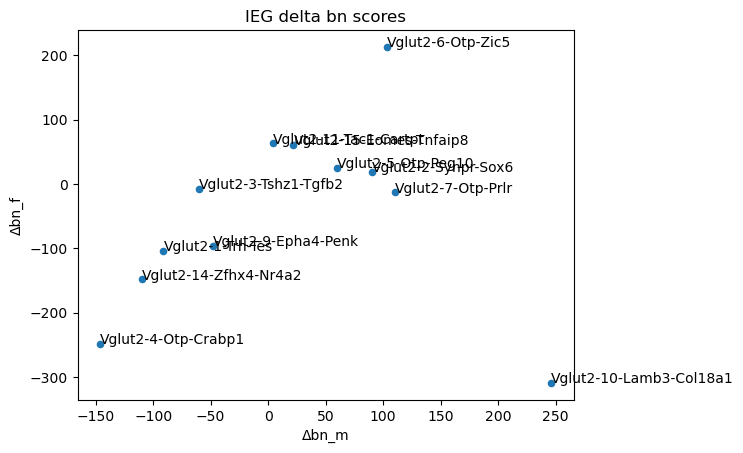

In [219]:
%matplotlib inline
ax = score_deltas_bn_df.plot(x = 'Δbn_m', y = 'Δbn_f',kind='scatter',xlabel='Δbn_m',ylabel = 'Δbn_f')
# Add labels to the points
for i, label in enumerate(score_deltas_bn_df.index):
    ax.text(score_deltas_bn_df['Δbn_m'][i], score_deltas_bn_df['Δbn_f'][i], label)
ax.set_title(gene_subset_name + ' delta bn scores')
#plt.savefig(outfolder + cell_class + '_' + gene_subset_name + '_delta_scores_bn.pdf')
plt.show()

In [235]:
opt_lim_mf = np.abs(score_deltas_mf_df.values).max(axis=None) + 50
opt_lim_bn = np.abs(score_deltas_bn_df.values).max(axis=None) + 10
opt_lim = np.max([opt_lim_mf,opt_lim_bn])
opt_lim

406

In [244]:
counts_df

,b_f,b_m,n_f,n_m
fn,,,,
Vglut2-1-Trh-Tes,104,35,59,86
Vglut2-2-Synpr-Sox6,184,107,127,116
Vglut2-3-Tshz1-Tgfb2,157,87,104,100
Vglut2-4-Otp-Crabp1,184,45,43,75
Vglut2-5-Otp-Peg10,129,64,63,90
Vglut2-6-Otp-Zic5,140,130,102,92
Vglut2-7-Otp-Prlr,50,48,41,39
Vglut2-9-Epha4-Penk,587,433,335,270
Vglut2-10-Lamb3-Col18a1,252,192,169,158


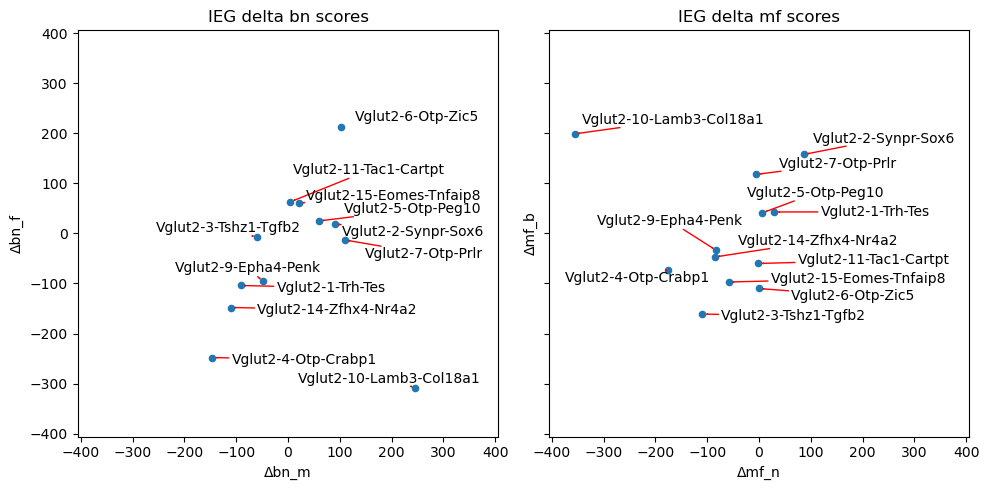

In [282]:
#combined
fig, (ax1,ax2) = plt.subplots(1,2, figsize = (10,5), sharey = True)

score_deltas_mf_df.plot(x = 'Δmf_n', y = 'Δmf_b',kind='scatter',xlabel='Δmf_n',ylabel = 'Δmf_b', ax=ax2)
# Add labels to the points
mf_texts = []
for i, label in enumerate(score_deltas_mf_df.index):
    t = ax2.text(score_deltas_mf_df['Δmf_n'][i], score_deltas_mf_df['Δmf_b'][i], label)
    mf_texts.append(t)

ax2.set_title(gene_subset_name + ' delta mf scores')
ax2.set_xlim([-opt_lim,opt_lim])
ax2.set_ylim([-opt_lim,opt_lim])
adjust_text(
    mf_texts, 
    ax=ax2,
    arrowprops=dict(arrowstyle='->', color='red'))
ax2.set_ylabel('Δmf_b')


score_deltas_bn_df.plot(x = 'Δbn_m', y = 'Δbn_f',kind='scatter',xlabel='Δbn_m',ylabel = 'Δbn_f', ax = ax1)
# Add labels to the points
bn_texts = []
for i, label in enumerate(score_deltas_bn_df.index):
    t = ax1.text(score_deltas_bn_df['Δbn_m'][i], score_deltas_bn_df['Δbn_f'][i], label)
    bn_texts.append(t)
ax1.set_title(gene_subset_name + ' delta bn scores')

ax1.set_xlim([-opt_lim,opt_lim])
ax1.set_ylim([-opt_lim,opt_lim])
adjust_text(
    bn_texts, 
    ax=ax1,
    arrowprops=dict(arrowstyle='->', color='red'))

ax2.yaxis.get_label().set_visible(True)

plt.tight_layout()
plt.savefig(outfolder + cell_class + '_' + gene_subset_name + '_delta_scores_combined.pdf')
plt.show()


In [259]:
outfolder

'/bigdata/isaac/Vglut2_files/sex_stats/050325_run_IEG/IEG_corr_plots/'

Run Corr Analysis Script

In [ ]:
run = '050325_run_IEG'
cell_class = 'Vglut2'
delta_data_folder = '/bigdata/isaac/'+ cell_class + '_files/sex_stats/'+run+'/gene_delta_plots/data/'
genes = IEG_updated_list
gene_subset_name = 'IEG'
outfolder = '/bigdata/isaac/'+ cell_class + '_files/sex_stats/'+run +'/' + gene_subset_name + '_corr_plots/'

rca.run_corr_analysis(run, cell_class, delta_data_folder, genes, gene_subset_name,outfolder)


creating directory, gathering files...
done. sorted raw files/metadata files:
['Vglut2_expr_raw_df_c_Vglut2-1-Trh-Tes.json', 'Vglut2_expr_raw_df_c_Vglut2-2-Synpr-Sox6.json', 'Vglut2_expr_raw_df_c_Vglut2-3-Tshz1-Tgfb2.json', 'Vglut2_expr_raw_df_c_Vglut2-4-Otp-Crabp1.json', 'Vglut2_expr_raw_df_c_Vglut2-5-Otp-Peg10.json', 'Vglut2_expr_raw_df_c_Vglut2-6-Otp-Zic5.json', 'Vglut2_expr_raw_df_c_Vglut2-7-Otp-Prlr.json', 'Vglut2_expr_raw_df_c_Vglut2-8-Arhgef40-Thrsp.json', 'Vglut2_expr_raw_df_c_Vglut2-9-Epha4-Penk.json', 'Vglut2_expr_raw_df_c_Vglut2-10-Lamb3-Col18a1.json', 'Vglut2_expr_raw_df_c_Vglut2-11-Tac1-Cartpt.json', 'Vglut2_expr_raw_df_c_Vglut2-12-Tshz1-Grp.json', 'Vglut2_expr_raw_df_c_Vglut2-13-Tshz1-Calcr.json', 'Vglut2_expr_raw_df_c_Vglut2-14-Zfhx4-Nr4a2.json', 'Vglut2_expr_raw_df_c_Vglut2-15-Eomes-Tnfaip8.json', 'Vglut2_expr_raw_df_c_Vglut2-17-Otp-Avp.json']
['Vglut2_metadata_df_c_Vglut2-1-Trh-Tes.json', 'Vglut2_metadata_df_c_Vglut2-2-Synpr-Sox6.json', 'Vglut2_metadata_df_c_Vglut2-3-T

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

processing:  Vglut2-2-Synpr-Sox6


<IPython.core.display.Javascript object>

processing:  Vglut2-3-Tshz1-Tgfb2


<IPython.core.display.Javascript object>

processing:  Vglut2-4-Otp-Crabp1


<IPython.core.display.Javascript object>

processing:  Vglut2-5-Otp-Peg10


<IPython.core.display.Javascript object>

processing:  Vglut2-6-Otp-Zic5


<IPython.core.display.Javascript object>

processing:  Vglut2-7-Otp-Prlr


<IPython.core.display.Javascript object>

processing:  Vglut2-8-Arhgef40-Thrsp
one or more groups has <20 cells, skipping...
processing:  Vglut2-9-Epha4-Penk


<IPython.core.display.Javascript object>

processing:  Vglut2-10-Lamb3-Col18a1


<IPython.core.display.Javascript object>

processing:  Vglut2-11-Tac1-Cartpt


<IPython.core.display.Javascript object>

processing:  Vglut2-12-Tshz1-Grp
one or more groups has <20 cells, skipping...
processing:  Vglut2-13-Tshz1-Calcr
one or more groups has <20 cells, skipping...
processing:  Vglut2-14-Zfhx4-Nr4a2


<IPython.core.display.Javascript object>

processing:  Vglut2-15-Eomes-Tnfaip8


<IPython.core.display.Javascript object>

processing:  Vglut2-17-Otp-Avp
one or more groups has <20 cells, skipping...
finished correlation calculations, merging into single pdf
heatmap mode
['Vglut2-1-Trh-Tes_IEG_correlation_group_compare.pdf', 'Vglut2-7-Otp-Prlr_IEG_correlation_group_compare.pdf', 'Vglut2-5-Otp-Peg10_IEG_correlation_group_compare.pdf', 'Vglut2-6-Otp-Zic5_IEG_correlation_group_compare.pdf', 'Vglut2-2-Synpr-Sox6_IEG_correlation_group_compare.pdf', 'Vglut2-15-Eomes-Tnfaip8_IEG_correlation_group_compare.pdf', 'Vglut2-11-Tac1-Cartpt_IEG_correlation_group_compare.pdf', 'Vglut2-14-Zfhx4-Nr4a2_IEG_correlation_group_compare.pdf', 'Vglut2-9-Epha4-Penk_IEG_correlation_group_compare.pdf', 'Vglut2-4-Otp-Crabp1_IEG_correlation_group_compare.pdf', 'Vglut2-3-Tshz1-Tgfb2_IEG_correlation_group_compare.pdf', 'Vglut2-10-Lamb3-Col18a1_IEG_correlation_group_compare.pdf']


None
Merged PDF saved as /bigdata/isaac/Vglut2_files/sex_stats/050325_run_IEG/IEG_corr_plots/Vglut2_IEGw_scores_corr_avg_filtered_correlation_plots_GC_ALL.pdf


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

done.
computing and visualizing score deltas...


<IPython.core.display.Javascript object>

done.
corr analysis complete. results in : /bigdata/isaac/Vglut2_files/sex_stats/050325_run_IEG/IEG_corr_plots/


In [ ]:
classes = ["gaba", 'Vglut1', 'Vglut2']

for c in classes:
    run = '050325_run_IEG'
    cell_class = c
    delta_data_folder = '/bigdata/isaac/'+ cell_class + '_files/sex_stats/'+run+'/gene_delta_plots/data/'
    genes = IEG_updated_list
    gene_subset_name = 'IEG'
    outfolder = '/bigdata/isaac/'+ cell_class + '_files/sex_stats/'+run +'/' + gene_subset_name + '_corr_plots/'

    rca.run_corr_analysis(run, cell_class, delta_data_folder, genes, gene_subset_name,outfolder)



creating directory, gathering files...
done. sorted raw files/metadata files:
['gaba_expr_raw_df_c_GABA-1-Sst-Npy-Spon1.json', 'gaba_expr_raw_df_c_GABA-2-Sst-Npy-Maf.json', 'gaba_expr_raw_df_c_GABA-3-Sst-Npy-Chodl.json', 'gaba_expr_raw_df_c_GABA-4-Moxd1-Pvalb.json', 'gaba_expr_raw_df_c_GABA-5-Moxd1-Vwc2.json', 'gaba_expr_raw_df_c_GABA-6-Hapln1-Cryab.json', 'gaba_expr_raw_df_c_GABA-7-Vip-Crh.json', 'gaba_expr_raw_df_c_GABA-8-Htr3a-Rgs12.json', 'gaba_expr_raw_df_c_GABA-9-Dab1-Myh7.json', 'gaba_expr_raw_df_c_GABA-10-Pax6-Npnt.json', 'gaba_expr_raw_df_c_GABA-11-Pax6-Calca.json', 'gaba_expr_raw_df_c_GABA-12-Sncg-Reln.json', 'gaba_expr_raw_df_c_GABA-13-Fign-Lrpprc.json', 'gaba_expr_raw_df_c_GABA-14-Isl1-Gal.json', 'gaba_expr_raw_df_c_GABA-15-Igsf1-Zfhx3.json', 'gaba_expr_raw_df_c_GABA-16-Lmo1-Chn2.json', 'gaba_expr_raw_df_c_GABA-17-Isl1-Pou3f2.json', 'gaba_expr_raw_df_c_GABA-18-Meis2-Dach1.json', 'gaba_expr_raw_df_c_GABA-19-Meis2-Tshz1.json', 'gaba_expr_raw_df_c_GABA-20-Meis2-Foxp2.json', 'g

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

processing:  GABA-2-Sst-Npy-Maf


<IPython.core.display.Javascript object>

processing:  GABA-3-Sst-Npy-Chodl
one or more groups has <20 cells, skipping...
processing:  GABA-4-Moxd1-Pvalb


<IPython.core.display.Javascript object>

processing:  GABA-5-Moxd1-Vwc2


<IPython.core.display.Javascript object>

processing:  GABA-6-Hapln1-Cryab
one or more groups has <20 cells, skipping...
processing:  GABA-7-Vip-Crh


<IPython.core.display.Javascript object>

processing:  GABA-8-Htr3a-Rgs12


<IPython.core.display.Javascript object>

processing:  GABA-9-Dab1-Myh7


<IPython.core.display.Javascript object>

processing:  GABA-10-Pax6-Npnt


<IPython.core.display.Javascript object>

processing:  GABA-11-Pax6-Calca


<IPython.core.display.Javascript object>

processing:  GABA-12-Sncg-Reln


<IPython.core.display.Javascript object>

processing:  GABA-13-Fign-Lrpprc


<IPython.core.display.Javascript object>

processing:  GABA-14-Isl1-Gal


<IPython.core.display.Javascript object>

processing:  GABA-15-Igsf1-Zfhx3


<IPython.core.display.Javascript object>

processing:  GABA-16-Lmo1-Chn2
one or more groups has <20 cells, skipping...
processing:  GABA-17-Isl1-Pou3f2
one or more groups has <20 cells, skipping...
processing:  GABA-18-Meis2-Dach1
one or more groups has <20 cells, skipping...
processing:  GABA-19-Meis2-Tshz1


<IPython.core.display.Javascript object>

processing:  GABA-20-Meis2-Foxp2


<IPython.core.display.Javascript object>

processing:  GABA-21-Meis2-Nwd2


<IPython.core.display.Javascript object>

processing:  GABA-22-Col23a1-Hs3st4


<IPython.core.display.Javascript object>

processing:  GABA-23-Pde11a-Npy2r


<IPython.core.display.Javascript object>

processing:  GABA-24-Prlr-St18


<IPython.core.display.Javascript object>

processing:  GABA-25-Oprk1-Trhde


<IPython.core.display.Javascript object>

processing:  GABA-26-Col18a1-Jsrp1


<IPython.core.display.Javascript object>

processing:  GABA-27-Greb1-Dlk1


<IPython.core.display.Javascript object>

processing:  GABA-28-Lypd1-Satb1


<IPython.core.display.Javascript object>

processing:  GABA-29-Lpyd1-Unc13c


<IPython.core.display.Javascript object>

processing:  GABA-30-Cbln4-Zbtb20


<IPython.core.display.Javascript object>

processing:  GABA-31-Fign-Foxp2


<IPython.core.display.Javascript object>

processing:  GABA-32-Cartpt-Dkk2
one or more groups has <20 cells, skipping...
processing:  GABA-33-Cartpt-Unc13c


<IPython.core.display.Javascript object>

finished correlation calculations, merging into single pdf
heatmap mode
['GABA-5-Moxd1-Vwc2_IEG_correlation_group_compare.pdf', 'GABA-12-Sncg-Reln_IEG_correlation_group_compare.pdf', 'GABA-24-Prlr-St18_IEG_correlation_group_compare.pdf', 'GABA-8-Htr3a-Rgs12_IEG_correlation_group_compare.pdf', 'GABA-28-Lypd1-Satb1_IEG_correlation_group_compare.pdf', 'GABA-1-Sst-Npy-Spon1_IEG_correlation_group_compare.pdf', 'GABA-11-Pax6-Calca_IEG_correlation_group_compare.pdf', 'GABA-22-Col23a1-Hs3st4_IEG_correlation_group_compare.pdf', 'GABA-19-Meis2-Tshz1_IEG_correlation_group_compare.pdf', 'GABA-21-Meis2-Nwd2_IEG_correlation_group_compare.pdf', 'GABA-31-Fign-Foxp2_IEG_correlation_group_compare.pdf', 'GABA-20-Meis2-Foxp2_IEG_correlation_group_compare.pdf', 'GABA-27-Greb1-Dlk1_IEG_correlation_group_compare.pdf', 'GABA-4-Moxd1-Pvalb_IEG_correlation_group_compare.pdf', 'GABA-7-Vip-Crh_IEG_correlation_group_compare.pdf', 'GABA-33-Cartpt-Unc13c_IEG_correlation_group_compare.pdf', 'GABA-15-Igsf1-Zfhx3_IEG_c

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

done.
computing and visualizing score deltas...


<IPython.core.display.Javascript object>

done.
corr analysis complete. results in : /bigdata/isaac/gaba_files/sex_stats/050325_run_IEG/IEG_corr_plots/
creating directory, gathering files...
done. sorted raw files/metadata files:
['Vglut1_expr_raw_df_c_Vglut1-2-Rims3-Cyp26b1.json', 'Vglut1_expr_raw_df_c_Vglut1-3-Tshz2-Stxbp6.json', 'Vglut1_expr_raw_df_c_Vglut1-4-Snca-Satb2.json', 'Vglut1_expr_raw_df_c_Vglut1-5-Moxd1-Gpr88.json', 'Vglut1_expr_raw_df_c_Vglut1-6-Trh-Rxfp1.json', 'Vglut1_expr_raw_df_c_Vglut1-7-Il33-Prox1.json', 'Vglut1_expr_raw_df_c_Vglut1-8-Fst-Cd44.json', 'Vglut1_expr_raw_df_c_Vglut1-9-Slc1a3-Ecm2.json', 'Vglut1_expr_raw_df_c_Vglut1-10-Ecel1-Sox5.json', 'Vglut1_expr_raw_df_c_Vglut1-11-C1ql2-Pcdh11x.json', 'Vglut1_expr_raw_df_c_Vglut1-12-Dlk1-Dcn.json']
['Vglut1_metadata_df_c_Vglut1-2-Rims3-Cyp26b1.json', 'Vglut1_metadata_df_c_Vglut1-3-Tshz2-Stxbp6.json', 'Vglut1_metadata_df_c_Vglut1-4-Snca-Satb2.json', 'Vglut1_metadata_df_c_Vglut1-5-Moxd1-Gpr88.json', 'Vglut1_metadata_df_c_Vglut1-6-Trh-Rxfp1.json', 'Vglut1_metad

<IPython.core.display.Javascript object>

processing:  Vglut1-4-Snca-Satb2
one or more groups has <20 cells, skipping...
processing:  Vglut1-5-Moxd1-Gpr88


<IPython.core.display.Javascript object>

processing:  Vglut1-6-Trh-Rxfp1


<IPython.core.display.Javascript object>

processing:  Vglut1-7-Il33-Prox1


<IPython.core.display.Javascript object>

processing:  Vglut1-8-Fst-Cd44


<IPython.core.display.Javascript object>

processing:  Vglut1-9-Slc1a3-Ecm2


<IPython.core.display.Javascript object>

processing:  Vglut1-10-Ecel1-Sox5


<IPython.core.display.Javascript object>

processing:  Vglut1-11-C1ql2-Pcdh11x


<IPython.core.display.Javascript object>

processing:  Vglut1-12-Dlk1-Dcn


<IPython.core.display.Javascript object>

finished correlation calculations, merging into single pdf
heatmap mode
['Vglut1-8-Fst-Cd44_IEG_correlation_group_compare.pdf', 'Vglut1-12-Dlk1-Dcn_IEG_correlation_group_compare.pdf', 'Vglut1-5-Moxd1-Gpr88_IEG_correlation_group_compare.pdf', 'Vglut1-7-Il33-Prox1_IEG_correlation_group_compare.pdf', 'Vglut1-10-Ecel1-Sox5_IEG_correlation_group_compare.pdf', 'Vglut1-3-Tshz2-Stxbp6_IEG_correlation_group_compare.pdf', 'Vglut1-11-C1ql2-Pcdh11x_IEG_correlation_group_compare.pdf', 'Vglut1-9-Slc1a3-Ecm2_IEG_correlation_group_compare.pdf', 'Vglut1-6-Trh-Rxfp1_IEG_correlation_group_compare.pdf']


None
Merged PDF saved as /bigdata/isaac/Vglut1_files/sex_stats/050325_run_IEG/IEG_corr_plots/Vglut1_IEGw_scores_corr_avg_filtered_correlation_plots_GC_ALL.pdf
done.
saving results to csv...
done.
generating dot plot summaries...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

done.
computing and visualizing score deltas...


<IPython.core.display.Javascript object>

done.
corr analysis complete. results in : /bigdata/isaac/Vglut1_files/sex_stats/050325_run_IEG/IEG_corr_plots/


Same Corr Analysis on Other Gene Lists

In [8]:
gene_subset_name = 'glutrec'
classes = ["gaba", 'Vglut1', 'Vglut2']

gene_list = []
with open('/bigdata/isaac/glutrec_gene_list.txt', 'r') as fh:
    for g in fh:
        gene_list.append(g[:-1])

for c in classes:
    run = '050325_run_IEG'
    cell_class = c
    delta_data_folder = '/bigdata/isaac/'+ cell_class + '_files/sex_stats/'+run+'/gene_delta_plots/data/'
    genes = gene_list
    outfolder = '/bigdata/isaac/'+ cell_class + '_files/sex_stats/'+run +'/' + gene_subset_name + '_corr_plots/'
    rca.run_corr_analysis(run, cell_class, delta_data_folder, genes, gene_subset_name,outfolder)



creating directory, gathering files...
done. sorted raw files/metadata files:
['gaba_expr_raw_df_c_GABA-1-Sst-Npy-Spon1.json', 'gaba_expr_raw_df_c_GABA-2-Sst-Npy-Maf.json', 'gaba_expr_raw_df_c_GABA-3-Sst-Npy-Chodl.json', 'gaba_expr_raw_df_c_GABA-4-Moxd1-Pvalb.json', 'gaba_expr_raw_df_c_GABA-5-Moxd1-Vwc2.json', 'gaba_expr_raw_df_c_GABA-6-Hapln1-Cryab.json', 'gaba_expr_raw_df_c_GABA-7-Vip-Crh.json', 'gaba_expr_raw_df_c_GABA-8-Htr3a-Rgs12.json', 'gaba_expr_raw_df_c_GABA-9-Dab1-Myh7.json', 'gaba_expr_raw_df_c_GABA-10-Pax6-Npnt.json', 'gaba_expr_raw_df_c_GABA-11-Pax6-Calca.json', 'gaba_expr_raw_df_c_GABA-12-Sncg-Reln.json', 'gaba_expr_raw_df_c_GABA-13-Fign-Lrpprc.json', 'gaba_expr_raw_df_c_GABA-14-Isl1-Gal.json', 'gaba_expr_raw_df_c_GABA-15-Igsf1-Zfhx3.json', 'gaba_expr_raw_df_c_GABA-16-Lmo1-Chn2.json', 'gaba_expr_raw_df_c_GABA-17-Isl1-Pou3f2.json', 'gaba_expr_raw_df_c_GABA-18-Meis2-Dach1.json', 'gaba_expr_raw_df_c_GABA-19-Meis2-Tshz1.json', 'gaba_expr_raw_df_c_GABA-20-Meis2-Foxp2.json', 'g

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

processing:  GABA-2-Sst-Npy-Maf


<IPython.core.display.Javascript object>

processing:  GABA-3-Sst-Npy-Chodl
one or more groups has <20 cells, skipping...
processing:  GABA-4-Moxd1-Pvalb


<IPython.core.display.Javascript object>

processing:  GABA-5-Moxd1-Vwc2


<IPython.core.display.Javascript object>

processing:  GABA-6-Hapln1-Cryab
one or more groups has <20 cells, skipping...
processing:  GABA-7-Vip-Crh


<IPython.core.display.Javascript object>

processing:  GABA-8-Htr3a-Rgs12


<IPython.core.display.Javascript object>

processing:  GABA-9-Dab1-Myh7


<IPython.core.display.Javascript object>

processing:  GABA-10-Pax6-Npnt


<IPython.core.display.Javascript object>

processing:  GABA-11-Pax6-Calca


<IPython.core.display.Javascript object>

processing:  GABA-12-Sncg-Reln


<IPython.core.display.Javascript object>

processing:  GABA-13-Fign-Lrpprc


<IPython.core.display.Javascript object>

processing:  GABA-14-Isl1-Gal


<IPython.core.display.Javascript object>

processing:  GABA-15-Igsf1-Zfhx3


<IPython.core.display.Javascript object>

processing:  GABA-16-Lmo1-Chn2
one or more groups has <20 cells, skipping...
processing:  GABA-17-Isl1-Pou3f2
one or more groups has <20 cells, skipping...
processing:  GABA-18-Meis2-Dach1
one or more groups has <20 cells, skipping...
processing:  GABA-19-Meis2-Tshz1


<IPython.core.display.Javascript object>

processing:  GABA-20-Meis2-Foxp2


<IPython.core.display.Javascript object>

processing:  GABA-21-Meis2-Nwd2


<IPython.core.display.Javascript object>

processing:  GABA-22-Col23a1-Hs3st4


<IPython.core.display.Javascript object>

processing:  GABA-23-Pde11a-Npy2r


<IPython.core.display.Javascript object>

processing:  GABA-24-Prlr-St18


<IPython.core.display.Javascript object>

processing:  GABA-25-Oprk1-Trhde


<IPython.core.display.Javascript object>

processing:  GABA-26-Col18a1-Jsrp1


<IPython.core.display.Javascript object>

processing:  GABA-27-Greb1-Dlk1


<IPython.core.display.Javascript object>

processing:  GABA-28-Lypd1-Satb1


<IPython.core.display.Javascript object>

processing:  GABA-29-Lpyd1-Unc13c


<IPython.core.display.Javascript object>

processing:  GABA-30-Cbln4-Zbtb20


<IPython.core.display.Javascript object>

processing:  GABA-31-Fign-Foxp2


<IPython.core.display.Javascript object>

processing:  GABA-32-Cartpt-Dkk2
one or more groups has <20 cells, skipping...
processing:  GABA-33-Cartpt-Unc13c


<IPython.core.display.Javascript object>

finished correlation calculations, merging into single pdf
heatmap mode
['GABA-15-Igsf1-Zfhx3_glutrec_correlation_group_compare.pdf', 'GABA-8-Htr3a-Rgs12_glutrec_correlation_group_compare.pdf', 'GABA-14-Isl1-Gal_glutrec_correlation_group_compare.pdf', 'GABA-4-Moxd1-Pvalb_glutrec_correlation_group_compare.pdf', 'GABA-22-Col23a1-Hs3st4_glutrec_correlation_group_compare.pdf', 'GABA-7-Vip-Crh_glutrec_correlation_group_compare.pdf', 'GABA-30-Cbln4-Zbtb20_glutrec_correlation_group_compare.pdf', 'GABA-9-Dab1-Myh7_glutrec_correlation_group_compare.pdf', 'GABA-19-Meis2-Tshz1_glutrec_correlation_group_compare.pdf', 'GABA-29-Lpyd1-Unc13c_glutrec_correlation_group_compare.pdf', 'GABA-28-Lypd1-Satb1_glutrec_correlation_group_compare.pdf', 'GABA-2-Sst-Npy-Maf_glutrec_correlation_group_compare.pdf', 'GABA-13-Fign-Lrpprc_glutrec_correlation_group_compare.pdf', 'GABA-11-Pax6-Calca_glutrec_correlation_group_compare.pdf', 'GABA-1-Sst-Npy-Spon1_glutrec_correlation_group_compare.pdf', 'GABA-12-Sncg-Reln_gl

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

done.
computing and visualizing score deltas...


<IPython.core.display.Javascript object>

done.
corr analysis complete. results in : /bigdata/isaac/gaba_files/sex_stats/050325_run_IEG/glutrec_corr_plots/
creating directory, gathering files...
done. sorted raw files/metadata files:
['Vglut1_expr_raw_df_c_Vglut1-2-Rims3-Cyp26b1.json', 'Vglut1_expr_raw_df_c_Vglut1-3-Tshz2-Stxbp6.json', 'Vglut1_expr_raw_df_c_Vglut1-4-Snca-Satb2.json', 'Vglut1_expr_raw_df_c_Vglut1-5-Moxd1-Gpr88.json', 'Vglut1_expr_raw_df_c_Vglut1-6-Trh-Rxfp1.json', 'Vglut1_expr_raw_df_c_Vglut1-7-Il33-Prox1.json', 'Vglut1_expr_raw_df_c_Vglut1-8-Fst-Cd44.json', 'Vglut1_expr_raw_df_c_Vglut1-9-Slc1a3-Ecm2.json', 'Vglut1_expr_raw_df_c_Vglut1-10-Ecel1-Sox5.json', 'Vglut1_expr_raw_df_c_Vglut1-11-C1ql2-Pcdh11x.json', 'Vglut1_expr_raw_df_c_Vglut1-12-Dlk1-Dcn.json']
['Vglut1_metadata_df_c_Vglut1-2-Rims3-Cyp26b1.json', 'Vglut1_metadata_df_c_Vglut1-3-Tshz2-Stxbp6.json', 'Vglut1_metadata_df_c_Vglut1-4-Snca-Satb2.json', 'Vglut1_metadata_df_c_Vglut1-5-Moxd1-Gpr88.json', 'Vglut1_metadata_df_c_Vglut1-6-Trh-Rxfp1.json', 'Vglut1_m

<IPython.core.display.Javascript object>

processing:  Vglut1-4-Snca-Satb2
one or more groups has <20 cells, skipping...
processing:  Vglut1-5-Moxd1-Gpr88


<IPython.core.display.Javascript object>

processing:  Vglut1-6-Trh-Rxfp1


<IPython.core.display.Javascript object>

processing:  Vglut1-7-Il33-Prox1


<IPython.core.display.Javascript object>

processing:  Vglut1-8-Fst-Cd44


<IPython.core.display.Javascript object>

processing:  Vglut1-9-Slc1a3-Ecm2


<IPython.core.display.Javascript object>

processing:  Vglut1-10-Ecel1-Sox5


<IPython.core.display.Javascript object>

processing:  Vglut1-11-C1ql2-Pcdh11x


<IPython.core.display.Javascript object>

processing:  Vglut1-12-Dlk1-Dcn


<IPython.core.display.Javascript object>

finished correlation calculations, merging into single pdf
heatmap mode
['Vglut1-10-Ecel1-Sox5_glutrec_correlation_group_compare.pdf', 'Vglut1-8-Fst-Cd44_glutrec_correlation_group_compare.pdf', 'Vglut1-9-Slc1a3-Ecm2_glutrec_correlation_group_compare.pdf', 'Vglut1-11-C1ql2-Pcdh11x_glutrec_correlation_group_compare.pdf', 'Vglut1-7-Il33-Prox1_glutrec_correlation_group_compare.pdf', 'Vglut1-12-Dlk1-Dcn_glutrec_correlation_group_compare.pdf', 'Vglut1-3-Tshz2-Stxbp6_glutrec_correlation_group_compare.pdf', 'Vglut1-6-Trh-Rxfp1_glutrec_correlation_group_compare.pdf', 'Vglut1-5-Moxd1-Gpr88_glutrec_correlation_group_compare.pdf']


None
Merged PDF saved as /bigdata/isaac/Vglut1_files/sex_stats/050325_run_IEG/glutrec_corr_plots/Vglut1_glutrecw_scores_corr_avg_filtered_correlation_plots_GC_ALL.pdf
done.
saving results to csv...
done.
generating dot plot summaries...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

done.
computing and visualizing score deltas...


<IPython.core.display.Javascript object>

done.
corr analysis complete. results in : /bigdata/isaac/Vglut1_files/sex_stats/050325_run_IEG/glutrec_corr_plots/
creating directory, gathering files...
done. sorted raw files/metadata files:
['Vglut2_expr_raw_df_c_Vglut2-1-Trh-Tes.json', 'Vglut2_expr_raw_df_c_Vglut2-2-Synpr-Sox6.json', 'Vglut2_expr_raw_df_c_Vglut2-3-Tshz1-Tgfb2.json', 'Vglut2_expr_raw_df_c_Vglut2-4-Otp-Crabp1.json', 'Vglut2_expr_raw_df_c_Vglut2-5-Otp-Peg10.json', 'Vglut2_expr_raw_df_c_Vglut2-6-Otp-Zic5.json', 'Vglut2_expr_raw_df_c_Vglut2-7-Otp-Prlr.json', 'Vglut2_expr_raw_df_c_Vglut2-8-Arhgef40-Thrsp.json', 'Vglut2_expr_raw_df_c_Vglut2-9-Epha4-Penk.json', 'Vglut2_expr_raw_df_c_Vglut2-10-Lamb3-Col18a1.json', 'Vglut2_expr_raw_df_c_Vglut2-11-Tac1-Cartpt.json', 'Vglut2_expr_raw_df_c_Vglut2-12-Tshz1-Grp.json', 'Vglut2_expr_raw_df_c_Vglut2-13-Tshz1-Calcr.json', 'Vglut2_expr_raw_df_c_Vglut2-14-Zfhx4-Nr4a2.json', 'Vglut2_expr_raw_df_c_Vglut2-15-Eomes-Tnfaip8.json', 'Vglut2_expr_raw_df_c_Vglut2-17-Otp-Avp.json']
['Vglut2_met

<IPython.core.display.Javascript object>

processing:  Vglut2-2-Synpr-Sox6


<IPython.core.display.Javascript object>

processing:  Vglut2-3-Tshz1-Tgfb2


<IPython.core.display.Javascript object>

processing:  Vglut2-4-Otp-Crabp1


<IPython.core.display.Javascript object>

processing:  Vglut2-5-Otp-Peg10


<IPython.core.display.Javascript object>

processing:  Vglut2-6-Otp-Zic5


<IPython.core.display.Javascript object>

processing:  Vglut2-7-Otp-Prlr


<IPython.core.display.Javascript object>

processing:  Vglut2-8-Arhgef40-Thrsp
one or more groups has <20 cells, skipping...
processing:  Vglut2-9-Epha4-Penk


<IPython.core.display.Javascript object>

processing:  Vglut2-10-Lamb3-Col18a1


<IPython.core.display.Javascript object>

processing:  Vglut2-11-Tac1-Cartpt


<IPython.core.display.Javascript object>

processing:  Vglut2-12-Tshz1-Grp
one or more groups has <20 cells, skipping...
processing:  Vglut2-13-Tshz1-Calcr
one or more groups has <20 cells, skipping...
processing:  Vglut2-14-Zfhx4-Nr4a2


<IPython.core.display.Javascript object>

processing:  Vglut2-15-Eomes-Tnfaip8


<IPython.core.display.Javascript object>

processing:  Vglut2-17-Otp-Avp
one or more groups has <20 cells, skipping...
finished correlation calculations, merging into single pdf
heatmap mode
['Vglut2-15-Eomes-Tnfaip8_glutrec_correlation_group_compare.pdf', 'Vglut2-6-Otp-Zic5_glutrec_correlation_group_compare.pdf', 'Vglut2-10-Lamb3-Col18a1_glutrec_correlation_group_compare.pdf', 'Vglut2-5-Otp-Peg10_glutrec_correlation_group_compare.pdf', 'Vglut2-3-Tshz1-Tgfb2_glutrec_correlation_group_compare.pdf', 'Vglut2-2-Synpr-Sox6_glutrec_correlation_group_compare.pdf', 'Vglut2-4-Otp-Crabp1_glutrec_correlation_group_compare.pdf', 'Vglut2-1-Trh-Tes_glutrec_correlation_group_compare.pdf', 'Vglut2-14-Zfhx4-Nr4a2_glutrec_correlation_group_compare.pdf', 'Vglut2-11-Tac1-Cartpt_glutrec_correlation_group_compare.pdf', 'Vglut2-7-Otp-Prlr_glutrec_correlation_group_compare.pdf', 'Vglut2-9-Epha4-Penk_glutrec_correlation_group_compare.pdf']


None
Merged PDF saved as /bigdata/isaac/Vglut2_files/sex_stats/050325_run_IEG/glutrec_corr_plots/Vglut2_glutrec

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

done.
computing and visualizing score deltas...


<IPython.core.display.Javascript object>

done.
corr analysis complete. results in : /bigdata/isaac/Vglut2_files/sex_stats/050325_run_IEG/glutrec_corr_plots/


In [2]:
gene_subset_name = 'gabarec'
classes = ["gaba", 'Vglut1', 'Vglut2']

gene_list = []
with open('/bigdata/isaac/gabarec_gene_list.txt', 'r') as fh:
    for g in fh:
        gene_list.append(g[:-1])

for c in classes:
    run = '050325_run_IEG'
    cell_class = c
    delta_data_folder = '/bigdata/isaac/'+ cell_class + '_files/sex_stats/'+run+'/gene_delta_plots/data/'
    genes = gene_list
    outfolder = '/bigdata/isaac/'+ cell_class + '_files/sex_stats/'+run +'/' + gene_subset_name + '_corr_plots/'
    rca.run_corr_analysis(run, cell_class, delta_data_folder, genes, gene_subset_name,outfolder)

creating directory, gathering files...
done. sorted raw files/metadata files:
['gaba_expr_raw_df_c_GABA-1-Sst-Npy-Spon1.json', 'gaba_expr_raw_df_c_GABA-2-Sst-Npy-Maf.json', 'gaba_expr_raw_df_c_GABA-3-Sst-Npy-Chodl.json', 'gaba_expr_raw_df_c_GABA-4-Moxd1-Pvalb.json', 'gaba_expr_raw_df_c_GABA-5-Moxd1-Vwc2.json', 'gaba_expr_raw_df_c_GABA-6-Hapln1-Cryab.json', 'gaba_expr_raw_df_c_GABA-7-Vip-Crh.json', 'gaba_expr_raw_df_c_GABA-8-Htr3a-Rgs12.json', 'gaba_expr_raw_df_c_GABA-9-Dab1-Myh7.json', 'gaba_expr_raw_df_c_GABA-10-Pax6-Npnt.json', 'gaba_expr_raw_df_c_GABA-11-Pax6-Calca.json', 'gaba_expr_raw_df_c_GABA-12-Sncg-Reln.json', 'gaba_expr_raw_df_c_GABA-13-Fign-Lrpprc.json', 'gaba_expr_raw_df_c_GABA-14-Isl1-Gal.json', 'gaba_expr_raw_df_c_GABA-15-Igsf1-Zfhx3.json', 'gaba_expr_raw_df_c_GABA-16-Lmo1-Chn2.json', 'gaba_expr_raw_df_c_GABA-17-Isl1-Pou3f2.json', 'gaba_expr_raw_df_c_GABA-18-Meis2-Dach1.json', 'gaba_expr_raw_df_c_GABA-19-Meis2-Tshz1.json', 'gaba_expr_raw_df_c_GABA-20-Meis2-Foxp2.json', 'g

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

processing:  GABA-2-Sst-Npy-Maf


<IPython.core.display.Javascript object>

processing:  GABA-3-Sst-Npy-Chodl
one or more groups has <20 cells, skipping...
processing:  GABA-4-Moxd1-Pvalb


<IPython.core.display.Javascript object>

processing:  GABA-5-Moxd1-Vwc2


<IPython.core.display.Javascript object>

processing:  GABA-6-Hapln1-Cryab
one or more groups has <20 cells, skipping...
processing:  GABA-7-Vip-Crh


<IPython.core.display.Javascript object>

processing:  GABA-8-Htr3a-Rgs12


<IPython.core.display.Javascript object>

processing:  GABA-9-Dab1-Myh7


<IPython.core.display.Javascript object>

processing:  GABA-10-Pax6-Npnt


<IPython.core.display.Javascript object>

processing:  GABA-11-Pax6-Calca


<IPython.core.display.Javascript object>

processing:  GABA-12-Sncg-Reln


<IPython.core.display.Javascript object>

processing:  GABA-13-Fign-Lrpprc


<IPython.core.display.Javascript object>

processing:  GABA-14-Isl1-Gal


<IPython.core.display.Javascript object>

processing:  GABA-15-Igsf1-Zfhx3


<IPython.core.display.Javascript object>

processing:  GABA-16-Lmo1-Chn2
one or more groups has <20 cells, skipping...
processing:  GABA-17-Isl1-Pou3f2
one or more groups has <20 cells, skipping...
processing:  GABA-18-Meis2-Dach1
one or more groups has <20 cells, skipping...
processing:  GABA-19-Meis2-Tshz1


<IPython.core.display.Javascript object>

processing:  GABA-20-Meis2-Foxp2


<IPython.core.display.Javascript object>

processing:  GABA-21-Meis2-Nwd2


<IPython.core.display.Javascript object>

processing:  GABA-22-Col23a1-Hs3st4


<IPython.core.display.Javascript object>

processing:  GABA-23-Pde11a-Npy2r


<IPython.core.display.Javascript object>

processing:  GABA-24-Prlr-St18


<IPython.core.display.Javascript object>

processing:  GABA-25-Oprk1-Trhde


<IPython.core.display.Javascript object>

processing:  GABA-26-Col18a1-Jsrp1


<IPython.core.display.Javascript object>

processing:  GABA-27-Greb1-Dlk1


<IPython.core.display.Javascript object>

processing:  GABA-28-Lypd1-Satb1


<IPython.core.display.Javascript object>

processing:  GABA-29-Lpyd1-Unc13c


<IPython.core.display.Javascript object>

processing:  GABA-30-Cbln4-Zbtb20


<IPython.core.display.Javascript object>

processing:  GABA-31-Fign-Foxp2


<IPython.core.display.Javascript object>

processing:  GABA-32-Cartpt-Dkk2
one or more groups has <20 cells, skipping...
processing:  GABA-33-Cartpt-Unc13c


<IPython.core.display.Javascript object>

finished correlation calculations, merging into single pdf
heatmap mode
['GABA-2-Sst-Npy-Maf_gabarec_correlation_group_compare.pdf', 'GABA-26-Col18a1-Jsrp1_gabarec_correlation_group_compare.pdf', 'GABA-15-Igsf1-Zfhx3_gabarec_correlation_group_compare.pdf', 'GABA-9-Dab1-Myh7_gabarec_correlation_group_compare.pdf', 'GABA-24-Prlr-St18_gabarec_correlation_group_compare.pdf', 'GABA-20-Meis2-Foxp2_gabarec_correlation_group_compare.pdf', 'GABA-10-Pax6-Npnt_gabarec_correlation_group_compare.pdf', 'GABA-23-Pde11a-Npy2r_gabarec_correlation_group_compare.pdf', 'GABA-28-Lypd1-Satb1_gabarec_correlation_group_compare.pdf', 'GABA-14-Isl1-Gal_gabarec_correlation_group_compare.pdf', 'GABA-21-Meis2-Nwd2_gabarec_correlation_group_compare.pdf', 'GABA-25-Oprk1-Trhde_gabarec_correlation_group_compare.pdf', 'GABA-12-Sncg-Reln_gabarec_correlation_group_compare.pdf', 'GABA-1-Sst-Npy-Spon1_gabarec_correlation_group_compare.pdf', 'GABA-29-Lpyd1-Unc13c_gabarec_correlation_group_compare.pdf', 'GABA-27-Greb1-Dlk1_g

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

done.
computing and visualizing score deltas...


<IPython.core.display.Javascript object>

done.
corr analysis complete. results in : /bigdata/isaac/gaba_files/sex_stats/050325_run_IEG/gabarec_corr_plots/
creating directory, gathering files...
done. sorted raw files/metadata files:
['Vglut1_expr_raw_df_c_Vglut1-2-Rims3-Cyp26b1.json', 'Vglut1_expr_raw_df_c_Vglut1-3-Tshz2-Stxbp6.json', 'Vglut1_expr_raw_df_c_Vglut1-4-Snca-Satb2.json', 'Vglut1_expr_raw_df_c_Vglut1-5-Moxd1-Gpr88.json', 'Vglut1_expr_raw_df_c_Vglut1-6-Trh-Rxfp1.json', 'Vglut1_expr_raw_df_c_Vglut1-7-Il33-Prox1.json', 'Vglut1_expr_raw_df_c_Vglut1-8-Fst-Cd44.json', 'Vglut1_expr_raw_df_c_Vglut1-9-Slc1a3-Ecm2.json', 'Vglut1_expr_raw_df_c_Vglut1-10-Ecel1-Sox5.json', 'Vglut1_expr_raw_df_c_Vglut1-11-C1ql2-Pcdh11x.json', 'Vglut1_expr_raw_df_c_Vglut1-12-Dlk1-Dcn.json']
['Vglut1_metadata_df_c_Vglut1-2-Rims3-Cyp26b1.json', 'Vglut1_metadata_df_c_Vglut1-3-Tshz2-Stxbp6.json', 'Vglut1_metadata_df_c_Vglut1-4-Snca-Satb2.json', 'Vglut1_metadata_df_c_Vglut1-5-Moxd1-Gpr88.json', 'Vglut1_metadata_df_c_Vglut1-6-Trh-Rxfp1.json', 'Vglut1_m

<IPython.core.display.Javascript object>

processing:  Vglut1-4-Snca-Satb2
one or more groups has <20 cells, skipping...
processing:  Vglut1-5-Moxd1-Gpr88


<IPython.core.display.Javascript object>

processing:  Vglut1-6-Trh-Rxfp1


<IPython.core.display.Javascript object>

processing:  Vglut1-7-Il33-Prox1


<IPython.core.display.Javascript object>

processing:  Vglut1-8-Fst-Cd44


<IPython.core.display.Javascript object>

processing:  Vglut1-9-Slc1a3-Ecm2


<IPython.core.display.Javascript object>

processing:  Vglut1-10-Ecel1-Sox5


<IPython.core.display.Javascript object>

processing:  Vglut1-11-C1ql2-Pcdh11x


<IPython.core.display.Javascript object>

processing:  Vglut1-12-Dlk1-Dcn


<IPython.core.display.Javascript object>

finished correlation calculations, merging into single pdf
heatmap mode
['Vglut1-6-Trh-Rxfp1_gabarec_correlation_group_compare.pdf', 'Vglut1-11-C1ql2-Pcdh11x_gabarec_correlation_group_compare.pdf', 'Vglut1-10-Ecel1-Sox5_gabarec_correlation_group_compare.pdf', 'Vglut1-8-Fst-Cd44_gabarec_correlation_group_compare.pdf', 'Vglut1-9-Slc1a3-Ecm2_gabarec_correlation_group_compare.pdf', 'Vglut1-3-Tshz2-Stxbp6_gabarec_correlation_group_compare.pdf', 'Vglut1-5-Moxd1-Gpr88_gabarec_correlation_group_compare.pdf', 'Vglut1-12-Dlk1-Dcn_gabarec_correlation_group_compare.pdf', 'Vglut1-7-Il33-Prox1_gabarec_correlation_group_compare.pdf']


None
Merged PDF saved as /bigdata/isaac/Vglut1_files/sex_stats/050325_run_IEG/gabarec_corr_plots/Vglut1_gabarecw_scores_corr_avg_filtered_correlation_plots_GC_ALL.pdf
done.
saving results to csv...
done.
generating dot plot summaries...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

done.
computing and visualizing score deltas...


<IPython.core.display.Javascript object>

done.
corr analysis complete. results in : /bigdata/isaac/Vglut1_files/sex_stats/050325_run_IEG/gabarec_corr_plots/
creating directory, gathering files...
done. sorted raw files/metadata files:
['Vglut2_expr_raw_df_c_Vglut2-1-Trh-Tes.json', 'Vglut2_expr_raw_df_c_Vglut2-2-Synpr-Sox6.json', 'Vglut2_expr_raw_df_c_Vglut2-3-Tshz1-Tgfb2.json', 'Vglut2_expr_raw_df_c_Vglut2-4-Otp-Crabp1.json', 'Vglut2_expr_raw_df_c_Vglut2-5-Otp-Peg10.json', 'Vglut2_expr_raw_df_c_Vglut2-6-Otp-Zic5.json', 'Vglut2_expr_raw_df_c_Vglut2-7-Otp-Prlr.json', 'Vglut2_expr_raw_df_c_Vglut2-8-Arhgef40-Thrsp.json', 'Vglut2_expr_raw_df_c_Vglut2-9-Epha4-Penk.json', 'Vglut2_expr_raw_df_c_Vglut2-10-Lamb3-Col18a1.json', 'Vglut2_expr_raw_df_c_Vglut2-11-Tac1-Cartpt.json', 'Vglut2_expr_raw_df_c_Vglut2-12-Tshz1-Grp.json', 'Vglut2_expr_raw_df_c_Vglut2-13-Tshz1-Calcr.json', 'Vglut2_expr_raw_df_c_Vglut2-14-Zfhx4-Nr4a2.json', 'Vglut2_expr_raw_df_c_Vglut2-15-Eomes-Tnfaip8.json', 'Vglut2_expr_raw_df_c_Vglut2-17-Otp-Avp.json']
['Vglut2_met

<IPython.core.display.Javascript object>

processing:  Vglut2-2-Synpr-Sox6


<IPython.core.display.Javascript object>

processing:  Vglut2-3-Tshz1-Tgfb2


<IPython.core.display.Javascript object>

processing:  Vglut2-4-Otp-Crabp1


<IPython.core.display.Javascript object>

processing:  Vglut2-5-Otp-Peg10


<IPython.core.display.Javascript object>

processing:  Vglut2-6-Otp-Zic5


<IPython.core.display.Javascript object>

processing:  Vglut2-7-Otp-Prlr


<IPython.core.display.Javascript object>

processing:  Vglut2-8-Arhgef40-Thrsp
one or more groups has <20 cells, skipping...
processing:  Vglut2-9-Epha4-Penk


<IPython.core.display.Javascript object>

processing:  Vglut2-10-Lamb3-Col18a1


<IPython.core.display.Javascript object>

processing:  Vglut2-11-Tac1-Cartpt


<IPython.core.display.Javascript object>

processing:  Vglut2-12-Tshz1-Grp
one or more groups has <20 cells, skipping...
processing:  Vglut2-13-Tshz1-Calcr
one or more groups has <20 cells, skipping...
processing:  Vglut2-14-Zfhx4-Nr4a2


<IPython.core.display.Javascript object>

processing:  Vglut2-15-Eomes-Tnfaip8


<IPython.core.display.Javascript object>

processing:  Vglut2-17-Otp-Avp
one or more groups has <20 cells, skipping...
finished correlation calculations, merging into single pdf
heatmap mode
['Vglut2-10-Lamb3-Col18a1_gabarec_correlation_group_compare.pdf', 'Vglut2-6-Otp-Zic5_gabarec_correlation_group_compare.pdf', 'Vglut2-5-Otp-Peg10_gabarec_correlation_group_compare.pdf', 'Vglut2-11-Tac1-Cartpt_gabarec_correlation_group_compare.pdf', 'Vglut2-9-Epha4-Penk_gabarec_correlation_group_compare.pdf', 'Vglut2-2-Synpr-Sox6_gabarec_correlation_group_compare.pdf', 'Vglut2-3-Tshz1-Tgfb2_gabarec_correlation_group_compare.pdf', 'Vglut2-1-Trh-Tes_gabarec_correlation_group_compare.pdf', 'Vglut2-15-Eomes-Tnfaip8_gabarec_correlation_group_compare.pdf', 'Vglut2-7-Otp-Prlr_gabarec_correlation_group_compare.pdf', 'Vglut2-4-Otp-Crabp1_gabarec_correlation_group_compare.pdf', 'Vglut2-14-Zfhx4-Nr4a2_gabarec_correlation_group_compare.pdf']


None
Merged PDF saved as /bigdata/isaac/Vglut2_files/sex_stats/050325_run_IEG/gabarec_corr_plots/Vglut2_gabarec

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

done.
computing and visualizing score deltas...


<IPython.core.display.Javascript object>

done.
corr analysis complete. results in : /bigdata/isaac/Vglut2_files/sex_stats/050325_run_IEG/gabarec_corr_plots/


In [7]:
gene_subset_name = 'potassium'
classes = ["gaba", 'Vglut1', 'Vglut2']

gene_list = []
with open('/bigdata/isaac/' + gene_subset_name +'_gene_list.txt', 'r') as fh:
    for g in fh:
        gene_list.append(g[:-1])
#ensure capitalized, but not all caps
gene_list = [s.capitalize() for s in gene_list]
gene_list = np.unique(gene_list)

for c in classes:
    run = '050325_run_IEG'
    cell_class = c
    delta_data_folder = '/bigdata/isaac/'+ cell_class + '_files/sex_stats/'+run+'/gene_delta_plots/data/'
    genes = gene_list
    outfolder = '/bigdata/isaac/'+ cell_class + '_files/sex_stats/'+run +'/' + gene_subset_name + '_corr_plots/'
    rca.run_corr_analysis(run, cell_class, delta_data_folder, genes, gene_subset_name,outfolder)

creating directory, gathering files...
done. sorted raw files/metadata files:
['gaba_expr_raw_df_c_GABA-1-Sst-Npy-Spon1.json', 'gaba_expr_raw_df_c_GABA-2-Sst-Npy-Maf.json', 'gaba_expr_raw_df_c_GABA-3-Sst-Npy-Chodl.json', 'gaba_expr_raw_df_c_GABA-4-Moxd1-Pvalb.json', 'gaba_expr_raw_df_c_GABA-5-Moxd1-Vwc2.json', 'gaba_expr_raw_df_c_GABA-6-Hapln1-Cryab.json', 'gaba_expr_raw_df_c_GABA-7-Vip-Crh.json', 'gaba_expr_raw_df_c_GABA-8-Htr3a-Rgs12.json', 'gaba_expr_raw_df_c_GABA-9-Dab1-Myh7.json', 'gaba_expr_raw_df_c_GABA-10-Pax6-Npnt.json', 'gaba_expr_raw_df_c_GABA-11-Pax6-Calca.json', 'gaba_expr_raw_df_c_GABA-12-Sncg-Reln.json', 'gaba_expr_raw_df_c_GABA-13-Fign-Lrpprc.json', 'gaba_expr_raw_df_c_GABA-14-Isl1-Gal.json', 'gaba_expr_raw_df_c_GABA-15-Igsf1-Zfhx3.json', 'gaba_expr_raw_df_c_GABA-16-Lmo1-Chn2.json', 'gaba_expr_raw_df_c_GABA-17-Isl1-Pou3f2.json', 'gaba_expr_raw_df_c_GABA-18-Meis2-Dach1.json', 'gaba_expr_raw_df_c_GABA-19-Meis2-Tshz1.json', 'gaba_expr_raw_df_c_GABA-20-Meis2-Foxp2.json', 'g

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

processing:  GABA-2-Sst-Npy-Maf


<IPython.core.display.Javascript object>

processing:  GABA-3-Sst-Npy-Chodl
one or more groups has <20 cells, skipping...
processing:  GABA-4-Moxd1-Pvalb


<IPython.core.display.Javascript object>

processing:  GABA-5-Moxd1-Vwc2


<IPython.core.display.Javascript object>

processing:  GABA-6-Hapln1-Cryab
one or more groups has <20 cells, skipping...
processing:  GABA-7-Vip-Crh


<IPython.core.display.Javascript object>

processing:  GABA-8-Htr3a-Rgs12


<IPython.core.display.Javascript object>

processing:  GABA-9-Dab1-Myh7


<IPython.core.display.Javascript object>

processing:  GABA-10-Pax6-Npnt


<IPython.core.display.Javascript object>

processing:  GABA-11-Pax6-Calca


<IPython.core.display.Javascript object>

processing:  GABA-12-Sncg-Reln


<IPython.core.display.Javascript object>

processing:  GABA-13-Fign-Lrpprc


<IPython.core.display.Javascript object>

processing:  GABA-14-Isl1-Gal


<IPython.core.display.Javascript object>

processing:  GABA-15-Igsf1-Zfhx3


<IPython.core.display.Javascript object>

processing:  GABA-16-Lmo1-Chn2
one or more groups has <20 cells, skipping...
processing:  GABA-17-Isl1-Pou3f2
one or more groups has <20 cells, skipping...
processing:  GABA-18-Meis2-Dach1
one or more groups has <20 cells, skipping...
processing:  GABA-19-Meis2-Tshz1


<IPython.core.display.Javascript object>

processing:  GABA-20-Meis2-Foxp2


<IPython.core.display.Javascript object>

processing:  GABA-21-Meis2-Nwd2


<IPython.core.display.Javascript object>

processing:  GABA-22-Col23a1-Hs3st4


<IPython.core.display.Javascript object>

processing:  GABA-23-Pde11a-Npy2r


<IPython.core.display.Javascript object>

processing:  GABA-24-Prlr-St18


<IPython.core.display.Javascript object>

processing:  GABA-25-Oprk1-Trhde


<IPython.core.display.Javascript object>

processing:  GABA-26-Col18a1-Jsrp1


<IPython.core.display.Javascript object>

processing:  GABA-27-Greb1-Dlk1


<IPython.core.display.Javascript object>

processing:  GABA-28-Lypd1-Satb1


<IPython.core.display.Javascript object>

processing:  GABA-29-Lpyd1-Unc13c


<IPython.core.display.Javascript object>

processing:  GABA-30-Cbln4-Zbtb20


<IPython.core.display.Javascript object>

processing:  GABA-31-Fign-Foxp2


<IPython.core.display.Javascript object>

processing:  GABA-32-Cartpt-Dkk2
one or more groups has <20 cells, skipping...
processing:  GABA-33-Cartpt-Unc13c


<IPython.core.display.Javascript object>

finished correlation calculations, merging into single pdf
heatmap mode
['GABA-1-Sst-Npy-Spon1_potassium_correlation_group_compare.pdf', 'GABA-13-Fign-Lrpprc_potassium_correlation_group_compare.pdf', 'GABA-14-Isl1-Gal_potassium_correlation_group_compare.pdf', 'GABA-9-Dab1-Myh7_potassium_correlation_group_compare.pdf', 'GABA-22-Col23a1-Hs3st4_potassium_correlation_group_compare.pdf', 'GABA-30-Cbln4-Zbtb20_potassium_correlation_group_compare.pdf', 'GABA-31-Fign-Foxp2_potassium_correlation_group_compare.pdf', 'GABA-2-Sst-Npy-Maf_potassium_correlation_group_compare.pdf', 'GABA-28-Lypd1-Satb1_potassium_correlation_group_compare.pdf', 'GABA-26-Col18a1-Jsrp1_potassium_correlation_group_compare.pdf', 'GABA-33-Cartpt-Unc13c_potassium_correlation_group_compare.pdf', 'GABA-21-Meis2-Nwd2_potassium_correlation_group_compare.pdf', 'GABA-5-Moxd1-Vwc2_potassium_correlation_group_compare.pdf', 'GABA-7-Vip-Crh_potassium_correlation_group_compare.pdf', 'GABA-4-Moxd1-Pvalb_potassium_correlation_group_comp

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

done.
computing and visualizing score deltas...


<IPython.core.display.Javascript object>

done.
corr analysis complete. results in : /bigdata/isaac/gaba_files/sex_stats/050325_run_IEG/potassium_corr_plots/
creating directory, gathering files...
done. sorted raw files/metadata files:
['Vglut1_expr_raw_df_c_Vglut1-2-Rims3-Cyp26b1.json', 'Vglut1_expr_raw_df_c_Vglut1-3-Tshz2-Stxbp6.json', 'Vglut1_expr_raw_df_c_Vglut1-4-Snca-Satb2.json', 'Vglut1_expr_raw_df_c_Vglut1-5-Moxd1-Gpr88.json', 'Vglut1_expr_raw_df_c_Vglut1-6-Trh-Rxfp1.json', 'Vglut1_expr_raw_df_c_Vglut1-7-Il33-Prox1.json', 'Vglut1_expr_raw_df_c_Vglut1-8-Fst-Cd44.json', 'Vglut1_expr_raw_df_c_Vglut1-9-Slc1a3-Ecm2.json', 'Vglut1_expr_raw_df_c_Vglut1-10-Ecel1-Sox5.json', 'Vglut1_expr_raw_df_c_Vglut1-11-C1ql2-Pcdh11x.json', 'Vglut1_expr_raw_df_c_Vglut1-12-Dlk1-Dcn.json']
['Vglut1_metadata_df_c_Vglut1-2-Rims3-Cyp26b1.json', 'Vglut1_metadata_df_c_Vglut1-3-Tshz2-Stxbp6.json', 'Vglut1_metadata_df_c_Vglut1-4-Snca-Satb2.json', 'Vglut1_metadata_df_c_Vglut1-5-Moxd1-Gpr88.json', 'Vglut1_metadata_df_c_Vglut1-6-Trh-Rxfp1.json', 'Vglut1

<IPython.core.display.Javascript object>

processing:  Vglut1-4-Snca-Satb2
one or more groups has <20 cells, skipping...
processing:  Vglut1-5-Moxd1-Gpr88


<IPython.core.display.Javascript object>

processing:  Vglut1-6-Trh-Rxfp1


<IPython.core.display.Javascript object>

processing:  Vglut1-7-Il33-Prox1


<IPython.core.display.Javascript object>

processing:  Vglut1-8-Fst-Cd44


<IPython.core.display.Javascript object>

processing:  Vglut1-9-Slc1a3-Ecm2


<IPython.core.display.Javascript object>

processing:  Vglut1-10-Ecel1-Sox5


<IPython.core.display.Javascript object>

processing:  Vglut1-11-C1ql2-Pcdh11x


<IPython.core.display.Javascript object>

processing:  Vglut1-12-Dlk1-Dcn


<IPython.core.display.Javascript object>

finished correlation calculations, merging into single pdf
heatmap mode
['Vglut1-9-Slc1a3-Ecm2_potassium_correlation_group_compare.pdf', 'Vglut1-11-C1ql2-Pcdh11x_potassium_correlation_group_compare.pdf', 'Vglut1-5-Moxd1-Gpr88_potassium_correlation_group_compare.pdf', 'Vglut1-3-Tshz2-Stxbp6_potassium_correlation_group_compare.pdf', 'Vglut1-7-Il33-Prox1_potassium_correlation_group_compare.pdf', 'Vglut1-10-Ecel1-Sox5_potassium_correlation_group_compare.pdf', 'Vglut1-12-Dlk1-Dcn_potassium_correlation_group_compare.pdf', 'Vglut1-8-Fst-Cd44_potassium_correlation_group_compare.pdf', 'Vglut1-6-Trh-Rxfp1_potassium_correlation_group_compare.pdf']


None
Merged PDF saved as /bigdata/isaac/Vglut1_files/sex_stats/050325_run_IEG/potassium_corr_plots/Vglut1_potassiumw_scores_corr_avg_filtered_correlation_plots_GC_ALL.pdf
done.
saving results to csv...
done.
generating dot plot summaries...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

done.
computing and visualizing score deltas...


<IPython.core.display.Javascript object>

done.
corr analysis complete. results in : /bigdata/isaac/Vglut1_files/sex_stats/050325_run_IEG/potassium_corr_plots/
creating directory, gathering files...
done. sorted raw files/metadata files:
['Vglut2_expr_raw_df_c_Vglut2-1-Trh-Tes.json', 'Vglut2_expr_raw_df_c_Vglut2-2-Synpr-Sox6.json', 'Vglut2_expr_raw_df_c_Vglut2-3-Tshz1-Tgfb2.json', 'Vglut2_expr_raw_df_c_Vglut2-4-Otp-Crabp1.json', 'Vglut2_expr_raw_df_c_Vglut2-5-Otp-Peg10.json', 'Vglut2_expr_raw_df_c_Vglut2-6-Otp-Zic5.json', 'Vglut2_expr_raw_df_c_Vglut2-7-Otp-Prlr.json', 'Vglut2_expr_raw_df_c_Vglut2-8-Arhgef40-Thrsp.json', 'Vglut2_expr_raw_df_c_Vglut2-9-Epha4-Penk.json', 'Vglut2_expr_raw_df_c_Vglut2-10-Lamb3-Col18a1.json', 'Vglut2_expr_raw_df_c_Vglut2-11-Tac1-Cartpt.json', 'Vglut2_expr_raw_df_c_Vglut2-12-Tshz1-Grp.json', 'Vglut2_expr_raw_df_c_Vglut2-13-Tshz1-Calcr.json', 'Vglut2_expr_raw_df_c_Vglut2-14-Zfhx4-Nr4a2.json', 'Vglut2_expr_raw_df_c_Vglut2-15-Eomes-Tnfaip8.json', 'Vglut2_expr_raw_df_c_Vglut2-17-Otp-Avp.json']
['Vglut2_m

<IPython.core.display.Javascript object>

processing:  Vglut2-2-Synpr-Sox6


<IPython.core.display.Javascript object>

processing:  Vglut2-3-Tshz1-Tgfb2


<IPython.core.display.Javascript object>

processing:  Vglut2-4-Otp-Crabp1


<IPython.core.display.Javascript object>

processing:  Vglut2-5-Otp-Peg10


<IPython.core.display.Javascript object>

processing:  Vglut2-6-Otp-Zic5


<IPython.core.display.Javascript object>

processing:  Vglut2-7-Otp-Prlr


<IPython.core.display.Javascript object>

processing:  Vglut2-8-Arhgef40-Thrsp
one or more groups has <20 cells, skipping...
processing:  Vglut2-9-Epha4-Penk


<IPython.core.display.Javascript object>

processing:  Vglut2-10-Lamb3-Col18a1


<IPython.core.display.Javascript object>

processing:  Vglut2-11-Tac1-Cartpt


<IPython.core.display.Javascript object>

processing:  Vglut2-12-Tshz1-Grp
one or more groups has <20 cells, skipping...
processing:  Vglut2-13-Tshz1-Calcr
one or more groups has <20 cells, skipping...
processing:  Vglut2-14-Zfhx4-Nr4a2


<IPython.core.display.Javascript object>

processing:  Vglut2-15-Eomes-Tnfaip8


<IPython.core.display.Javascript object>

processing:  Vglut2-17-Otp-Avp
one or more groups has <20 cells, skipping...
finished correlation calculations, merging into single pdf
heatmap mode
['Vglut2-15-Eomes-Tnfaip8_potassium_correlation_group_compare.pdf', 'Vglut2-7-Otp-Prlr_potassium_correlation_group_compare.pdf', 'Vglut2-11-Tac1-Cartpt_potassium_correlation_group_compare.pdf', 'Vglut2-3-Tshz1-Tgfb2_potassium_correlation_group_compare.pdf', 'Vglut2-14-Zfhx4-Nr4a2_potassium_correlation_group_compare.pdf', 'Vglut2-5-Otp-Peg10_potassium_correlation_group_compare.pdf', 'Vglut2-4-Otp-Crabp1_potassium_correlation_group_compare.pdf', 'Vglut2-2-Synpr-Sox6_potassium_correlation_group_compare.pdf', 'Vglut2-6-Otp-Zic5_potassium_correlation_group_compare.pdf', 'Vglut2-1-Trh-Tes_potassium_correlation_group_compare.pdf', 'Vglut2-10-Lamb3-Col18a1_potassium_correlation_group_compare.pdf', 'Vglut2-9-Epha4-Penk_potassium_correlation_group_compare.pdf']


None
Merged PDF saved as /bigdata/isaac/Vglut2_files/sex_stats/050325_run_IEG/potassium

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

done.
computing and visualizing score deltas...


<IPython.core.display.Javascript object>

done.
corr analysis complete. results in : /bigdata/isaac/Vglut2_files/sex_stats/050325_run_IEG/potassium_corr_plots/


In [8]:
gene_subset_name = 'calcium'
classes = ["gaba", 'Vglut1', 'Vglut2']

gene_list = []
with open('/bigdata/isaac/' + gene_subset_name +'_gene_list.txt', 'r') as fh:
    for g in fh:
        gene_list.append(g[:-1])
#ensure capitalized, but not all caps
gene_list = [s.capitalize() for s in gene_list]
gene_list = np.unique(gene_list)


for c in classes:
    run = '050325_run_IEG'
    cell_class = c
    delta_data_folder = '/bigdata/isaac/'+ cell_class + '_files/sex_stats/'+run+'/gene_delta_plots/data/'
    genes = gene_list
    outfolder = '/bigdata/isaac/'+ cell_class + '_files/sex_stats/'+run +'/' + gene_subset_name + '_corr_plots/'
    rca.run_corr_analysis(run, cell_class, delta_data_folder, genes, gene_subset_name,outfolder)

creating directory, gathering files...
done. sorted raw files/metadata files:
['gaba_expr_raw_df_c_GABA-1-Sst-Npy-Spon1.json', 'gaba_expr_raw_df_c_GABA-2-Sst-Npy-Maf.json', 'gaba_expr_raw_df_c_GABA-3-Sst-Npy-Chodl.json', 'gaba_expr_raw_df_c_GABA-4-Moxd1-Pvalb.json', 'gaba_expr_raw_df_c_GABA-5-Moxd1-Vwc2.json', 'gaba_expr_raw_df_c_GABA-6-Hapln1-Cryab.json', 'gaba_expr_raw_df_c_GABA-7-Vip-Crh.json', 'gaba_expr_raw_df_c_GABA-8-Htr3a-Rgs12.json', 'gaba_expr_raw_df_c_GABA-9-Dab1-Myh7.json', 'gaba_expr_raw_df_c_GABA-10-Pax6-Npnt.json', 'gaba_expr_raw_df_c_GABA-11-Pax6-Calca.json', 'gaba_expr_raw_df_c_GABA-12-Sncg-Reln.json', 'gaba_expr_raw_df_c_GABA-13-Fign-Lrpprc.json', 'gaba_expr_raw_df_c_GABA-14-Isl1-Gal.json', 'gaba_expr_raw_df_c_GABA-15-Igsf1-Zfhx3.json', 'gaba_expr_raw_df_c_GABA-16-Lmo1-Chn2.json', 'gaba_expr_raw_df_c_GABA-17-Isl1-Pou3f2.json', 'gaba_expr_raw_df_c_GABA-18-Meis2-Dach1.json', 'gaba_expr_raw_df_c_GABA-19-Meis2-Tshz1.json', 'gaba_expr_raw_df_c_GABA-20-Meis2-Foxp2.json', 'g

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

processing:  GABA-2-Sst-Npy-Maf


<IPython.core.display.Javascript object>

processing:  GABA-3-Sst-Npy-Chodl
one or more groups has <20 cells, skipping...
processing:  GABA-4-Moxd1-Pvalb


<IPython.core.display.Javascript object>

processing:  GABA-5-Moxd1-Vwc2


<IPython.core.display.Javascript object>

processing:  GABA-6-Hapln1-Cryab
one or more groups has <20 cells, skipping...
processing:  GABA-7-Vip-Crh


<IPython.core.display.Javascript object>

processing:  GABA-8-Htr3a-Rgs12


<IPython.core.display.Javascript object>

processing:  GABA-9-Dab1-Myh7


<IPython.core.display.Javascript object>

processing:  GABA-10-Pax6-Npnt


<IPython.core.display.Javascript object>

processing:  GABA-11-Pax6-Calca


<IPython.core.display.Javascript object>

processing:  GABA-12-Sncg-Reln


<IPython.core.display.Javascript object>

processing:  GABA-13-Fign-Lrpprc


<IPython.core.display.Javascript object>

processing:  GABA-14-Isl1-Gal


<IPython.core.display.Javascript object>

processing:  GABA-15-Igsf1-Zfhx3


<IPython.core.display.Javascript object>

processing:  GABA-16-Lmo1-Chn2
one or more groups has <20 cells, skipping...
processing:  GABA-17-Isl1-Pou3f2
one or more groups has <20 cells, skipping...
processing:  GABA-18-Meis2-Dach1
one or more groups has <20 cells, skipping...
processing:  GABA-19-Meis2-Tshz1


<IPython.core.display.Javascript object>

processing:  GABA-20-Meis2-Foxp2


<IPython.core.display.Javascript object>

processing:  GABA-21-Meis2-Nwd2


<IPython.core.display.Javascript object>

processing:  GABA-22-Col23a1-Hs3st4


<IPython.core.display.Javascript object>

processing:  GABA-23-Pde11a-Npy2r


<IPython.core.display.Javascript object>

processing:  GABA-24-Prlr-St18


<IPython.core.display.Javascript object>

processing:  GABA-25-Oprk1-Trhde


<IPython.core.display.Javascript object>

processing:  GABA-26-Col18a1-Jsrp1


<IPython.core.display.Javascript object>

processing:  GABA-27-Greb1-Dlk1


<IPython.core.display.Javascript object>

processing:  GABA-28-Lypd1-Satb1


<IPython.core.display.Javascript object>

processing:  GABA-29-Lpyd1-Unc13c


<IPython.core.display.Javascript object>

processing:  GABA-30-Cbln4-Zbtb20


<IPython.core.display.Javascript object>

processing:  GABA-31-Fign-Foxp2


<IPython.core.display.Javascript object>

processing:  GABA-32-Cartpt-Dkk2
one or more groups has <20 cells, skipping...
processing:  GABA-33-Cartpt-Unc13c


<IPython.core.display.Javascript object>

finished correlation calculations, merging into single pdf
heatmap mode
['GABA-12-Sncg-Reln_calcium_correlation_group_compare.pdf', 'GABA-13-Fign-Lrpprc_calcium_correlation_group_compare.pdf', 'GABA-8-Htr3a-Rgs12_calcium_correlation_group_compare.pdf', 'GABA-14-Isl1-Gal_calcium_correlation_group_compare.pdf', 'GABA-30-Cbln4-Zbtb20_calcium_correlation_group_compare.pdf', 'GABA-2-Sst-Npy-Maf_calcium_correlation_group_compare.pdf', 'GABA-10-Pax6-Npnt_calcium_correlation_group_compare.pdf', 'GABA-27-Greb1-Dlk1_calcium_correlation_group_compare.pdf', 'GABA-5-Moxd1-Vwc2_calcium_correlation_group_compare.pdf', 'GABA-20-Meis2-Foxp2_calcium_correlation_group_compare.pdf', 'GABA-23-Pde11a-Npy2r_calcium_correlation_group_compare.pdf', 'GABA-9-Dab1-Myh7_calcium_correlation_group_compare.pdf', 'GABA-31-Fign-Foxp2_calcium_correlation_group_compare.pdf', 'GABA-24-Prlr-St18_calcium_correlation_group_compare.pdf', 'GABA-19-Meis2-Tshz1_calcium_correlation_group_compare.pdf', 'GABA-33-Cartpt-Unc13c_calci

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

done.
computing and visualizing score deltas...


<IPython.core.display.Javascript object>

4 [ 0.1042457  -0.36799241]
26 [ 0.16201479 -0.45631186]
done.
corr analysis complete. results in : /bigdata/isaac/gaba_files/sex_stats/050325_run_IEG/calcium_corr_plots/
creating directory, gathering files...
done. sorted raw files/metadata files:
['Vglut1_expr_raw_df_c_Vglut1-2-Rims3-Cyp26b1.json', 'Vglut1_expr_raw_df_c_Vglut1-3-Tshz2-Stxbp6.json', 'Vglut1_expr_raw_df_c_Vglut1-4-Snca-Satb2.json', 'Vglut1_expr_raw_df_c_Vglut1-5-Moxd1-Gpr88.json', 'Vglut1_expr_raw_df_c_Vglut1-6-Trh-Rxfp1.json', 'Vglut1_expr_raw_df_c_Vglut1-7-Il33-Prox1.json', 'Vglut1_expr_raw_df_c_Vglut1-8-Fst-Cd44.json', 'Vglut1_expr_raw_df_c_Vglut1-9-Slc1a3-Ecm2.json', 'Vglut1_expr_raw_df_c_Vglut1-10-Ecel1-Sox5.json', 'Vglut1_expr_raw_df_c_Vglut1-11-C1ql2-Pcdh11x.json', 'Vglut1_expr_raw_df_c_Vglut1-12-Dlk1-Dcn.json']
['Vglut1_metadata_df_c_Vglut1-2-Rims3-Cyp26b1.json', 'Vglut1_metadata_df_c_Vglut1-3-Tshz2-Stxbp6.json', 'Vglut1_metadata_df_c_Vglut1-4-Snca-Satb2.json', 'Vglut1_metadata_df_c_Vglut1-5-Moxd1-Gpr88.json', 

<IPython.core.display.Javascript object>

processing:  Vglut1-4-Snca-Satb2
one or more groups has <20 cells, skipping...
processing:  Vglut1-5-Moxd1-Gpr88


<IPython.core.display.Javascript object>

processing:  Vglut1-6-Trh-Rxfp1


<IPython.core.display.Javascript object>

processing:  Vglut1-7-Il33-Prox1


<IPython.core.display.Javascript object>

processing:  Vglut1-8-Fst-Cd44


<IPython.core.display.Javascript object>

processing:  Vglut1-9-Slc1a3-Ecm2


<IPython.core.display.Javascript object>

processing:  Vglut1-10-Ecel1-Sox5


<IPython.core.display.Javascript object>

processing:  Vglut1-11-C1ql2-Pcdh11x


<IPython.core.display.Javascript object>

processing:  Vglut1-12-Dlk1-Dcn


<IPython.core.display.Javascript object>

finished correlation calculations, merging into single pdf
heatmap mode
['Vglut1-10-Ecel1-Sox5_calcium_correlation_group_compare.pdf', 'Vglut1-8-Fst-Cd44_calcium_correlation_group_compare.pdf', 'Vglut1-6-Trh-Rxfp1_calcium_correlation_group_compare.pdf', 'Vglut1-5-Moxd1-Gpr88_calcium_correlation_group_compare.pdf', 'Vglut1-12-Dlk1-Dcn_calcium_correlation_group_compare.pdf', 'Vglut1-11-C1ql2-Pcdh11x_calcium_correlation_group_compare.pdf', 'Vglut1-3-Tshz2-Stxbp6_calcium_correlation_group_compare.pdf', 'Vglut1-7-Il33-Prox1_calcium_correlation_group_compare.pdf', 'Vglut1-9-Slc1a3-Ecm2_calcium_correlation_group_compare.pdf']


None
Merged PDF saved as /bigdata/isaac/Vglut1_files/sex_stats/050325_run_IEG/calcium_corr_plots/Vglut1_calciumw_scores_corr_avg_filtered_correlation_plots_GC_ALL.pdf
done.
saving results to csv...
done.
generating dot plot summaries...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

done.
computing and visualizing score deltas...


<IPython.core.display.Javascript object>

done.
corr analysis complete. results in : /bigdata/isaac/Vglut1_files/sex_stats/050325_run_IEG/calcium_corr_plots/
creating directory, gathering files...
done. sorted raw files/metadata files:
['Vglut2_expr_raw_df_c_Vglut2-1-Trh-Tes.json', 'Vglut2_expr_raw_df_c_Vglut2-2-Synpr-Sox6.json', 'Vglut2_expr_raw_df_c_Vglut2-3-Tshz1-Tgfb2.json', 'Vglut2_expr_raw_df_c_Vglut2-4-Otp-Crabp1.json', 'Vglut2_expr_raw_df_c_Vglut2-5-Otp-Peg10.json', 'Vglut2_expr_raw_df_c_Vglut2-6-Otp-Zic5.json', 'Vglut2_expr_raw_df_c_Vglut2-7-Otp-Prlr.json', 'Vglut2_expr_raw_df_c_Vglut2-8-Arhgef40-Thrsp.json', 'Vglut2_expr_raw_df_c_Vglut2-9-Epha4-Penk.json', 'Vglut2_expr_raw_df_c_Vglut2-10-Lamb3-Col18a1.json', 'Vglut2_expr_raw_df_c_Vglut2-11-Tac1-Cartpt.json', 'Vglut2_expr_raw_df_c_Vglut2-12-Tshz1-Grp.json', 'Vglut2_expr_raw_df_c_Vglut2-13-Tshz1-Calcr.json', 'Vglut2_expr_raw_df_c_Vglut2-14-Zfhx4-Nr4a2.json', 'Vglut2_expr_raw_df_c_Vglut2-15-Eomes-Tnfaip8.json', 'Vglut2_expr_raw_df_c_Vglut2-17-Otp-Avp.json']
['Vglut2_met

<IPython.core.display.Javascript object>

processing:  Vglut2-2-Synpr-Sox6


<IPython.core.display.Javascript object>

processing:  Vglut2-3-Tshz1-Tgfb2


<IPython.core.display.Javascript object>

processing:  Vglut2-4-Otp-Crabp1


<IPython.core.display.Javascript object>

processing:  Vglut2-5-Otp-Peg10


<IPython.core.display.Javascript object>

processing:  Vglut2-6-Otp-Zic5


<IPython.core.display.Javascript object>

processing:  Vglut2-7-Otp-Prlr


<IPython.core.display.Javascript object>

processing:  Vglut2-8-Arhgef40-Thrsp
one or more groups has <20 cells, skipping...
processing:  Vglut2-9-Epha4-Penk


<IPython.core.display.Javascript object>

processing:  Vglut2-10-Lamb3-Col18a1


<IPython.core.display.Javascript object>

processing:  Vglut2-11-Tac1-Cartpt


<IPython.core.display.Javascript object>

processing:  Vglut2-12-Tshz1-Grp
one or more groups has <20 cells, skipping...
processing:  Vglut2-13-Tshz1-Calcr
one or more groups has <20 cells, skipping...
processing:  Vglut2-14-Zfhx4-Nr4a2


<IPython.core.display.Javascript object>

processing:  Vglut2-15-Eomes-Tnfaip8


<IPython.core.display.Javascript object>

processing:  Vglut2-17-Otp-Avp
one or more groups has <20 cells, skipping...
finished correlation calculations, merging into single pdf
heatmap mode
['Vglut2-9-Epha4-Penk_calcium_correlation_group_compare.pdf', 'Vglut2-14-Zfhx4-Nr4a2_calcium_correlation_group_compare.pdf', 'Vglut2-1-Trh-Tes_calcium_correlation_group_compare.pdf', 'Vglut2-11-Tac1-Cartpt_calcium_correlation_group_compare.pdf', 'Vglut2-15-Eomes-Tnfaip8_calcium_correlation_group_compare.pdf', 'Vglut2-6-Otp-Zic5_calcium_correlation_group_compare.pdf', 'Vglut2-5-Otp-Peg10_calcium_correlation_group_compare.pdf', 'Vglut2-3-Tshz1-Tgfb2_calcium_correlation_group_compare.pdf', 'Vglut2-10-Lamb3-Col18a1_calcium_correlation_group_compare.pdf', 'Vglut2-4-Otp-Crabp1_calcium_correlation_group_compare.pdf', 'Vglut2-2-Synpr-Sox6_calcium_correlation_group_compare.pdf', 'Vglut2-7-Otp-Prlr_calcium_correlation_group_compare.pdf']


None
Merged PDF saved as /bigdata/isaac/Vglut2_files/sex_stats/050325_run_IEG/calcium_corr_plots/Vglut2_calcium

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

done.
computing and visualizing score deltas...


<IPython.core.display.Javascript object>

done.
corr analysis complete. results in : /bigdata/isaac/Vglut2_files/sex_stats/050325_run_IEG/calcium_corr_plots/


clean version of IEG

In [9]:
gene_subset_name = 'ieg'
classes = ["gaba", 'Vglut1', 'Vglut2']

gene_list = []
with open('/bigdata/isaac/' + gene_subset_name +'_gene_list.txt', 'r') as fh:
    for g in fh:
        gene_list.append(g[:-1])

for c in classes:
    run = '050325_run_IEG'
    cell_class = c
    delta_data_folder = '/bigdata/isaac/'+ cell_class + '_files/sex_stats/'+run+'/gene_delta_plots/data/'
    genes = gene_list
    outfolder = '/bigdata/isaac/'+ cell_class + '_files/sex_stats/'+run +'/' + gene_subset_name + '_corr_plots/'
    rca.run_corr_analysis(run, cell_class, delta_data_folder, genes, gene_subset_name,outfolder)

creating directory, gathering files...
done. sorted raw files/metadata files:
['gaba_expr_raw_df_c_GABA-1-Sst-Npy-Spon1.json', 'gaba_expr_raw_df_c_GABA-2-Sst-Npy-Maf.json', 'gaba_expr_raw_df_c_GABA-3-Sst-Npy-Chodl.json', 'gaba_expr_raw_df_c_GABA-4-Moxd1-Pvalb.json', 'gaba_expr_raw_df_c_GABA-5-Moxd1-Vwc2.json', 'gaba_expr_raw_df_c_GABA-6-Hapln1-Cryab.json', 'gaba_expr_raw_df_c_GABA-7-Vip-Crh.json', 'gaba_expr_raw_df_c_GABA-8-Htr3a-Rgs12.json', 'gaba_expr_raw_df_c_GABA-9-Dab1-Myh7.json', 'gaba_expr_raw_df_c_GABA-10-Pax6-Npnt.json', 'gaba_expr_raw_df_c_GABA-11-Pax6-Calca.json', 'gaba_expr_raw_df_c_GABA-12-Sncg-Reln.json', 'gaba_expr_raw_df_c_GABA-13-Fign-Lrpprc.json', 'gaba_expr_raw_df_c_GABA-14-Isl1-Gal.json', 'gaba_expr_raw_df_c_GABA-15-Igsf1-Zfhx3.json', 'gaba_expr_raw_df_c_GABA-16-Lmo1-Chn2.json', 'gaba_expr_raw_df_c_GABA-17-Isl1-Pou3f2.json', 'gaba_expr_raw_df_c_GABA-18-Meis2-Dach1.json', 'gaba_expr_raw_df_c_GABA-19-Meis2-Tshz1.json', 'gaba_expr_raw_df_c_GABA-20-Meis2-Foxp2.json', 'g

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

processing:  GABA-2-Sst-Npy-Maf


<IPython.core.display.Javascript object>

processing:  GABA-3-Sst-Npy-Chodl
one or more groups has <20 cells, skipping...
processing:  GABA-4-Moxd1-Pvalb


<IPython.core.display.Javascript object>

processing:  GABA-5-Moxd1-Vwc2


<IPython.core.display.Javascript object>

processing:  GABA-6-Hapln1-Cryab
one or more groups has <20 cells, skipping...
processing:  GABA-7-Vip-Crh


<IPython.core.display.Javascript object>

processing:  GABA-8-Htr3a-Rgs12


<IPython.core.display.Javascript object>

processing:  GABA-9-Dab1-Myh7


<IPython.core.display.Javascript object>

processing:  GABA-10-Pax6-Npnt


<IPython.core.display.Javascript object>

processing:  GABA-11-Pax6-Calca


<IPython.core.display.Javascript object>

processing:  GABA-12-Sncg-Reln


<IPython.core.display.Javascript object>

processing:  GABA-13-Fign-Lrpprc


<IPython.core.display.Javascript object>

processing:  GABA-14-Isl1-Gal


<IPython.core.display.Javascript object>

processing:  GABA-15-Igsf1-Zfhx3


<IPython.core.display.Javascript object>

processing:  GABA-16-Lmo1-Chn2
one or more groups has <20 cells, skipping...
processing:  GABA-17-Isl1-Pou3f2
one or more groups has <20 cells, skipping...
processing:  GABA-18-Meis2-Dach1
one or more groups has <20 cells, skipping...
processing:  GABA-19-Meis2-Tshz1


<IPython.core.display.Javascript object>

processing:  GABA-20-Meis2-Foxp2


<IPython.core.display.Javascript object>

processing:  GABA-21-Meis2-Nwd2


<IPython.core.display.Javascript object>

processing:  GABA-22-Col23a1-Hs3st4


<IPython.core.display.Javascript object>

processing:  GABA-23-Pde11a-Npy2r


<IPython.core.display.Javascript object>

processing:  GABA-24-Prlr-St18


<IPython.core.display.Javascript object>

processing:  GABA-25-Oprk1-Trhde


<IPython.core.display.Javascript object>

processing:  GABA-26-Col18a1-Jsrp1


<IPython.core.display.Javascript object>

processing:  GABA-27-Greb1-Dlk1


<IPython.core.display.Javascript object>

processing:  GABA-28-Lypd1-Satb1


<IPython.core.display.Javascript object>

processing:  GABA-29-Lpyd1-Unc13c


<IPython.core.display.Javascript object>

processing:  GABA-30-Cbln4-Zbtb20


<IPython.core.display.Javascript object>

processing:  GABA-31-Fign-Foxp2


<IPython.core.display.Javascript object>

processing:  GABA-32-Cartpt-Dkk2
one or more groups has <20 cells, skipping...
processing:  GABA-33-Cartpt-Unc13c


<IPython.core.display.Javascript object>

finished correlation calculations, merging into single pdf
heatmap mode
['GABA-13-Fign-Lrpprc_ieg_correlation_group_compare.pdf', 'GABA-22-Col23a1-Hs3st4_ieg_correlation_group_compare.pdf', 'GABA-14-Isl1-Gal_ieg_correlation_group_compare.pdf', 'GABA-11-Pax6-Calca_ieg_correlation_group_compare.pdf', 'GABA-31-Fign-Foxp2_ieg_correlation_group_compare.pdf', 'GABA-4-Moxd1-Pvalb_ieg_correlation_group_compare.pdf', 'GABA-25-Oprk1-Trhde_ieg_correlation_group_compare.pdf', 'GABA-30-Cbln4-Zbtb20_ieg_correlation_group_compare.pdf', 'GABA-15-Igsf1-Zfhx3_ieg_correlation_group_compare.pdf', 'GABA-23-Pde11a-Npy2r_ieg_correlation_group_compare.pdf', 'GABA-9-Dab1-Myh7_ieg_correlation_group_compare.pdf', 'GABA-2-Sst-Npy-Maf_ieg_correlation_group_compare.pdf', 'GABA-28-Lypd1-Satb1_ieg_correlation_group_compare.pdf', 'GABA-12-Sncg-Reln_ieg_correlation_group_compare.pdf', 'GABA-5-Moxd1-Vwc2_ieg_correlation_group_compare.pdf', 'GABA-10-Pax6-Npnt_ieg_correlation_group_compare.pdf', 'GABA-21-Meis2-Nwd2_ieg_co

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

done.
computing and visualizing score deltas...


<IPython.core.display.Javascript object>

done.
corr analysis complete. results in : /bigdata/isaac/gaba_files/sex_stats/050325_run_IEG/ieg_corr_plots/
creating directory, gathering files...
done. sorted raw files/metadata files:
['Vglut1_expr_raw_df_c_Vglut1-2-Rims3-Cyp26b1.json', 'Vglut1_expr_raw_df_c_Vglut1-3-Tshz2-Stxbp6.json', 'Vglut1_expr_raw_df_c_Vglut1-4-Snca-Satb2.json', 'Vglut1_expr_raw_df_c_Vglut1-5-Moxd1-Gpr88.json', 'Vglut1_expr_raw_df_c_Vglut1-6-Trh-Rxfp1.json', 'Vglut1_expr_raw_df_c_Vglut1-7-Il33-Prox1.json', 'Vglut1_expr_raw_df_c_Vglut1-8-Fst-Cd44.json', 'Vglut1_expr_raw_df_c_Vglut1-9-Slc1a3-Ecm2.json', 'Vglut1_expr_raw_df_c_Vglut1-10-Ecel1-Sox5.json', 'Vglut1_expr_raw_df_c_Vglut1-11-C1ql2-Pcdh11x.json', 'Vglut1_expr_raw_df_c_Vglut1-12-Dlk1-Dcn.json']
['Vglut1_metadata_df_c_Vglut1-2-Rims3-Cyp26b1.json', 'Vglut1_metadata_df_c_Vglut1-3-Tshz2-Stxbp6.json', 'Vglut1_metadata_df_c_Vglut1-4-Snca-Satb2.json', 'Vglut1_metadata_df_c_Vglut1-5-Moxd1-Gpr88.json', 'Vglut1_metadata_df_c_Vglut1-6-Trh-Rxfp1.json', 'Vglut1_metad

<IPython.core.display.Javascript object>

processing:  Vglut1-4-Snca-Satb2
one or more groups has <20 cells, skipping...
processing:  Vglut1-5-Moxd1-Gpr88


<IPython.core.display.Javascript object>

processing:  Vglut1-6-Trh-Rxfp1


<IPython.core.display.Javascript object>

processing:  Vglut1-7-Il33-Prox1


<IPython.core.display.Javascript object>

processing:  Vglut1-8-Fst-Cd44


<IPython.core.display.Javascript object>

processing:  Vglut1-9-Slc1a3-Ecm2


<IPython.core.display.Javascript object>

processing:  Vglut1-10-Ecel1-Sox5


<IPython.core.display.Javascript object>

processing:  Vglut1-11-C1ql2-Pcdh11x


<IPython.core.display.Javascript object>

processing:  Vglut1-12-Dlk1-Dcn


<IPython.core.display.Javascript object>

finished correlation calculations, merging into single pdf
heatmap mode
['Vglut1-10-Ecel1-Sox5_ieg_correlation_group_compare.pdf', 'Vglut1-3-Tshz2-Stxbp6_ieg_correlation_group_compare.pdf', 'Vglut1-7-Il33-Prox1_ieg_correlation_group_compare.pdf', 'Vglut1-12-Dlk1-Dcn_ieg_correlation_group_compare.pdf', 'Vglut1-11-C1ql2-Pcdh11x_ieg_correlation_group_compare.pdf', 'Vglut1-9-Slc1a3-Ecm2_ieg_correlation_group_compare.pdf', 'Vglut1-5-Moxd1-Gpr88_ieg_correlation_group_compare.pdf', 'Vglut1-6-Trh-Rxfp1_ieg_correlation_group_compare.pdf', 'Vglut1-8-Fst-Cd44_ieg_correlation_group_compare.pdf']


None
Merged PDF saved as /bigdata/isaac/Vglut1_files/sex_stats/050325_run_IEG/ieg_corr_plots/Vglut1_iegw_scores_corr_avg_filtered_correlation_plots_GC_ALL.pdf
done.
saving results to csv...
done.
generating dot plot summaries...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

done.
computing and visualizing score deltas...


<IPython.core.display.Javascript object>

done.
corr analysis complete. results in : /bigdata/isaac/Vglut1_files/sex_stats/050325_run_IEG/ieg_corr_plots/
creating directory, gathering files...
done. sorted raw files/metadata files:
['Vglut2_expr_raw_df_c_Vglut2-1-Trh-Tes.json', 'Vglut2_expr_raw_df_c_Vglut2-2-Synpr-Sox6.json', 'Vglut2_expr_raw_df_c_Vglut2-3-Tshz1-Tgfb2.json', 'Vglut2_expr_raw_df_c_Vglut2-4-Otp-Crabp1.json', 'Vglut2_expr_raw_df_c_Vglut2-5-Otp-Peg10.json', 'Vglut2_expr_raw_df_c_Vglut2-6-Otp-Zic5.json', 'Vglut2_expr_raw_df_c_Vglut2-7-Otp-Prlr.json', 'Vglut2_expr_raw_df_c_Vglut2-8-Arhgef40-Thrsp.json', 'Vglut2_expr_raw_df_c_Vglut2-9-Epha4-Penk.json', 'Vglut2_expr_raw_df_c_Vglut2-10-Lamb3-Col18a1.json', 'Vglut2_expr_raw_df_c_Vglut2-11-Tac1-Cartpt.json', 'Vglut2_expr_raw_df_c_Vglut2-12-Tshz1-Grp.json', 'Vglut2_expr_raw_df_c_Vglut2-13-Tshz1-Calcr.json', 'Vglut2_expr_raw_df_c_Vglut2-14-Zfhx4-Nr4a2.json', 'Vglut2_expr_raw_df_c_Vglut2-15-Eomes-Tnfaip8.json', 'Vglut2_expr_raw_df_c_Vglut2-17-Otp-Avp.json']
['Vglut2_metadat

<IPython.core.display.Javascript object>

processing:  Vglut2-2-Synpr-Sox6


<IPython.core.display.Javascript object>

processing:  Vglut2-3-Tshz1-Tgfb2


<IPython.core.display.Javascript object>

processing:  Vglut2-4-Otp-Crabp1


<IPython.core.display.Javascript object>

processing:  Vglut2-5-Otp-Peg10


<IPython.core.display.Javascript object>

processing:  Vglut2-6-Otp-Zic5


<IPython.core.display.Javascript object>

processing:  Vglut2-7-Otp-Prlr


<IPython.core.display.Javascript object>

processing:  Vglut2-8-Arhgef40-Thrsp
one or more groups has <20 cells, skipping...
processing:  Vglut2-9-Epha4-Penk


<IPython.core.display.Javascript object>

processing:  Vglut2-10-Lamb3-Col18a1


<IPython.core.display.Javascript object>

processing:  Vglut2-11-Tac1-Cartpt


<IPython.core.display.Javascript object>

processing:  Vglut2-12-Tshz1-Grp
one or more groups has <20 cells, skipping...
processing:  Vglut2-13-Tshz1-Calcr
one or more groups has <20 cells, skipping...
processing:  Vglut2-14-Zfhx4-Nr4a2


<IPython.core.display.Javascript object>

processing:  Vglut2-15-Eomes-Tnfaip8


<IPython.core.display.Javascript object>

processing:  Vglut2-17-Otp-Avp
one or more groups has <20 cells, skipping...
finished correlation calculations, merging into single pdf
heatmap mode
['Vglut2-2-Synpr-Sox6_ieg_correlation_group_compare.pdf', 'Vglut2-15-Eomes-Tnfaip8_ieg_correlation_group_compare.pdf', 'Vglut2-5-Otp-Peg10_ieg_correlation_group_compare.pdf', 'Vglut2-9-Epha4-Penk_ieg_correlation_group_compare.pdf', 'Vglut2-6-Otp-Zic5_ieg_correlation_group_compare.pdf', 'Vglut2-14-Zfhx4-Nr4a2_ieg_correlation_group_compare.pdf', 'Vglut2-10-Lamb3-Col18a1_ieg_correlation_group_compare.pdf', 'Vglut2-11-Tac1-Cartpt_ieg_correlation_group_compare.pdf', 'Vglut2-1-Trh-Tes_ieg_correlation_group_compare.pdf', 'Vglut2-7-Otp-Prlr_ieg_correlation_group_compare.pdf', 'Vglut2-3-Tshz1-Tgfb2_ieg_correlation_group_compare.pdf', 'Vglut2-4-Otp-Crabp1_ieg_correlation_group_compare.pdf']


None
Merged PDF saved as /bigdata/isaac/Vglut2_files/sex_stats/050325_run_IEG/ieg_corr_plots/Vglut2_iegw_scores_corr_avg_filtered_correlation_plots_GC_ALL.pdf


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

done.
computing and visualizing score deltas...


<IPython.core.display.Javascript object>

done.
corr analysis complete. results in : /bigdata/isaac/Vglut2_files/sex_stats/050325_run_IEG/ieg_corr_plots/


Sanity check - combine all gene lists together and run corr analysis

In [11]:
gene_subsets_all = ['ieg','mem','gabarec','glutrec','sema','calcium','potassium']
classes = ["gaba", 'Vglut1', 'Vglut2']

gene_list = []
for gene_subset_name in gene_subsets_all:
    with open('/bigdata/isaac/' + gene_subset_name +'_gene_list.txt', 'r') as fh:
        for g in fh:
            gene_list.append(g[:-1])

gene_list = [s.capitalize() for s in gene_list]
gene_list = np.unique(gene_list)

In [12]:
len(gene_list)

202

In [13]:
#classes = ['Vglut2']
gene_subset_name = 'all_subsets'
for c in classes:
    run = '050325_run_IEG'
    cell_class = c
    delta_data_folder = '/bigdata/isaac/'+ cell_class + '_files/sex_stats/'+run+'/gene_delta_plots/data/'
    genes = gene_list
    outfolder = '/bigdata/isaac/'+ cell_class + '_files/sex_stats/'+run +'/' + gene_subset_name + '_corr_plots/'
    rca.run_corr_analysis(run, cell_class, delta_data_folder, genes, gene_subset_name,outfolder)

creating directory, gathering files...
done. sorted raw files/metadata files:
['gaba_expr_raw_df_c_GABA-1-Sst-Npy-Spon1.json', 'gaba_expr_raw_df_c_GABA-2-Sst-Npy-Maf.json', 'gaba_expr_raw_df_c_GABA-3-Sst-Npy-Chodl.json', 'gaba_expr_raw_df_c_GABA-4-Moxd1-Pvalb.json', 'gaba_expr_raw_df_c_GABA-5-Moxd1-Vwc2.json', 'gaba_expr_raw_df_c_GABA-6-Hapln1-Cryab.json', 'gaba_expr_raw_df_c_GABA-7-Vip-Crh.json', 'gaba_expr_raw_df_c_GABA-8-Htr3a-Rgs12.json', 'gaba_expr_raw_df_c_GABA-9-Dab1-Myh7.json', 'gaba_expr_raw_df_c_GABA-10-Pax6-Npnt.json', 'gaba_expr_raw_df_c_GABA-11-Pax6-Calca.json', 'gaba_expr_raw_df_c_GABA-12-Sncg-Reln.json', 'gaba_expr_raw_df_c_GABA-13-Fign-Lrpprc.json', 'gaba_expr_raw_df_c_GABA-14-Isl1-Gal.json', 'gaba_expr_raw_df_c_GABA-15-Igsf1-Zfhx3.json', 'gaba_expr_raw_df_c_GABA-16-Lmo1-Chn2.json', 'gaba_expr_raw_df_c_GABA-17-Isl1-Pou3f2.json', 'gaba_expr_raw_df_c_GABA-18-Meis2-Dach1.json', 'gaba_expr_raw_df_c_GABA-19-Meis2-Tshz1.json', 'gaba_expr_raw_df_c_GABA-20-Meis2-Foxp2.json', 'g

<IPython.core.display.Javascript object>

0
check if unique pvals as inf: False
0
check if unique pvals as inf: False
0
check if unique pvals as inf: False
6
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  GABA-2-Sst-Npy-Maf
1
check if unique pvals as inf: False
4
check if unique pvals as inf: False
5
check if unique pvals as inf: False
3
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  GABA-3-Sst-Npy-Chodl
one or more groups has <20 cells, skipping...
processing:  GABA-4-Moxd1-Pvalb
5
check if unique pvals as inf: False
0
check if unique pvals as inf: False
2
check if unique pvals as inf: False
4
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  GABA-5-Moxd1-Vwc2
1
check if unique pvals as inf: False
0
check if unique pvals as inf: False
2
check if unique pvals as inf: False
10
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  GABA-6-Hapln1-Cryab
one or more groups has <20 cells, skipping...
processing:  GABA-7-Vip-Crh
1
check if unique pvals as inf: False
2
check if unique pvals as inf: False
4
check if unique pvals as inf: False
1
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  GABA-8-Htr3a-Rgs12
0
check if unique pvals as inf: False
3
check if unique pvals as inf: False
0
check if unique pvals as inf: False
2
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  GABA-9-Dab1-Myh7
1
check if unique pvals as inf: False
2
check if unique pvals as inf: False
1
check if unique pvals as inf: False
0
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  GABA-10-Pax6-Npnt
1
check if unique pvals as inf: False
4
check if unique pvals as inf: False
3
check if unique pvals as inf: False
4
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  GABA-11-Pax6-Calca
2
check if unique pvals as inf: False
5
check if unique pvals as inf: False
5
check if unique pvals as inf: False
1
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  GABA-12-Sncg-Reln
4
check if unique pvals as inf: False
4
check if unique pvals as inf: False
1
check if unique pvals as inf: False
2
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  GABA-13-Fign-Lrpprc
1
check if unique pvals as inf: False
1
check if unique pvals as inf: False
1
check if unique pvals as inf: False
6
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  GABA-14-Isl1-Gal
0
check if unique pvals as inf: False
1
check if unique pvals as inf: False
1
check if unique pvals as inf: False
4
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  GABA-15-Igsf1-Zfhx3
1
check if unique pvals as inf: False
5
check if unique pvals as inf: False
4
check if unique pvals as inf: False
0
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  GABA-16-Lmo1-Chn2
one or more groups has <20 cells, skipping...
processing:  GABA-17-Isl1-Pou3f2
one or more groups has <20 cells, skipping...
processing:  GABA-18-Meis2-Dach1
one or more groups has <20 cells, skipping...
processing:  GABA-19-Meis2-Tshz1
3
check if unique pvals as inf: False
4
check if unique pvals as inf: False
0
check if unique pvals as inf: False
0
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  GABA-20-Meis2-Foxp2
1
check if unique pvals as inf: False
2
check if unique pvals as inf: False
1
check if unique pvals as inf: False
1
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  GABA-21-Meis2-Nwd2
0
check if unique pvals as inf: False
8
check if unique pvals as inf: False
0
check if unique pvals as inf: False
3
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  GABA-22-Col23a1-Hs3st4
2
check if unique pvals as inf: False
3
check if unique pvals as inf: False
0
check if unique pvals as inf: False
2
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  GABA-23-Pde11a-Npy2r
0
check if unique pvals as inf: False
1
check if unique pvals as inf: False
1
check if unique pvals as inf: False
1
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  GABA-24-Prlr-St18
3
check if unique pvals as inf: False
1
check if unique pvals as inf: False
4
check if unique pvals as inf: False
1
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  GABA-25-Oprk1-Trhde
0
check if unique pvals as inf: False
0
check if unique pvals as inf: False
1
check if unique pvals as inf: False
1
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  GABA-26-Col18a1-Jsrp1
0
check if unique pvals as inf: False
1
check if unique pvals as inf: False
1
check if unique pvals as inf: False
2
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  GABA-27-Greb1-Dlk1
4
check if unique pvals as inf: False
2
check if unique pvals as inf: False
1
check if unique pvals as inf: False
2
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  GABA-28-Lypd1-Satb1
1
check if unique pvals as inf: False
4
check if unique pvals as inf: False
3
check if unique pvals as inf: False
5
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  GABA-29-Lpyd1-Unc13c
2
check if unique pvals as inf: False
1
check if unique pvals as inf: False
3
check if unique pvals as inf: False
0
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  GABA-30-Cbln4-Zbtb20
1
check if unique pvals as inf: False
13
check if unique pvals as inf: False
1
check if unique pvals as inf: False
2
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  GABA-31-Fign-Foxp2
4
check if unique pvals as inf: False
1
check if unique pvals as inf: False
0
check if unique pvals as inf: False
1
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  GABA-32-Cartpt-Dkk2
one or more groups has <20 cells, skipping...
processing:  GABA-33-Cartpt-Unc13c
2
check if unique pvals as inf: False
1
check if unique pvals as inf: False
0
check if unique pvals as inf: False
1
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

finished correlation calculations, merging into single pdf
heatmap mode
['GABA-22-Col23a1-Hs3st4_all_subsets_correlation_group_compare.pdf', 'GABA-29-Lpyd1-Unc13c_all_subsets_correlation_group_compare.pdf', 'GABA-28-Lypd1-Satb1_all_subsets_correlation_group_compare.pdf', 'GABA-4-Moxd1-Pvalb_all_subsets_correlation_group_compare.pdf', 'GABA-23-Pde11a-Npy2r_all_subsets_correlation_group_compare.pdf', 'GABA-30-Cbln4-Zbtb20_all_subsets_correlation_group_compare.pdf', 'GABA-24-Prlr-St18_all_subsets_correlation_group_compare.pdf', 'GABA-25-Oprk1-Trhde_all_subsets_correlation_group_compare.pdf', 'GABA-9-Dab1-Myh7_all_subsets_correlation_group_compare.pdf', 'GABA-33-Cartpt-Unc13c_all_subsets_correlation_group_compare.pdf', 'GABA-13-Fign-Lrpprc_all_subsets_correlation_group_compare.pdf', 'GABA-21-Meis2-Nwd2_all_subsets_correlation_group_compare.pdf', 'GABA-11-Pax6-Calca_all_subsets_correlation_group_compare.pdf', 'GABA-2-Sst-Npy-Maf_all_subsets_correlation_group_compare.pdf', 'GABA-12-Sncg-Reln

<IPython.core.display.Javascript object>

processing:  Vglut1-4-Snca-Satb2
one or more groups has <20 cells, skipping...
processing:  Vglut1-5-Moxd1-Gpr88
0
check if unique pvals as inf: False
0
check if unique pvals as inf: False
1
check if unique pvals as inf: False
0
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  Vglut1-6-Trh-Rxfp1
2
check if unique pvals as inf: False
0
check if unique pvals as inf: False
2
check if unique pvals as inf: False
6
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  Vglut1-7-Il33-Prox1
2
check if unique pvals as inf: False
3
check if unique pvals as inf: False
0
check if unique pvals as inf: False
0
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  Vglut1-8-Fst-Cd44
2
check if unique pvals as inf: False
0
check if unique pvals as inf: False
2
check if unique pvals as inf: False
0
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  Vglut1-9-Slc1a3-Ecm2
0
check if unique pvals as inf: False
0
check if unique pvals as inf: False
0
check if unique pvals as inf: False
0
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  Vglut1-10-Ecel1-Sox5
0
check if unique pvals as inf: False
0
check if unique pvals as inf: False
0
check if unique pvals as inf: False
0
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  Vglut1-11-C1ql2-Pcdh11x
1
check if unique pvals as inf: False
1
check if unique pvals as inf: False
1
check if unique pvals as inf: False
0
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  Vglut1-12-Dlk1-Dcn
4
check if unique pvals as inf: False
0
check if unique pvals as inf: False
0
check if unique pvals as inf: False
0
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

finished correlation calculations, merging into single pdf
heatmap mode
['Vglut1-11-C1ql2-Pcdh11x_all_subsets_correlation_group_compare.pdf', 'Vglut1-12-Dlk1-Dcn_all_subsets_correlation_group_compare.pdf', 'Vglut1-7-Il33-Prox1_all_subsets_correlation_group_compare.pdf', 'Vglut1-5-Moxd1-Gpr88_all_subsets_correlation_group_compare.pdf', 'Vglut1-3-Tshz2-Stxbp6_all_subsets_correlation_group_compare.pdf', 'Vglut1-6-Trh-Rxfp1_all_subsets_correlation_group_compare.pdf', 'Vglut1-9-Slc1a3-Ecm2_all_subsets_correlation_group_compare.pdf', 'Vglut1-8-Fst-Cd44_all_subsets_correlation_group_compare.pdf', 'Vglut1-10-Ecel1-Sox5_all_subsets_correlation_group_compare.pdf']


None
Merged PDF saved as /bigdata/isaac/Vglut1_files/sex_stats/050325_run_IEG/all_subsets_corr_plots/Vglut1_all_subsetsw_scores_corr_avg_filtered_correlation_plots_GC_ALL.pdf
done.
saving results to csv...
done.
corr analysis complete. results in : /bigdata/isaac/Vglut1_files/sex_stats/050325_run_IEG/all_subsets_corr_plots/
creating 

<IPython.core.display.Javascript object>

processing:  Vglut2-2-Synpr-Sox6
0
check if unique pvals as inf: False
0
check if unique pvals as inf: False
0
check if unique pvals as inf: False
0
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  Vglut2-3-Tshz1-Tgfb2
0
check if unique pvals as inf: False
0
check if unique pvals as inf: False
1
check if unique pvals as inf: False
0
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  Vglut2-4-Otp-Crabp1
1
check if unique pvals as inf: False
2
check if unique pvals as inf: False
1
check if unique pvals as inf: False
2
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  Vglut2-5-Otp-Peg10
1
check if unique pvals as inf: False
1
check if unique pvals as inf: False
2
check if unique pvals as inf: False
0
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  Vglut2-6-Otp-Zic5
0
check if unique pvals as inf: False
0
check if unique pvals as inf: False
0
check if unique pvals as inf: False
1
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  Vglut2-7-Otp-Prlr
2
check if unique pvals as inf: False
2
check if unique pvals as inf: False
6
check if unique pvals as inf: False
2
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  Vglut2-8-Arhgef40-Thrsp
one or more groups has <20 cells, skipping...
processing:  Vglut2-9-Epha4-Penk
0
check if unique pvals as inf: False
0
check if unique pvals as inf: False
0
check if unique pvals as inf: False
0
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  Vglut2-10-Lamb3-Col18a1
0
check if unique pvals as inf: False
1
check if unique pvals as inf: False
0
check if unique pvals as inf: False
0
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  Vglut2-11-Tac1-Cartpt
0
check if unique pvals as inf: False
0
check if unique pvals as inf: False
1
check if unique pvals as inf: False
0
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  Vglut2-12-Tshz1-Grp
one or more groups has <20 cells, skipping...
processing:  Vglut2-13-Tshz1-Calcr
one or more groups has <20 cells, skipping...
processing:  Vglut2-14-Zfhx4-Nr4a2
0
check if unique pvals as inf: False
1
check if unique pvals as inf: False
1
check if unique pvals as inf: False
1
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  Vglut2-15-Eomes-Tnfaip8
1
check if unique pvals as inf: False
12
check if unique pvals as inf: False
1
check if unique pvals as inf: False
1
check if unique pvals as inf: False


<IPython.core.display.Javascript object>

processing:  Vglut2-17-Otp-Avp
one or more groups has <20 cells, skipping...
finished correlation calculations, merging into single pdf
heatmap mode
['Vglut2-9-Epha4-Penk_all_subsets_correlation_group_compare.pdf', 'Vglut2-2-Synpr-Sox6_all_subsets_correlation_group_compare.pdf', 'Vglut2-14-Zfhx4-Nr4a2_all_subsets_correlation_group_compare.pdf', 'Vglut2-5-Otp-Peg10_all_subsets_correlation_group_compare.pdf', 'Vglut2-4-Otp-Crabp1_all_subsets_correlation_group_compare.pdf', 'Vglut2-11-Tac1-Cartpt_all_subsets_correlation_group_compare.pdf', 'Vglut2-7-Otp-Prlr_all_subsets_correlation_group_compare.pdf', 'Vglut2-6-Otp-Zic5_all_subsets_correlation_group_compare.pdf', 'Vglut2-1-Trh-Tes_all_subsets_correlation_group_compare.pdf', 'Vglut2-15-Eomes-Tnfaip8_all_subsets_correlation_group_compare.pdf', 'Vglut2-10-Lamb3-Col18a1_all_subsets_correlation_group_compare.pdf', 'Vglut2-3-Tshz1-Tgfb2_all_subsets_correlation_group_compare.pdf']


None
Merged PDF saved as /bigdata/isaac/Vglut2_files/sex_stats/

In [17]:
gene_list

array(['Arc', 'Bdnf', 'Bsn', 'Btg2', 'Cacna1a', 'Cacna1b', 'Cacna1c',
       'Cacna1d', 'Cacna1e', 'Cacna1f', 'Cacna1g', 'Cacna1h', 'Cacna1i',
       'Cacna1s', 'Cacna2d1', 'Cacna2d2', 'Cacna2d3', 'Cacna2d4',
       'Cacnb1', 'Cacnb2', 'Cacnb3', 'Cacnb4', 'Cacng', 'Cacng1',
       'Cacng2', 'Cacng3', 'Cacng4', 'Cacng5', 'Cacng6', 'Cacng7',
       'Camk2a', 'Camk2b', 'Cdkn1a', 'Creb1', 'Creb3', 'Creb3l1',
       'Creb3l2', 'Creb3l3', 'Creb3l4', 'Creb5', 'Crebbp', 'Crebl2',
       'Crebrf', 'Crebzf', 'Cttn', 'Dbn1', 'Dlg1', 'Dlg2', 'Dlg3', 'Dlg4',
       'Dusp1', 'Dusp6', 'Egr1', 'Egr2', 'Egr4', 'Fos', 'Fosb', 'Fosl2',
       'Gabbr1', 'Gabbr2', 'Gabbr3', 'Gabra1', 'Gabra2', 'Gabra3',
       'Gabra4', 'Gabra5', 'Gabra6', 'Gabrb1', 'Gabrb2', 'Gabrb3',
       'Gabrb4', 'Gabrb5', 'Gabrd', 'Gabre', 'Gabrg1', 'Gabrg2',
       'Gadd45b', 'Gria1', 'Gria2', 'Gria3', 'Gria4', 'Grid1', 'Grid2',
       'Grik1', 'Grik2', 'Grik3', 'Grik4', 'Grin1', 'Grin2a', 'Grin2b',
       'Grin2c', 'Grin2d', 'Grin